In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot

# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for temperatures
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for temperatures
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for temperatures
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)
    
    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (temperatures) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 12
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when solar activity is removed as a predictor
df_trimmed = df_trimmed.drop(['solar_activity'], axis=1)

n_vars = df_trimmed.shape[1]-1
    
X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    #new_df = new_df.iloc[:180, :]
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['temperatures'].iloc[j])
    y.append(add_to_y)
    #new_df = new_df.drop(['temperatures'], axis=1)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df)

    #print(len(dataset))
    #print(len(dataset[0]))
    #print(len(dataset_scaling))
    #print(len(dataset_scaling[:][0]))
    #print("Stop")
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['temperatures']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['temperatures']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
    #X_train = train1[:][:-n_seq]
    #y_train = train1[:][-n_seq:]
    #X_test = test1[:][:-n_seq]
    #y_test = test1[:][-n_seq:]

print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 12
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  temperatures          slp  vapor_pressure  \
0      2006-01-31     6501     12.209677  1018.534543        8.674922   
1      2006-02-28     6501      8.174541  1021.230347        6.942276   
2      2006-03-31     6501     15.676613  1018.968548       10.468176   
3      2006-04-30     6501     22.464167  1014.686944       16.358802   
4      2006-05-31     6501     23.657258  1014.236828       18.798749   
...           ...      ...           ...          ...             ...   
24057  2024-07-31     9858     28.604704  1013.969355       23.769169   
24058  2024-08-31     9858     29.114919  1015.112097       23.699154   
24059  2024-09-30     9858     24.570278  1014.393750       16.790240   
24060  2024-10-31     9858     21.159140  1018.230376       10.994776   
24061  2024-11-30     9858     12.112917  1

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

12
179
(84, 1981)
(11, 1981)


[I 2025-05-24 01:15:00,448] A new study created in memory with name: no-name-70c16662-6908-4335-b910-9c88cbe3064a
[I 2025-05-24 01:17:22,411] Trial 0 finished with value: 0.3079415917396545 and parameters: {'lr': 0.11150951918443833, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2794203610561846}. Best is trial 0 with value: 0.3079415917396545.


Cross Validation Accuracies:
[0.273029088973999, 0.33802908658981323, 0.28581884503364563, 0.314720094203949, 0.32811084389686584]
Mean Cross Validation Accuracy:
0.3079415917396545
Standard Deviation of Cross Validation Accuracy:
0.024764098795547057


[I 2025-05-24 01:20:54,165] Trial 1 finished with value: 22.335600280761717 and parameters: {'lr': 0.21539963982081126, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.2480434378499493}. Best is trial 0 with value: 0.3079415917396545.


Cross Validation Accuracies:
[22.940017700195312, 24.515993118286133, 22.135822296142578, 23.71440887451172, 18.37175941467285]
Mean Cross Validation Accuracy:
22.335600280761717
Standard Deviation of Cross Validation Accuracy:
2.134127087867825


[I 2025-05-24 01:23:31,253] Trial 2 finished with value: 0.062440072745084764 and parameters: {'lr': 0.006857188718525407, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.13821517095400204}. Best is trial 2 with value: 0.062440072745084764.


Cross Validation Accuracies:
[0.05505898967385292, 0.05092186853289604, 0.06853016465902328, 0.0798620730638504, 0.05782726779580116]
Mean Cross Validation Accuracy:
0.062440072745084764
Standard Deviation of Cross Validation Accuracy:
0.010478957006358333


[I 2025-05-24 01:28:21,318] Trial 3 finished with value: 0.06251285076141358 and parameters: {'lr': 0.008771807702043126, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.1546021204096403}. Best is trial 2 with value: 0.062440072745084764.


Cross Validation Accuracies:
[0.0551801472902298, 0.04894202947616577, 0.07018644362688065, 0.07928117364645004, 0.058974459767341614]
Mean Cross Validation Accuracy:
0.06251285076141358
Standard Deviation of Cross Validation Accuracy:
0.010867535334390773


[I 2025-05-24 01:31:40,627] Trial 4 finished with value: 79.56441345214844 and parameters: {'lr': 0.832068008140449, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.2550162145674183}. Best is trial 2 with value: 0.062440072745084764.


Cross Validation Accuracies:
[90.49547576904297, 72.80630493164062, 95.36731719970703, 50.041770935058594, 89.11119842529297]
Mean Cross Validation Accuracy:
79.56441345214844
Standard Deviation of Cross Validation Accuracy:
16.598912286777903


[I 2025-05-24 01:36:03,279] Trial 5 finished with value: 0.060054638981819154 and parameters: {'lr': 0.05779862437157957, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3241179480379064}. Best is trial 5 with value: 0.060054638981819154.


Cross Validation Accuracies:
[0.049186863005161285, 0.05058516561985016, 0.06623829156160355, 0.07828713953495026, 0.05597573518753052]
Mean Cross Validation Accuracy:
0.060054638981819154
Standard Deviation of Cross Validation Accuracy:
0.010909432361423069


[I 2025-05-24 01:40:07,006] Trial 6 finished with value: 0.06871012300252914 and parameters: {'lr': 0.0016015872599720415, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.43786518282457043}. Best is trial 5 with value: 0.060054638981819154.


Cross Validation Accuracies:
[0.06341170519590378, 0.06442395597696304, 0.06862931698560715, 0.09278624504804611, 0.05429939180612564]
Mean Cross Validation Accuracy:
0.06871012300252914
Standard Deviation of Cross Validation Accuracy:
0.012913402456383142


[I 2025-05-24 01:42:55,971] Trial 7 finished with value: 0.06226677820086479 and parameters: {'lr': 0.0010031378332976129, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.26379024097975434}. Best is trial 5 with value: 0.060054638981819154.


Cross Validation Accuracies:
[0.05478474125266075, 0.0551966093480587, 0.06667934358119965, 0.07881584018468857, 0.05585735663771629]
Mean Cross Validation Accuracy:
0.06226677820086479
Standard Deviation of Cross Validation Accuracy:
0.009384999041617466


[I 2025-05-24 01:47:32,179] Trial 8 finished with value: 0.06856875941157341 and parameters: {'lr': 0.03013122598220831, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.41800017682018553}. Best is trial 5 with value: 0.060054638981819154.


Cross Validation Accuracies:
[0.05123614892363548, 0.07547397911548615, 0.06677006185054779, 0.0776480883359909, 0.07171551883220673]
Mean Cross Validation Accuracy:
0.06856875941157341
Standard Deviation of Cross Validation Accuracy:
0.0094199051690665


[I 2025-05-24 01:51:49,516] Trial 9 finished with value: 0.0682315319776535 and parameters: {'lr': 0.013639946258155115, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.44916171229387425}. Best is trial 5 with value: 0.060054638981819154.


Cross Validation Accuracies:
[0.06123577430844307, 0.06039029732346535, 0.0762426108121872, 0.07905365526676178, 0.06423532217741013]
Mean Cross Validation Accuracy:
0.0682315319776535
Standard Deviation of Cross Validation Accuracy:
0.00784462893467489


[I 2025-05-24 01:56:14,660] Trial 10 finished with value: 0.05979172885417938 and parameters: {'lr': 0.08688723247598751, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.37241874241428224}. Best is trial 10 with value: 0.05979172885417938.


Cross Validation Accuracies:
[0.04543479532003403, 0.05355168879032135, 0.06622147560119629, 0.0760430321097374, 0.05770765244960785]
Mean Cross Validation Accuracy:
0.05979172885417938
Standard Deviation of Cross Validation Accuracy:
0.01053422532222847


[I 2025-05-24 02:00:06,310] Trial 11 finished with value: 0.060519779473543166 and parameters: {'lr': 0.09178667847726885, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.35548492566944023}. Best is trial 10 with value: 0.05979172885417938.


Cross Validation Accuracies:
[0.04710778966546059, 0.05539481341838837, 0.06736505031585693, 0.07917185872793198, 0.05355938524007797]
Mean Cross Validation Accuracy:
0.060519779473543166
Standard Deviation of Cross Validation Accuracy:
0.0113960662421775


[I 2025-05-24 02:03:42,747] Trial 12 finished with value: 0.06406177505850792 and parameters: {'lr': 0.4631706419913217, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.35380070562354005}. Best is trial 10 with value: 0.05979172885417938.


Cross Validation Accuracies:
[0.04876915365457535, 0.05308931693434715, 0.07380425930023193, 0.08821388334035873, 0.05643226206302643]
Mean Cross Validation Accuracy:
0.06406177505850792
Standard Deviation of Cross Validation Accuracy:
0.014769623616715402


[I 2025-05-24 02:07:21,487] Trial 13 finished with value: 0.06184795722365379 and parameters: {'lr': 0.044290770715498515, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3524520082310393}. Best is trial 10 with value: 0.05979172885417938.


Cross Validation Accuracies:
[0.05111336708068848, 0.05305993929505348, 0.06891077756881714, 0.07812992483377457, 0.0580257773399353]
Mean Cross Validation Accuracy:
0.06184795722365379
Standard Deviation of Cross Validation Accuracy:
0.010218176395026915


[I 2025-05-24 02:10:56,226] Trial 14 finished with value: 0.06128716170787811 and parameters: {'lr': 0.04871868273288556, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.1964750730380172}. Best is trial 10 with value: 0.05979172885417938.


Cross Validation Accuracies:
[0.0531693734228611, 0.04948556050658226, 0.07016538828611374, 0.07674465328454971, 0.05687083303928375]
Mean Cross Validation Accuracy:
0.06128716170787811
Standard Deviation of Cross Validation Accuracy:
0.0104157303102682


[I 2025-05-24 02:14:32,307] Trial 15 finished with value: 0.06111136898398399 and parameters: {'lr': 0.2579247358128323, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.4911394711363688}. Best is trial 10 with value: 0.05979172885417938.


Cross Validation Accuracies:
[0.05525650829076767, 0.05245186388492584, 0.06591980159282684, 0.07929607480764389, 0.05263259634375572]
Mean Cross Validation Accuracy:
0.06111136898398399
Standard Deviation of Cross Validation Accuracy:
0.01034369912390244


[I 2025-05-24 02:18:23,453] Trial 16 finished with value: 0.060984828323125836 and parameters: {'lr': 0.02043031889091166, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3278849791468722}. Best is trial 10 with value: 0.05979172885417938.


Cross Validation Accuracies:
[0.050395622849464417, 0.05097292736172676, 0.06922634690999985, 0.07787993550300598, 0.05644930899143219]
Mean Cross Validation Accuracy:
0.060984828323125836
Standard Deviation of Cross Validation Accuracy:
0.010828736253782147


[I 2025-05-24 02:22:05,242] Trial 17 finished with value: 0.06055081859230995 and parameters: {'lr': 0.10979171500316957, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.39158113941759676}. Best is trial 10 with value: 0.05979172885417938.


Cross Validation Accuracies:
[0.0485571064054966, 0.05133235082030296, 0.0707014948129654, 0.07965076714754105, 0.05251237377524376]
Mean Cross Validation Accuracy:
0.06055081859230995
Standard Deviation of Cross Validation Accuracy:
0.012339287967380607


[I 2025-05-24 02:27:26,656] Trial 18 finished with value: 0.0881693497300148 and parameters: {'lr': 0.003377980628131795, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.31335418633831796}. Best is trial 10 with value: 0.05979172885417938.


Cross Validation Accuracies:
[0.06816240400075912, 0.0634998008608818, 0.12216948717832565, 0.07738251239061356, 0.10963254421949387]
Mean Cross Validation Accuracy:
0.0881693497300148
Standard Deviation of Cross Validation Accuracy:
0.023417508162927408


[I 2025-05-24 02:29:01,311] Trial 19 finished with value: 0.06343256533145905 and parameters: {'lr': 0.06054315472594041, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.21337816639074308}. Best is trial 10 with value: 0.05979172885417938.


Cross Validation Accuracies:
[0.05280028656125069, 0.057028528302907944, 0.06900936365127563, 0.0774986669421196, 0.060825981199741364]
Mean Cross Validation Accuracy:
0.06343256533145905
Standard Deviation of Cross Validation Accuracy:
0.00882957775850619


[I 2025-05-24 02:32:40,813] Trial 20 finished with value: 0.07502413094043732 and parameters: {'lr': 0.21490832656857875, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3949175408734965}. Best is trial 10 with value: 0.05979172885417938.


Cross Validation Accuracies:
[0.050181690603494644, 0.058012429624795914, 0.06921923160552979, 0.14349141716957092, 0.05421588569879532]
Mean Cross Validation Accuracy:
0.07502413094043732
Standard Deviation of Cross Validation Accuracy:
0.034816645540470974


[I 2025-05-24 02:36:07,422] Trial 21 finished with value: 0.061342532932758334 and parameters: {'lr': 0.08735016953107548, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3588074674050063}. Best is trial 10 with value: 0.05979172885417938.


Cross Validation Accuracies:
[0.05195540189743042, 0.05194071680307388, 0.06570594012737274, 0.07910274714231491, 0.0580078586935997]
Mean Cross Validation Accuracy:
0.061342532932758334
Standard Deviation of Cross Validation Accuracy:
0.010218580713655567


[I 2025-05-24 02:40:11,255] Trial 22 finished with value: 0.061782524734735486 and parameters: {'lr': 0.02556604145433377, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2980358619019954}. Best is trial 10 with value: 0.05979172885417938.


Cross Validation Accuracies:
[0.05517590418457985, 0.05128127709031105, 0.06927035003900528, 0.07806858420372009, 0.05511650815606117]
Mean Cross Validation Accuracy:
0.061782524734735486
Standard Deviation of Cross Validation Accuracy:
0.010194730747057477


[I 2025-05-24 02:43:35,583] Trial 23 finished with value: 0.059606140851974486 and parameters: {'lr': 0.0969801345746359, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.38331375548114205}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.04952066019177437, 0.046392928808927536, 0.06844446808099747, 0.07987838238477707, 0.053794264793395996]
Mean Cross Validation Accuracy:
0.059606140851974486
Standard Deviation of Cross Validation Accuracy:
0.0126424965962712


[I 2025-05-24 02:47:26,509] Trial 24 finished with value: 0.0631502814590931 and parameters: {'lr': 0.36376113040350055, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.4844234799577443}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.05016399919986725, 0.043084632605314255, 0.07438044995069504, 0.0844053402543068, 0.06371698528528214]
Mean Cross Validation Accuracy:
0.0631502814590931
Standard Deviation of Cross Validation Accuracy:
0.015162382087283103


[I 2025-05-24 02:50:51,673] Trial 25 finished with value: 0.06328735649585723 and parameters: {'lr': 0.1735013499939073, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.4018922192083659}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.04871438443660736, 0.05843640863895416, 0.07122137397527695, 0.07690999656915665, 0.06115461885929108]
Mean Cross Validation Accuracy:
0.06328735649585723
Standard Deviation of Cross Validation Accuracy:
0.009889153002223157


[I 2025-05-24 02:54:24,813] Trial 26 finished with value: 0.06436908692121505 and parameters: {'lr': 0.05270415990742016, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3198979634134897}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.05045144632458687, 0.051687922328710556, 0.08503630012273788, 0.07888539880514145, 0.05578436702489853]
Mean Cross Validation Accuracy:
0.06436908692121505
Standard Deviation of Cross Validation Accuracy:
0.01460182922188818


[I 2025-05-24 02:58:06,583] Trial 27 finished with value: 0.06295156255364417 and parameters: {'lr': 0.01796770465780102, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.4480617047230854}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.051069870591163635, 0.06342102587223053, 0.06755749881267548, 0.07632580399513245, 0.056383613497018814]
Mean Cross Validation Accuracy:
0.06295156255364417
Standard Deviation of Cross Validation Accuracy:
0.008770609300005106


[I 2025-05-24 03:01:00,347] Trial 28 finished with value: 2.518903875350952 and parameters: {'lr': 0.13772590428877415, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.379078544447613}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[4.016781330108643, 1.9531989097595215, 1.6933836936950684, 3.0583596229553223, 1.872795820236206]
Mean Cross Validation Accuracy:
2.518903875350952
Standard Deviation of Cross Validation Accuracy:
0.8892255810979453


[I 2025-05-24 03:03:05,661] Trial 29 finished with value: 0.0630213312804699 and parameters: {'lr': 0.0756804172505942, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.22814736979595443}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.04945787414908409, 0.054839447140693665, 0.06977616250514984, 0.08044246584177017, 0.0605907067656517]
Mean Cross Validation Accuracy:
0.0630213312804699
Standard Deviation of Cross Validation Accuracy:
0.011008562188047443


[I 2025-05-24 03:05:07,022] Trial 30 finished with value: 0.05987488999962807 and parameters: {'lr': 0.03644534468745643, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.28821469222997853}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.04322236403822899, 0.054369643330574036, 0.06551656872034073, 0.07860933244228363, 0.05765654146671295]
Mean Cross Validation Accuracy:
0.05987488999962807
Standard Deviation of Cross Validation Accuracy:
0.011792737633141879


[I 2025-05-24 03:07:20,130] Trial 31 finished with value: 0.06214159652590752 and parameters: {'lr': 0.03618541795957628, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.29251790754839996}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.05333251133561134, 0.052607085555791855, 0.06753348559141159, 0.08107823878526688, 0.05615666136145592]
Mean Cross Validation Accuracy:
0.06214159652590752
Standard Deviation of Cross Validation Accuracy:
0.010881132459496096


[I 2025-05-24 03:09:23,225] Trial 32 finished with value: 0.39542346000671386 and parameters: {'lr': 0.14167853202244143, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.3338893556698612}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.3694823980331421, 0.52948397397995, 0.26573216915130615, 0.5968832969665527, 0.2155354619026184]
Mean Cross Validation Accuracy:
0.39542346000671386
Standard Deviation of Cross Validation Accuracy:
0.14724859849697094


[I 2025-05-24 03:11:01,996] Trial 33 finished with value: 0.22938127517700196 and parameters: {'lr': 0.07187476106757329, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.281006049803254}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.2905295789241791, 0.180787593126297, 0.2410593181848526, 0.18075264990329742, 0.25377723574638367]
Mean Cross Validation Accuracy:
0.22938127517700196
Standard Deviation of Cross Validation Accuracy:
0.042887629365607166


[I 2025-05-24 03:12:51,770] Trial 34 finished with value: 0.06026736199855805 and parameters: {'lr': 0.008177925903857021, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.3732321393113042}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.05313504859805107, 0.046598080545663834, 0.0672721415758133, 0.07962842285633087, 0.05470311641693115]
Mean Cross Validation Accuracy:
0.06026736199855805
Standard Deviation of Cross Validation Accuracy:
0.011769431534602328


[I 2025-05-24 03:14:40,813] Trial 35 finished with value: 0.06281960755586624 and parameters: {'lr': 0.012896111566682049, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.10756444944833488}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.051538798958063126, 0.0496302992105484, 0.07331039011478424, 0.08014527708292007, 0.059473272413015366]
Mean Cross Validation Accuracy:
0.06281960755586624
Standard Deviation of Cross Validation Accuracy:
0.012022044746178566


[I 2025-05-24 03:17:23,125] Trial 36 finished with value: 34.708342742919925 and parameters: {'lr': 0.3256518578515182, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.4162029175638684}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[35.28745651245117, 37.6311149597168, 29.739849090576172, 34.11272430419922, 36.77056884765625]
Mean Cross Validation Accuracy:
34.708342742919925
Standard Deviation of Cross Validation Accuracy:
2.7630214329360747


[I 2025-05-24 03:19:35,246] Trial 37 finished with value: 0.06142960712313652 and parameters: {'lr': 0.0355850910765334, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.26391390734206227}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.04984654486179352, 0.053254805505275726, 0.06956058740615845, 0.07916002720594406, 0.05532607063651085]
Mean Cross Validation Accuracy:
0.06142960712313652
Standard Deviation of Cross Validation Accuracy:
0.011124104522709368


[I 2025-05-24 03:22:41,102] Trial 38 finished with value: 0.0895550161600113 and parameters: {'lr': 0.12242956845720163, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.23497970333812704}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.06999565660953522, 0.07346371561288834, 0.10928502678871155, 0.10643873363733292, 0.08859194815158844]
Mean Cross Validation Accuracy:
0.0895550161600113
Standard Deviation of Cross Validation Accuracy:
0.01622811901961609


[I 2025-05-24 03:25:54,276] Trial 39 finished with value: 0.34868584871292113 and parameters: {'lr': 0.005496182189510393, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.3330486808083059}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.3599778711795807, 0.3458142578601837, 0.34339240193367004, 0.346128910779953, 0.34811580181121826]
Mean Cross Validation Accuracy:
0.34868584871292113
Standard Deviation of Cross Validation Accuracy:
0.0058419049852086


[I 2025-05-24 03:29:28,898] Trial 40 finished with value: 1.645370614528656 and parameters: {'lr': 0.6247272151922251, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.27848996019556427}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[1.2102415561676025, 2.22603440284729, 1.3462883234024048, 2.495208740234375, 0.9490800499916077]
Mean Cross Validation Accuracy:
1.645370614528656
Standard Deviation of Cross Validation Accuracy:
0.6038217186432404


[I 2025-05-24 03:31:14,281] Trial 41 finished with value: 0.06109647899866104 and parameters: {'lr': 0.007589858249055357, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.36176552064261625}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.0544997900724411, 0.0493171326816082, 0.06635734438896179, 0.07883881777524948, 0.05646931007504463]
Mean Cross Validation Accuracy:
0.06109647899866104
Standard Deviation of Cross Validation Accuracy:
0.010451289744449328


[I 2025-05-24 03:32:58,665] Trial 42 finished with value: 0.06428061649203301 and parameters: {'lr': 0.0030972008502887093, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.37867230290118087}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.05113064870238304, 0.05981825664639473, 0.06948456913232803, 0.08191215991973877, 0.05905744805932045]
Mean Cross Validation Accuracy:
0.06428061649203301
Standard Deviation of Cross Validation Accuracy:
0.010564736091950326


[I 2025-05-24 03:34:55,367] Trial 43 finished with value: 0.06354920864105225 and parameters: {'lr': 0.026059546337403535, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.4263362228976415}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.04533318057656288, 0.06798020750284195, 0.07143574953079224, 0.07245920598506927, 0.06053769960999489]
Mean Cross Validation Accuracy:
0.06354920864105225
Standard Deviation of Cross Validation Accuracy:
0.010021099698930424


[I 2025-05-24 03:36:39,164] Trial 44 finished with value: 0.06196916401386261 and parameters: {'lr': 0.015685875334631193, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.3751673427880994}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.06084736809134483, 0.048141516745090485, 0.06735195219516754, 0.07712238281965256, 0.05638260021805763]
Mean Cross Validation Accuracy:
0.06196916401386261
Standard Deviation of Cross Validation Accuracy:
0.009821063067783445


[I 2025-05-24 03:38:18,374] Trial 45 finished with value: 0.06064588874578476 and parameters: {'lr': 0.04049834784330397, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.47197719435610064}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.04826514795422554, 0.049289822578430176, 0.07176099717617035, 0.0782385990023613, 0.055674877017736435]
Mean Cross Validation Accuracy:
0.06064588874578476
Standard Deviation of Cross Validation Accuracy:
0.012165549954988388


[I 2025-05-24 03:41:04,346] Trial 46 finished with value: 0.09697702527046204 and parameters: {'lr': 0.06480673474370263, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.30865456390793644}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.10798212885856628, 0.09752894192934036, 0.08724741637706757, 0.09533625096082687, 0.0967903882265091]
Mean Cross Validation Accuracy:
0.09697702527046204
Standard Deviation of Cross Validation Accuracy:
0.006615272933492728


[I 2025-05-24 03:42:44,959] Trial 47 finished with value: 0.08708810359239579 and parameters: {'lr': 0.010224876320359047, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.3389257916013313}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.056868597865104675, 0.09201406687498093, 0.0772634968161583, 0.10773465037345886, 0.10155970603227615]
Mean Cross Validation Accuracy:
0.08708810359239579
Standard Deviation of Cross Validation Accuracy:
0.01827410030689022


[I 2025-05-24 03:45:07,795] Trial 48 finished with value: 0.061349383741617206 and parameters: {'lr': 0.09372813988139543, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.41443892809125416}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.049249812960624695, 0.05558560788631439, 0.06804125010967255, 0.07708805799484253, 0.05678218975663185]
Mean Cross Validation Accuracy:
0.061349383741617206
Standard Deviation of Cross Validation Accuracy:
0.009929420212962625


[I 2025-05-24 03:49:01,008] Trial 49 finished with value: 0.06917145922780037 and parameters: {'lr': 0.004842220878876978, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.36755320247275314}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.05581557750701904, 0.08618134260177612, 0.0688319057226181, 0.07590065896511078, 0.0591278113424778]
Mean Cross Validation Accuracy:
0.06917145922780037
Standard Deviation of Cross Validation Accuracy:
0.011081407829942928


[I 2025-05-24 03:54:07,303] Trial 50 finished with value: 2.1061707973480224 and parameters: {'lr': 0.18982576100189177, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.1864220535566543}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[2.1480515003204346, 1.8054652214050293, 1.6001715660095215, 2.5160815715789795, 2.4610841274261475]
Mean Cross Validation Accuracy:
2.1061707973480224
Standard Deviation of Cross Validation Accuracy:
0.358386208857872


[I 2025-05-24 03:57:44,539] Trial 51 finished with value: 0.060668325424194335 and parameters: {'lr': 0.0509818833630925, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3499010288163375}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.049485430121421814, 0.0499473437666893, 0.07011206448078156, 0.07854580879211426, 0.05525097995996475]
Mean Cross Validation Accuracy:
0.060668325424194335
Standard Deviation of Cross Validation Accuracy:
0.01164588206939521


[I 2025-05-24 04:01:22,950] Trial 52 finished with value: 0.05911728963255882 and parameters: {'lr': 0.08921162151520004, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3458497601557064}. Best is trial 52 with value: 0.05911728963255882.


Cross Validation Accuracies:
[0.045452781021595, 0.04898497089743614, 0.07047408074140549, 0.07713770121335983, 0.05353691428899765]
Mean Cross Validation Accuracy:
0.05911728963255882
Standard Deviation of Cross Validation Accuracy:
0.012443755103148678


[I 2025-05-24 04:04:48,253] Trial 53 finished with value: 0.061737533658742905 and parameters: {'lr': 0.02326157449266321, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.344030305166407}. Best is trial 52 with value: 0.05911728963255882.


Cross Validation Accuracies:
[0.051298126578330994, 0.053581785410642624, 0.07007481157779694, 0.0757337361574173, 0.05799920856952667]
Mean Cross Validation Accuracy:
0.061737533658742905
Standard Deviation of Cross Validation Accuracy:
0.009538096368071083


[I 2025-05-24 04:08:15,550] Trial 54 finished with value: 0.063297438621521 and parameters: {'lr': 0.08196065279223613, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3878986709478937}. Best is trial 52 with value: 0.05911728963255882.


Cross Validation Accuracies:
[0.0533255971968174, 0.05709592252969742, 0.06878623366355896, 0.08026816695928574, 0.05701127275824547]
Mean Cross Validation Accuracy:
0.063297438621521
Standard Deviation of Cross Validation Accuracy:
0.009955348269396744


[I 2025-05-24 04:12:00,669] Trial 55 finished with value: 0.06958094090223313 and parameters: {'lr': 0.0015091697881463072, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3194930458943434}. Best is trial 52 with value: 0.05911728963255882.


Cross Validation Accuracies:
[0.07627066224813461, 0.051108505576848984, 0.06961004436016083, 0.09442107379436493, 0.056494418531656265]
Mean Cross Validation Accuracy:
0.06958094090223313
Standard Deviation of Cross Validation Accuracy:
0.01532496887697949


[I 2025-05-24 04:15:32,395] Trial 56 finished with value: 0.06185400560498237 and parameters: {'lr': 0.028192364771991794, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.4003087157845443}. Best is trial 52 with value: 0.05911728963255882.


Cross Validation Accuracies:
[0.05083778128027916, 0.050446316599845886, 0.06983737647533417, 0.08016747981309891, 0.05798107385635376]
Mean Cross Validation Accuracy:
0.06185400560498237
Standard Deviation of Cross Validation Accuracy:
0.011537848284360141


[I 2025-05-24 04:19:01,196] Trial 57 finished with value: 0.05779177322983742 and parameters: {'lr': 0.10726989880675146, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2894263795320246}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.04306476190686226, 0.04557660594582558, 0.06765540689229965, 0.07861609011888504, 0.05404600128531456]
Mean Cross Validation Accuracy:
0.05779177322983742
Standard Deviation of Cross Validation Accuracy:
0.01349866233866555


[I 2025-05-24 04:22:11,527] Trial 58 finished with value: 0.06777283698320388 and parameters: {'lr': 0.15627818319125267, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2846348886583034}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05645060911774635, 0.05321758612990379, 0.09516532719135284, 0.07615214586257935, 0.0578785166144371]
Mean Cross Validation Accuracy:
0.06777283698320388
Standard Deviation of Cross Validation Accuracy:
0.015865100591544615


[I 2025-05-24 04:25:39,749] Trial 59 finished with value: 0.06331317275762557 and parameters: {'lr': 0.25424727838818073, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.26528919386331873}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05789000913500786, 0.04967642202973366, 0.07385815680027008, 0.08048935979604721, 0.05465191602706909]
Mean Cross Validation Accuracy:
0.06331317275762557
Standard Deviation of Cross Validation Accuracy:
0.011803449765923736


[I 2025-05-24 04:29:16,636] Trial 60 finished with value: 0.06117575839161873 and parameters: {'lr': 0.10707180279754815, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.304711691312947}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.04836909472942352, 0.05377906188368797, 0.06984896212816238, 0.07607734948396683, 0.057804323732852936]
Mean Cross Validation Accuracy:
0.06117575839161873
Standard Deviation of Cross Validation Accuracy:
0.010270055551792273


[I 2025-05-24 04:33:09,917] Trial 61 finished with value: 0.05925344824790955 and parameters: {'lr': 0.0551495487515448, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.31727555971231214}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.04879257455468178, 0.04745985195040703, 0.06821490079164505, 0.0770966038107872, 0.05470331013202667]
Mean Cross Validation Accuracy:
0.05925344824790955
Standard Deviation of Cross Validation Accuracy:
0.011557753943240143


[I 2025-05-24 04:36:54,077] Trial 62 finished with value: 0.06014293730258942 and parameters: {'lr': 0.06046460013303507, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.32259552668882757}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.046057675033807755, 0.049142107367515564, 0.07144342362880707, 0.07791692763566971, 0.05615455284714699]
Mean Cross Validation Accuracy:
0.06014293730258942
Standard Deviation of Cross Validation Accuracy:
0.012481472722196367


[I 2025-05-24 04:40:37,493] Trial 63 finished with value: 0.06018071547150612 and parameters: {'lr': 0.043206005930127675, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.29834190672971256}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.048261597752571106, 0.04978783056139946, 0.07072867453098297, 0.07756455987691879, 0.054560914635658264]
Mean Cross Validation Accuracy:
0.06018071547150612
Standard Deviation of Cross Validation Accuracy:
0.011790819072644164


[I 2025-05-24 04:45:05,165] Trial 64 finished with value: 0.06089062467217445 and parameters: {'lr': 0.10533749864840969, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.24680543977834418}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05529934540390968, 0.04919413477182388, 0.06784000992774963, 0.07624329626560211, 0.05587633699178696]
Mean Cross Validation Accuracy:
0.06089062467217445
Standard Deviation of Cross Validation Accuracy:
0.009769461001226857


[I 2025-05-24 04:48:53,703] Trial 65 finished with value: 0.059900669008493425 and parameters: {'lr': 0.05208803999321412, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3488424383235147}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.048729922622442245, 0.048735763877630234, 0.06806977093219757, 0.07749183475971222, 0.05647605285048485]
Mean Cross Validation Accuracy:
0.059900669008493425
Standard Deviation of Cross Validation Accuracy:
0.011290279145876457


[I 2025-05-24 04:52:36,638] Trial 66 finished with value: 0.06024996489286423 and parameters: {'lr': 0.06568078536055015, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3484107499520976}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.04985424503684044, 0.047952521592378616, 0.07086262851953506, 0.07732811570167542, 0.0552523136138916]
Mean Cross Validation Accuracy:
0.06024996489286423
Standard Deviation of Cross Validation Accuracy:
0.011735130895402597


[I 2025-05-24 04:56:30,021] Trial 67 finished with value: 0.06085942387580871 and parameters: {'lr': 0.04977118684773764, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2728155111959676}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05345867574214935, 0.04951672628521919, 0.0690995305776596, 0.07531744986772537, 0.056904736906290054]
Mean Cross Validation Accuracy:
0.06085942387580871
Standard Deviation of Cross Validation Accuracy:
0.009757061900358471


[I 2025-05-24 05:00:18,344] Trial 68 finished with value: 0.060755711048841476 and parameters: {'lr': 0.12648633872354728, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.25161045783777086}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05485577881336212, 0.04545336961746216, 0.06621312350034714, 0.08063028752803802, 0.05662599578499794]
Mean Cross Validation Accuracy:
0.060755711048841476
Standard Deviation of Cross Validation Accuracy:
0.01192315010992867


[I 2025-05-24 05:05:47,956] Trial 69 finished with value: 0.07225069254636765 and parameters: {'lr': 0.08195104767912789, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.31175514940735244}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.07156987488269806, 0.06358972191810608, 0.08328912407159805, 0.07644882798194885, 0.06635591387748718]
Mean Cross Validation Accuracy:
0.07225069254636765
Standard Deviation of Cross Validation Accuracy:
0.007066762372438248


[I 2025-05-24 05:09:43,677] Trial 70 finished with value: 0.06137040704488754 and parameters: {'lr': 0.2074070036691242, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2913479366536743}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.051155030727386475, 0.056886207312345505, 0.06533180922269821, 0.07816212624311447, 0.05531686171889305]
Mean Cross Validation Accuracy:
0.06137040704488754
Standard Deviation of Cross Validation Accuracy:
0.009578746394072947


[I 2025-05-24 05:13:26,617] Trial 71 finished with value: 0.06113753244280815 and parameters: {'lr': 0.03127851727639993, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3295092151640196}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05239012464880943, 0.0511498786509037, 0.06937039643526077, 0.07817961275577545, 0.0545976497232914]
Mean Cross Validation Accuracy:
0.06113753244280815
Standard Deviation of Cross Validation Accuracy:
0.010744793979209999


[I 2025-05-24 05:17:06,589] Trial 72 finished with value: 0.06056293696165085 and parameters: {'lr': 0.05635816485784574, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.35617437847601136}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.049774374812841415, 0.05236298218369484, 0.06928136944770813, 0.07630640268325806, 0.0550895556807518]
Mean Cross Validation Accuracy:
0.06056293696165085
Standard Deviation of Cross Validation Accuracy:
0.010367815702323256


[I 2025-05-24 05:20:47,922] Trial 73 finished with value: 0.0625619761645794 and parameters: {'lr': 0.09870740142893424, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.33646857791311185}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.0495523065328598, 0.05449827015399933, 0.06780076771974564, 0.0798090249300003, 0.061149511486291885]
Mean Cross Validation Accuracy:
0.0625619761645794
Standard Deviation of Cross Validation Accuracy:
0.010594107259172432


[I 2025-05-24 05:23:28,752] Trial 74 finished with value: 0.2124857038259506 and parameters: {'lr': 0.03558910402576343, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.309758478761162}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.12751388549804688, 0.25900426506996155, 0.17940612137317657, 0.25092101097106934, 0.24558323621749878]
Mean Cross Validation Accuracy:
0.2124857038259506
Standard Deviation of Cross Validation Accuracy:
0.05109043885339437


[I 2025-05-24 05:26:49,607] Trial 75 finished with value: 0.06597638130187988 and parameters: {'lr': 0.15033943052215534, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3636115093805251}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05790191516280174, 0.05924014002084732, 0.07181481271982193, 0.07973708212375641, 0.06118795648217201]
Mean Cross Validation Accuracy:
0.06597638130187988
Standard Deviation of Cross Validation Accuracy:
0.008449226364734313


[I 2025-05-24 05:30:32,144] Trial 76 finished with value: 0.060180685669183734 and parameters: {'lr': 0.021277555926134735, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.38954628388370927}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05007088556885719, 0.047522250562906265, 0.0678715854883194, 0.07899406552314758, 0.05644464120268822]
Mean Cross Validation Accuracy:
0.060180685669183734
Standard Deviation of Cross Validation Accuracy:
0.011743042767711834


[I 2025-05-24 05:34:16,153] Trial 77 finished with value: 0.06065235286951065 and parameters: {'lr': 0.07343778355316255, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3201199683538471}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05307549610733986, 0.04984989017248154, 0.06732448935508728, 0.07988763600587845, 0.05312425270676613]
Mean Cross Validation Accuracy:
0.06065235286951065
Standard Deviation of Cross Validation Accuracy:
0.011360350112508603


[I 2025-05-24 05:38:06,303] Trial 78 finished with value: 0.060601438581943515 and parameters: {'lr': 0.04223777977337467, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.40892137297218634}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.04828512296080589, 0.051809486001729965, 0.0703294426202774, 0.07649832963943481, 0.05608481168746948]
Mean Cross Validation Accuracy:
0.060601438581943515
Standard Deviation of Cross Validation Accuracy:
0.010924606967938715


[I 2025-05-24 05:41:27,404] Trial 79 finished with value: 0.060906168073415756 and parameters: {'lr': 0.12482578396622394, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.4315414610477451}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.0516764260828495, 0.04840129613876343, 0.06850524991750717, 0.07838128507137299, 0.05756658315658569]
Mean Cross Validation Accuracy:
0.060906168073415756
Standard Deviation of Cross Validation Accuracy:
0.011098094842779906


[I 2025-05-24 05:43:46,631] Trial 80 finished with value: 7.252594470977783 and parameters: {'lr': 0.08991424162819323, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.29119591409686146}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[9.146032333374023, 4.609686851501465, 9.10316276550293, 6.670536518096924, 6.733553886413574]
Mean Cross Validation Accuracy:
7.252594470977783
Standard Deviation of Cross Validation Accuracy:
1.708968415476421


[I 2025-05-24 05:47:18,385] Trial 81 finished with value: 0.06031160727143288 and parameters: {'lr': 0.05652575747245107, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.32790879455504235}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.049889326095581055, 0.05027748644351959, 0.06664302945137024, 0.07714740186929703, 0.05760079249739647]
Mean Cross Validation Accuracy:
0.06031160727143288
Standard Deviation of Cross Validation Accuracy:
0.010394103414906809


[I 2025-05-24 05:50:52,038] Trial 82 finished with value: 0.060626284778118135 and parameters: {'lr': 0.06845799391051398, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.31997583300367083}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.051875438541173935, 0.0499495230615139, 0.06722879409790039, 0.07833606004714966, 0.05574160814285278]
Mean Cross Validation Accuracy:
0.060626284778118135
Standard Deviation of Cross Validation Accuracy:
0.010692613205800587


[I 2025-05-24 05:53:35,249] Trial 83 finished with value: 0.06072068586945534 and parameters: {'lr': 0.05587794297799227, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.37183437022345567}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.047521017491817474, 0.05230282247066498, 0.06937550753355026, 0.07772045582532883, 0.056683626025915146]
Mean Cross Validation Accuracy:
0.06072068586945534
Standard Deviation of Cross Validation Accuracy:
0.011182912306287105


[I 2025-05-24 05:56:17,813] Trial 84 finished with value: 0.059565404802560805 and parameters: {'lr': 0.03789083278314672, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.34398015726214537}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.046428605914115906, 0.04774289205670357, 0.06904236227273941, 0.07851666957139969, 0.05609649419784546]
Mean Cross Validation Accuracy:
0.059565404802560805
Standard Deviation of Cross Validation Accuracy:
0.012436589505769808


[I 2025-05-24 05:59:00,137] Trial 85 finished with value: 0.05968103781342506 and parameters: {'lr': 0.04569605048999502, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3413195363313808}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.04691212996840477, 0.048197194933891296, 0.06981860101222992, 0.07889128476381302, 0.054585978388786316]
Mean Cross Validation Accuracy:
0.05968103781342506
Standard Deviation of Cross Validation Accuracy:
0.01259116405168078


[I 2025-05-24 06:01:42,324] Trial 86 finished with value: 0.06077555269002914 and parameters: {'lr': 0.03225915167205534, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.346850853919624}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05111454427242279, 0.0494711734354496, 0.07087288796901703, 0.07737921178340912, 0.05503994598984718]
Mean Cross Validation Accuracy:
0.06077555269002914
Standard Deviation of Cross Validation Accuracy:
0.01123974139578909


[I 2025-05-24 06:04:25,300] Trial 87 finished with value: 0.06165835931897164 and parameters: {'lr': 0.044952054174703326, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3592525744788951}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05399506911635399, 0.048902615904808044, 0.06904472410678864, 0.07841583341360092, 0.05793355405330658]
Mean Cross Validation Accuracy:
0.06165835931897164
Standard Deviation of Cross Validation Accuracy:
0.01068344985344635


[I 2025-05-24 06:07:08,886] Trial 88 finished with value: 0.06042705848813057 and parameters: {'lr': 0.03900765259675391, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3831468968846735}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.050044771283864975, 0.04996601119637489, 0.06873400509357452, 0.07730592787265778, 0.05608457699418068]
Mean Cross Validation Accuracy:
0.06042705848813057
Standard Deviation of Cross Validation Accuracy:
0.010862634460968756


[I 2025-05-24 06:08:15,023] Trial 89 finished with value: 0.06551121547818184 and parameters: {'lr': 0.016627300802067976, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.33874694284013557}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05854128301143646, 0.055060114711523056, 0.07452449947595596, 0.08442357182502747, 0.05500660836696625]
Mean Cross Validation Accuracy:
0.06551121547818184
Standard Deviation of Cross Validation Accuracy:
0.011891751320990962


[I 2025-05-24 06:11:00,652] Trial 90 finished with value: 0.06337517499923706 and parameters: {'lr': 0.1663388716965853, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.30168752006155064}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.049573030322790146, 0.05625104531645775, 0.073983334004879, 0.08086234331130981, 0.056206122040748596]
Mean Cross Validation Accuracy:
0.06337517499923706
Standard Deviation of Cross Validation Accuracy:
0.0119246118158369


[I 2025-05-24 06:13:43,976] Trial 91 finished with value: 0.061087597906589505 and parameters: {'lr': 0.07370038073767701, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3448345897916036}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05185091868042946, 0.05039653927087784, 0.06877422332763672, 0.07842907309532166, 0.05598723515868187]
Mean Cross Validation Accuracy:
0.061087597906589505
Standard Deviation of Cross Validation Accuracy:
0.010820717629846438


[I 2025-05-24 06:16:28,254] Trial 92 finished with value: 0.06143904700875282 and parameters: {'lr': 0.02585245570267077, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.36529799834632276}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.0511707104742527, 0.04920242726802826, 0.07135575264692307, 0.07844310253858566, 0.057023242115974426]
Mean Cross Validation Accuracy:
0.06143904700875282
Standard Deviation of Cross Validation Accuracy:
0.011507839813724226


[I 2025-05-24 06:19:11,452] Trial 93 finished with value: 0.05922206491231918 and parameters: {'lr': 0.0499588423471363, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.27623015190249683}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.04646480083465576, 0.047543931752443314, 0.0682789757847786, 0.07776042073965073, 0.05606219545006752]
Mean Cross Validation Accuracy:
0.05922206491231918
Standard Deviation of Cross Validation Accuracy:
0.012122785382888995


[I 2025-05-24 06:21:53,882] Trial 94 finished with value: 0.06047791987657547 and parameters: {'lr': 0.048565873043498936, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.27824274218486494}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05114944279193878, 0.04937449470162392, 0.07018230110406876, 0.07788193970918655, 0.05380142107605934]
Mean Cross Validation Accuracy:
0.06047791987657547
Standard Deviation of Cross Validation Accuracy:
0.011418906190262508


[I 2025-05-24 06:24:36,292] Trial 95 finished with value: 0.05973399579524994 and parameters: {'lr': 0.03184189127566859, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.22623451216196058}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05106145143508911, 0.04610056057572365, 0.06900883466005325, 0.07755748927593231, 0.05494164302945137]
Mean Cross Validation Accuracy:
0.05973399579524994
Standard Deviation of Cross Validation Accuracy:
0.011728169357745713


[I 2025-05-24 06:27:19,743] Trial 96 finished with value: 0.0655180461704731 and parameters: {'lr': 0.019732543182860652, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.19839379944098248}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.07589992135763168, 0.049488600343465805, 0.07330039888620377, 0.0744551494717598, 0.05444616079330444]
Mean Cross Validation Accuracy:
0.0655180461704731
Standard Deviation of Cross Validation Accuracy:
0.011204909111079589


[I 2025-05-24 06:30:03,857] Trial 97 finished with value: 0.06118632033467293 and parameters: {'lr': 0.03137677434737259, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.17765458932455733}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.050870779901742935, 0.04917774349451065, 0.0713423565030098, 0.07851770520210266, 0.056023016571998596]
Mean Cross Validation Accuracy:
0.06118632033467293
Standard Deviation of Cross Validation Accuracy:
0.011668744319511686


[I 2025-05-24 06:31:15,098] Trial 98 finished with value: 0.6153469979763031 and parameters: {'lr': 0.08365462359544773, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.2386542103785625}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.5933017134666443, 0.7605812549591064, 0.5682196021080017, 0.6990722417831421, 0.45556017756462097]
Mean Cross Validation Accuracy:
0.6153469979763031
Standard Deviation of Cross Validation Accuracy:
0.10615245625003328


[I 2025-05-24 06:32:46,634] Trial 99 finished with value: 0.06094937920570374 and parameters: {'lr': 0.0349652763300993, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2231157564528641}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05062539502978325, 0.05040155351161957, 0.06963873654603958, 0.0785653218626976, 0.05551588907837868]
Mean Cross Validation Accuracy:
0.06094937920570374
Standard Deviation of Cross Validation Accuracy:
0.01125335912324602
Number of finished trials: 100
Best trial: {'lr': 0.10726989880675146, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2894263795320246}
Best hyperparameters:  {'lr': 0.10726989880675146, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2894263795320246}
Fold 1:
Epoch 1/100
84/84 [==============================] - 12s 82ms/step - loss: 13.5410 - val_loss: 0.1663
Epoch 2/100
84/84 [==============================] - 5s 63ms/step - loss: 0.0812 - val_loss: 0.1853
Epoch 3/100
84/84 [==============================] - 5s 62ms/step - loss: 0.0855 - val_loss: 0.1498
Epoch 4/100
84/84 [==============================] - 5s 62ms/step - loss: 0.0752 - val_loss: 0.19

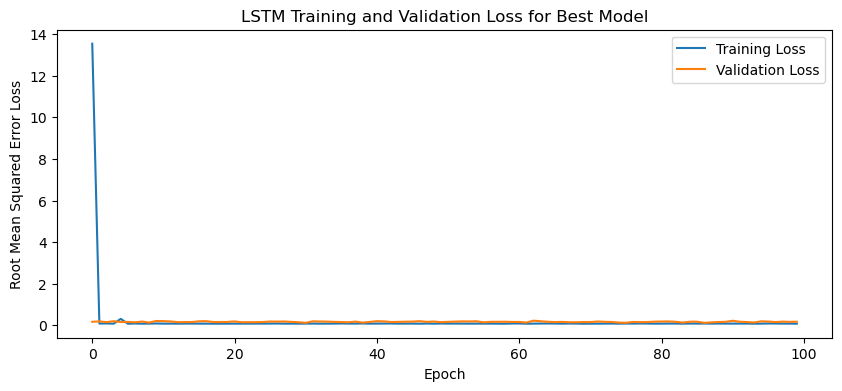

1/1 - 2s - loss: 0.0647 - 2s/epoch - 2s/step
Test Loss: 0.06471481174230576
1/1 [==============================] - 0s 31ms/step


IndexError: index 10 is out of bounds for axis 0 with size 10

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):

    cv_accuracies = []
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

# make forecast with the LSTM best model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test):
    # plot the entire dataset in blue
    plt.plot(series.values)
    # plot the forecasts in red
    for i in range(len(forecasts)):
        off_s = len(series) - n_test + i - 1
        off_e = off_s + len(forecasts[i]) + 1
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = [series.values[off_s]] + forecasts[i]
        plt.plot(xaxis, yaxis, color='red')
    # show the plot
    plt.show()
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

for i in range(5):
    print("Fold "+str(i+1)+":")
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
    X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
    X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)
    
    X = X.reshape(X.shape[0], 1, X.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history=best_model.fit(X, y, epochs=nb_epoch, batch_size=n_batch, validation_data=(X_val, y_val))

    # Plotting the training and validation loss
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title1 = "LSTM Training and Validation Loss for Best Model"
    plt.title(title1)
    plt.xlabel('Epoch')
    plt.ylabel('Root Mean Squared Error Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    for j in range(len(X_test)):
        print("Weather Station "+str(j+1)+":")
        dataset_df = pd.DataFrame(y_test[j].flatten())
        dataset = dataset_df.values
        dataset = dataset[:, 0]
        dataset = np.array(dataset).reshape(-1, 1)
        dataset = dataset.flatten()
        dataset = pd.DataFrame(dataset)
        series = scaler[i].inverse_transform(dataset)
        series = pd.Series(series.flatten())

    # plot forecasts
    plot_forecasts(series, forecasts, 1)
    
    best_model.summary()

    # Print out table of actual and predicted values for each weather station
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")

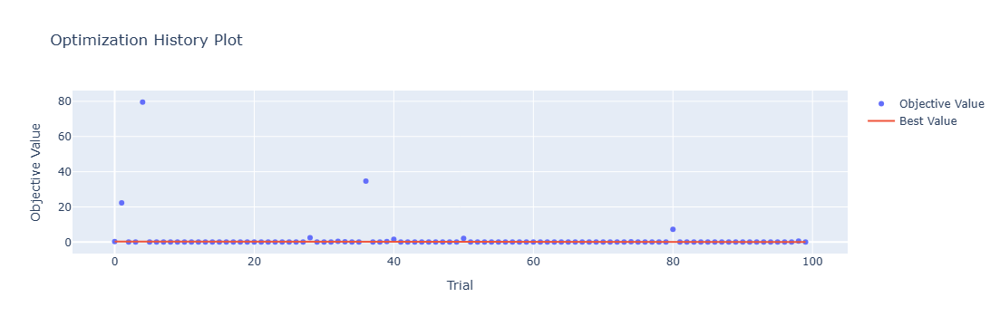

In [4]:
optuna.visualization.plot_optimization_history(study)

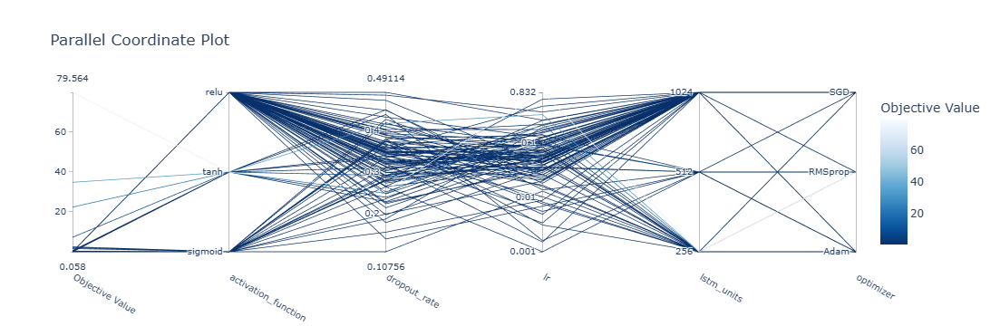

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

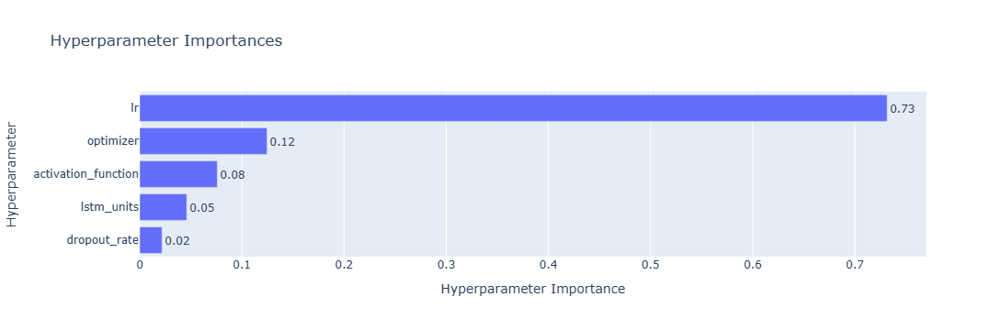

In [6]:
optuna.visualization.plot_param_importances(study)

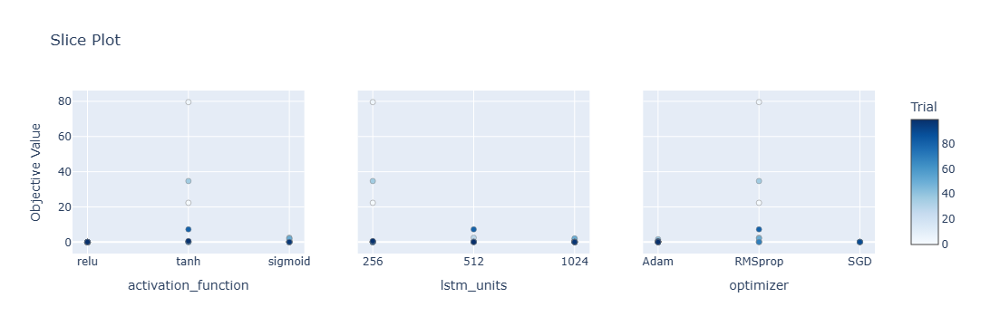

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

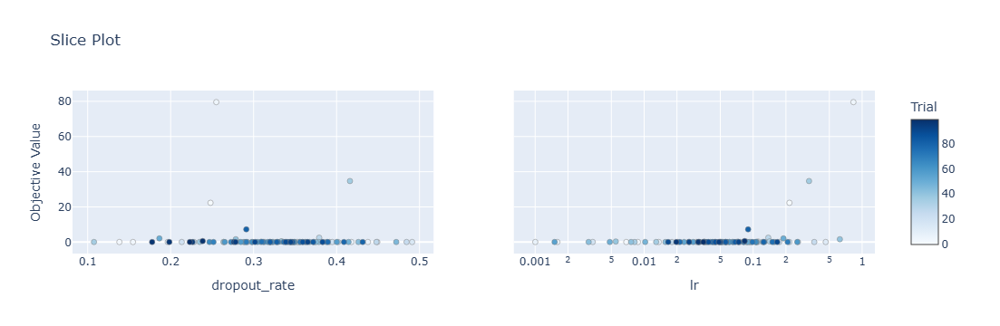

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

Epoch 1/100
84/84 [==============================] - 30s 170ms/step - loss: 10.7346 - accuracy: 0.3690 - mae: 10.5278 - rmse: 10.7346 - mape: 2205.9316 - pearson: 0.5298 - val_loss: 0.0845 - val_accuracy: 0.4000 - val_mae: 0.0654 - val_rmse: 0.0845 - val_mape: 15.9418 - val_pearson: 0.7166
Epoch 2/100
84/84 [==============================] - 9s 113ms/step - loss: 0.0809 - accuracy: 0.6429 - mae: 0.0641 - rmse: 0.0809 - mape: 14.5231 - pearson: 0.7563 - val_loss: 0.0759 - val_accuracy: 0.6000 - val_mae: 0.0581 - val_rmse: 0.0759 - val_mape: 13.7152 - val_pearson: 0.7713
Epoch 3/100
84/84 [==============================] - 10s 116ms/step - loss: 0.0741 - accuracy: 0.6548 - mae: 0.0580 - rmse: 0.0741 - mape: 12.9642 - pearson: 0.7918 - val_loss: 0.0947 - val_accuracy: 0.6000 - val_mae: 0.0704 - val_rmse: 0.0947 - val_mape: 15.1920 - val_pearson: 0.7810
Epoch 4/100
84/84 [==============================] - 10s 123ms/step - loss: 0.0764 - accuracy: 0.7262 - mae: 0.0597 - rmse: 0.0764 - mape:

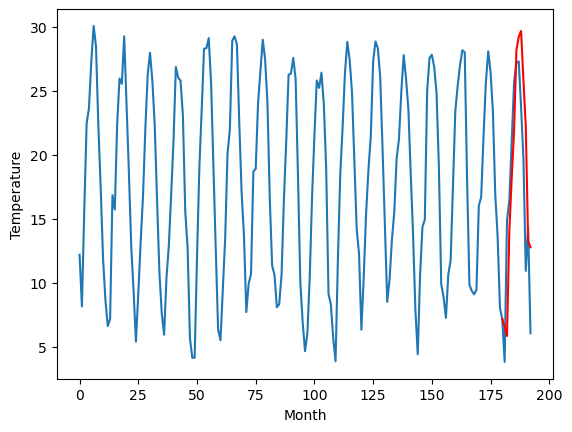

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.53		5.57		-2.96
8.44		4.89		-3.55
13.50		13.10		-0.40
14.90		17.18		2.28
18.92		20.81		1.89
22.40		27.20		4.80
23.62		28.26		4.64
23.96		28.71		4.75
21.83		24.85		3.02
19.20		21.22		2.02
13.69		12.28		-1.41
13.45		11.81		-1.64
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[13.23, 5.574408407211304, 4.88791650056839, 13.104968006610871, 17.180963928699494, 20.814575130939485, 27.199634487628938, 28.25605731725693, 28.70698907494545, 24.84822490334511, 21.22354343056679, 12.28127982735634, 11.81330570101738]


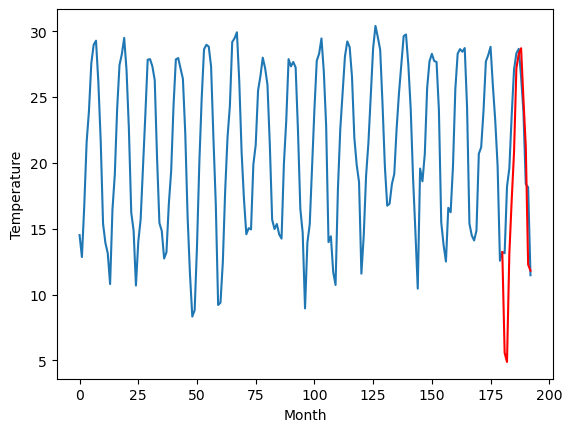

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.31		4.19		-3.12
8.17		3.51		-4.66
14.15		11.72		-2.43
15.79		15.80		0.01
19.77		19.43		-0.34
23.91		25.82		1.91
25.67		26.88		1.21
25.95		27.33		1.38
22.38		23.47		1.09
18.50		19.84		1.34
10.14		10.90		0.76
12.32		10.43		-1.89
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.18, 4.194408407211304, 3.50791650056839, 11.72496800661087, 15.800963928699494, 19.434575130939486, 25.81963448762894, 26.87605731725693, 27.326989074945452, 23.46822490334511, 19.84354343056679, 10.90127982735634, 10.433305701017382]


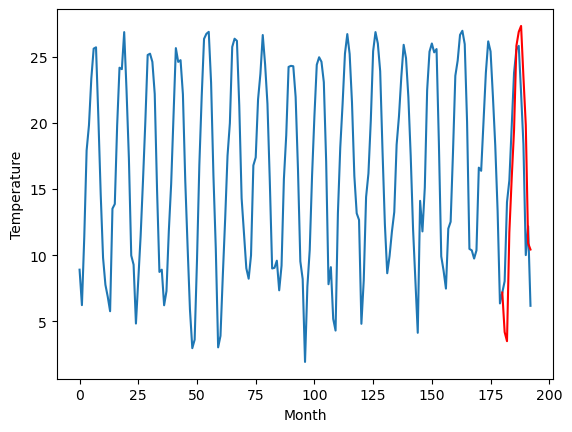

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.38		2.99		-2.39
3.81		2.31		-1.50
11.72		10.52		-1.20
13.51		14.60		1.09
17.48		18.23		0.75
20.76		24.62		3.86
21.39		25.68		4.29
21.44		26.13		4.69
18.93		22.27		3.34
16.62		18.64		2.02
8.53		9.70		1.17
11.30		9.23		-2.07
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.46, 2.9944084072113037, 2.30791650056839, 10.52496800661087, 14.600963928699493, 18.234575130939483, 24.619634487628936, 25.676057317256927, 26.12698907494545, 22.268224903345107, 18.643543430566787, 9.701279827356338, 9.233305701017379]


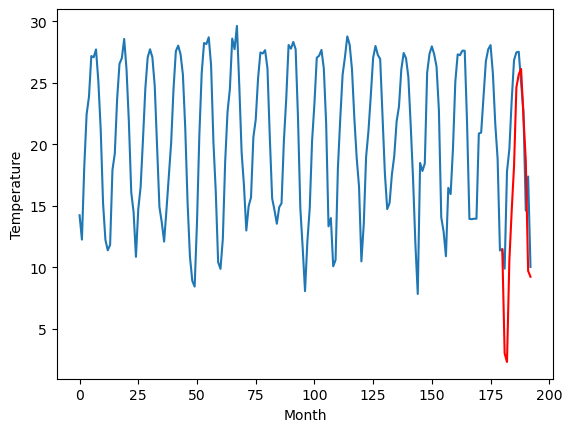

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.33		9.91		-1.42
8.24		9.23		0.99
18.14		17.44		-0.70
20.07		21.52		1.45
23.93		25.15		1.22
29.13		31.54		2.41
29.56		32.60		3.04
30.32		33.05		2.73
28.31		29.19		0.88
23.96		25.56		1.60
16.39		16.62		0.23
18.72		16.15		-2.57
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.27, 9.914408407211305, 9.22791650056839, 17.44496800661087, 21.520963928699494, 25.154575130939484, 31.539634487628938, 32.59605731725693, 33.04698907494545, 29.18822490334511, 25.56354343056679, 16.62127982735634, 16.15330570101738]


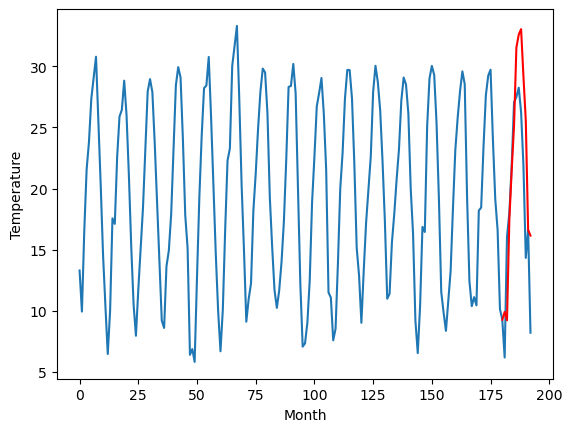

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.74		12.22		-0.52
13.39		11.54		-1.85
18.29		19.75		1.46
21.66		23.83		2.17
25.17		27.46		2.29
29.74		33.85		4.11
31.73		34.91		3.18
32.21		35.36		3.15
29.20		31.50		2.30
25.60		27.87		2.27
17.43		18.93		1.50
18.48		18.46		-0.02
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.77, 12.224408407211303, 11.53791650056839, 19.75496800661087, 23.830963928699493, 27.464575130939483, 33.84963448762893, 34.90605731725692, 35.356989074945446, 31.498224903345104, 27.873543430566784, 18.931279827356335, 18.463305701017376]


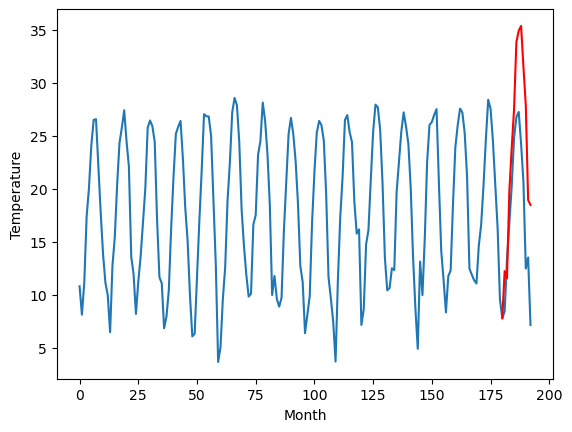

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.33		6.61		-1.72
8.97		5.93		-3.04
15.95		14.14		-1.81
16.98		18.22		1.24
20.69		21.85		1.16
25.02		28.24		3.22
26.64		29.30		2.66
26.58		29.75		3.17
22.53		25.89		3.36
19.30		22.26		2.96
10.65		13.32		2.67
12.59		12.85		0.26
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.59, 6.614408407211304, 5.92791650056839, 14.14496800661087, 18.220963928699494, 21.854575130939484, 28.239634487628937, 29.296057317256928, 29.74698907494545, 25.888224903345108, 22.263543430566788, 13.321279827356339, 12.85330570101738]


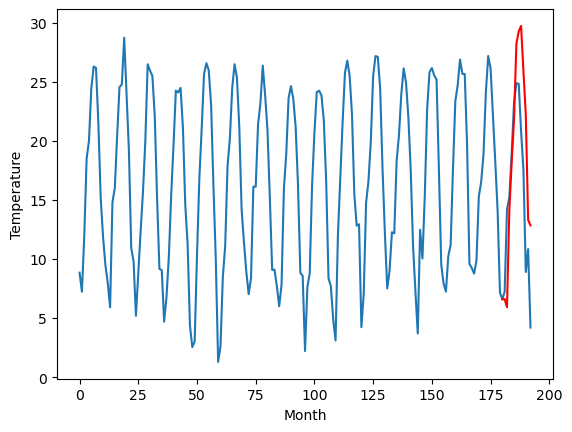

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.29		11.93		-1.36
13.91		11.25		-2.66
20.43		19.46		-0.97
24.06		23.54		-0.52
27.08		27.17		0.09
31.87		33.56		1.69
33.99		34.62		0.63
33.94		35.07		1.13
29.43		31.21		1.78
25.58		27.58		2.00
16.08		18.64		2.56
18.14		18.17		0.03
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.3, 11.934408407211304, 11.24791650056839, 19.46496800661087, 23.540963928699494, 27.174575130939484, 33.55963448762894, 34.61605731725693, 35.066989074945454, 31.208224903345112, 27.58354343056679, 18.641279827356342, 18.173305701017384]


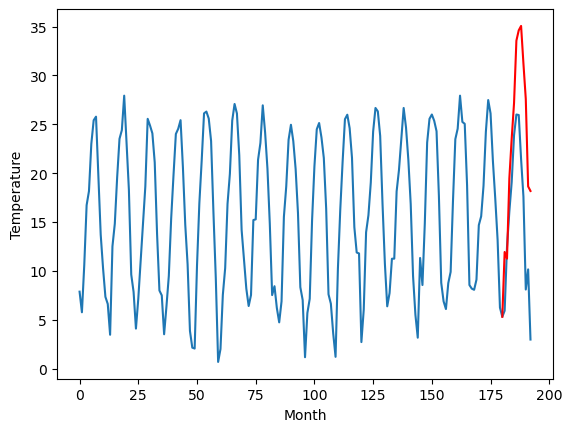

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.51		11.00		-1.51
8.24		10.32		2.08
20.71		18.53		-2.18
23.31		22.61		-0.70
28.00		26.24		-1.76
34.19		32.63		-1.56
34.76		33.69		-1.07
34.70		34.14		-0.56
30.96		30.28		-0.68
27.00		26.65		-0.35
16.96		17.71		0.75
18.76		17.24		-1.52
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.1, 11.004408407211304, 10.31791650056839, 18.53496800661087, 22.610963928699494, 26.244575130939484, 32.629634487628934, 33.686057317256925, 34.13698907494545, 30.278224903345105, 26.653543430566785, 17.711279827356336, 17.243305701017377]


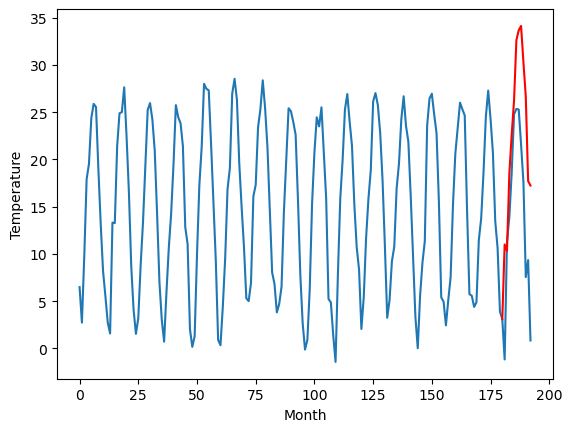

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.20		8.49		-0.71
7.03		7.81		0.78
17.78		16.02		-1.76
20.84		20.10		-0.74
25.31		23.73		-1.58
31.79		30.12		-1.67
32.80		31.18		-1.62
33.40		31.63		-1.77
29.54		27.77		-1.77
25.07		24.14		-0.93
14.41		15.20		0.79
15.64		14.73		-0.91
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[0.6, 8.494408407211303, 7.807916500568389, 16.02496800661087, 20.100963928699493, 23.734575130939483, 30.119634487628936, 31.176057317256927, 31.62698907494545, 27.768224903345107, 24.143543430566787, 15.201279827356338, 14.733305701017379]


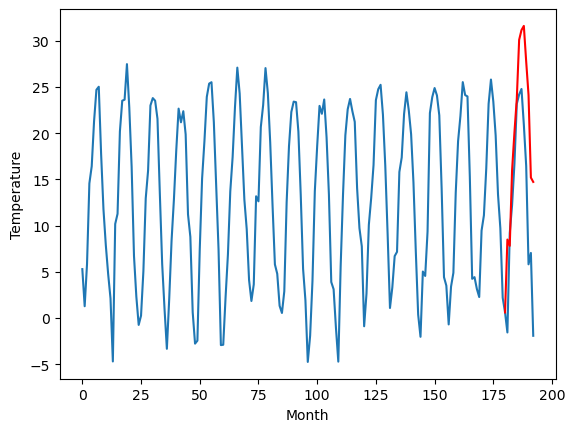

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.24		6.55		-0.69
2.93		5.87		2.94
14.66		14.08		-0.58
18.63		18.16		-0.47
23.78		21.79		-1.99
31.09		28.18		-2.91
31.68		29.24		-2.44
32.39		29.69		-2.70
28.34		25.83		-2.51
23.99		22.20		-1.79
13.13		13.26		0.13
12.23		12.79		0.56
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.75, 6.554408407211303, 5.8679165005683895, 14.08496800661087, 18.160963928699495, 21.794575130939485, 28.179634487628938, 29.23605731725693, 29.68698907494545, 25.82822490334511, 22.20354343056679, 13.26127982735634, 12.793305701017381]


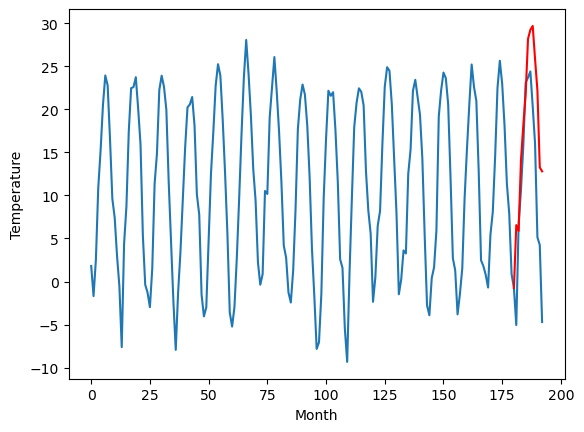

RangeIndex(start=1, stop=12, step=1)
[7.989999999999999, 8.53, 7.310000000000001, 5.3800000000000034, 11.33, 12.739999999999998, 8.33, 13.29, 12.51, 9.2, 7.24]
[6.554408407211303, 5.574408407211304, 4.194408407211304, 2.9944084072113037, 9.914408407211305, 12.224408407211303, 6.614408407211304, 11.934408407211304, 11.004408407211304, 8.494408407211303, 6.554408407211303]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    7.99   6.554408
1                 1    8.53   5.574408
2                 2    7.31   4.194408
3                 3    5.38   2.994408
4                 4   11.33   9.914408
5                 5   12.74  12.224408
6                 6    8.33   6.614408
7                 7   13.29  11.934408
8                 8   12.51  11.004408
9                 9    9.20   8.494408
10               10    7.24   6.554408


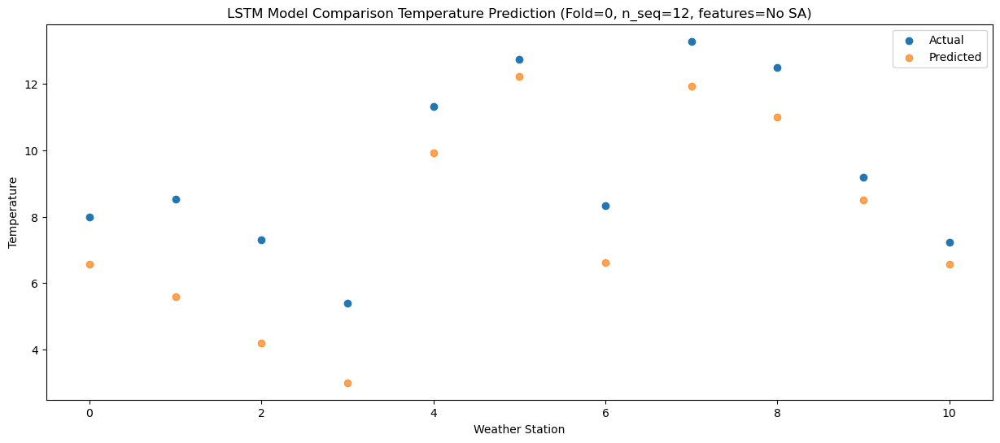

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.64   5.867917
1                 1    8.44   4.887917
2                 2    8.17   3.507917
3                 3    3.81   2.307917
4                 4    8.24   9.227917
5                 5   13.39  11.537917
6                 6    8.97   5.927917
7                 7   13.91  11.247917
8                 8    8.24  10.317917
9                 9    7.03   7.807917
10               10    2.93   5.867917


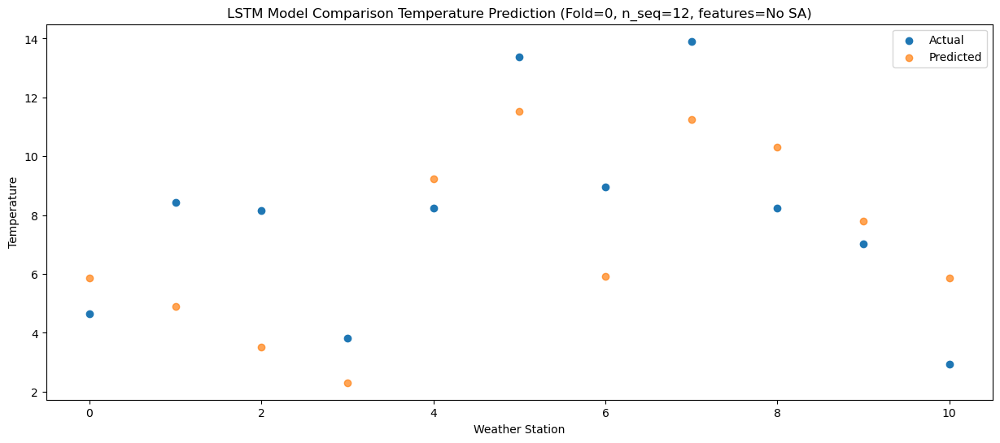

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   15.71  14.084968
1                 1   13.50  13.104968
2                 2   14.15  11.724968
3                 3   11.72  10.524968
4                 4   18.14  17.444968
5                 5   18.29  19.754968
6                 6   15.95  14.144968
7                 7   20.43  19.464968
8                 8   20.71  18.534968
9                 9   17.78  16.024968
10               10   14.66  14.084968


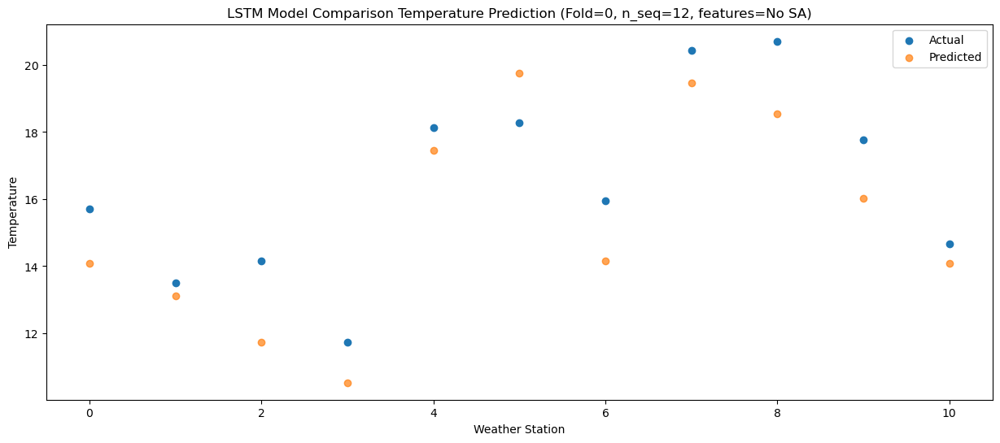

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   17.24  18.160964
1                 1   14.90  17.180964
2                 2   15.79  15.800964
3                 3   13.51  14.600964
4                 4   20.07  21.520964
5                 5   21.66  23.830964
6                 6   16.98  18.220964
7                 7   24.06  23.540964
8                 8   23.31  22.610964
9                 9   20.84  20.100964
10               10   18.63  18.160964


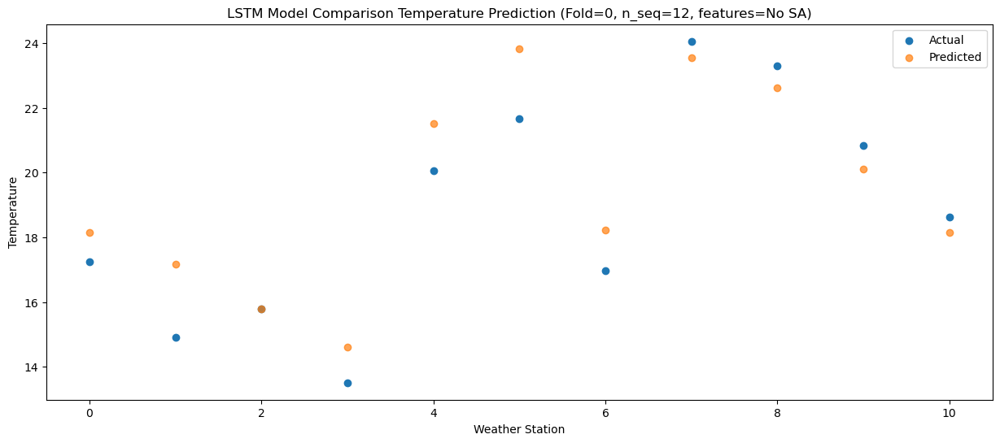

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   21.74  21.794575
1                 1   18.92  20.814575
2                 2   19.77  19.434575
3                 3   17.48  18.234575
4                 4   23.93  25.154575
5                 5   25.17  27.464575
6                 6   20.69  21.854575
7                 7   27.08  27.174575
8                 8   28.00  26.244575
9                 9   25.31  23.734575
10               10   23.78  21.794575


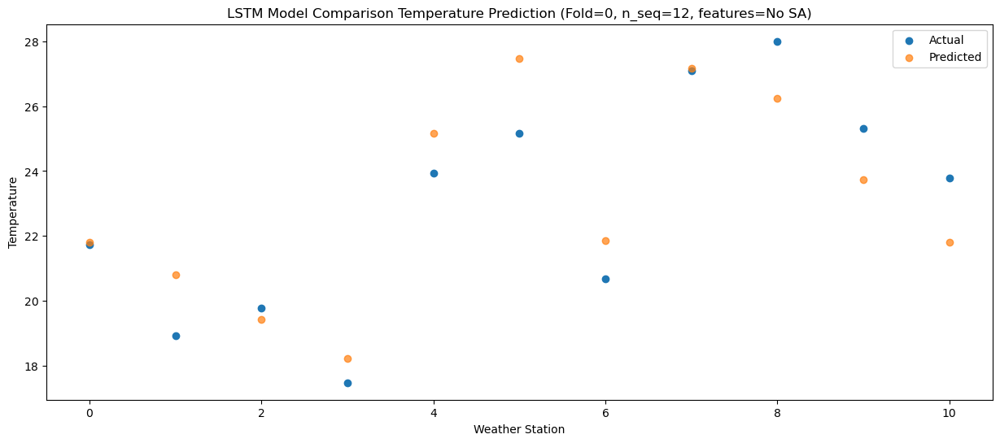

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   26.41  28.179634
1                 1   22.40  27.199634
2                 2   23.91  25.819634
3                 3   20.76  24.619634
4                 4   29.13  31.539634
5                 5   29.74  33.849634
6                 6   25.02  28.239634
7                 7   31.87  33.559634
8                 8   34.19  32.629634
9                 9   31.79  30.119634
10               10   31.09  28.179634


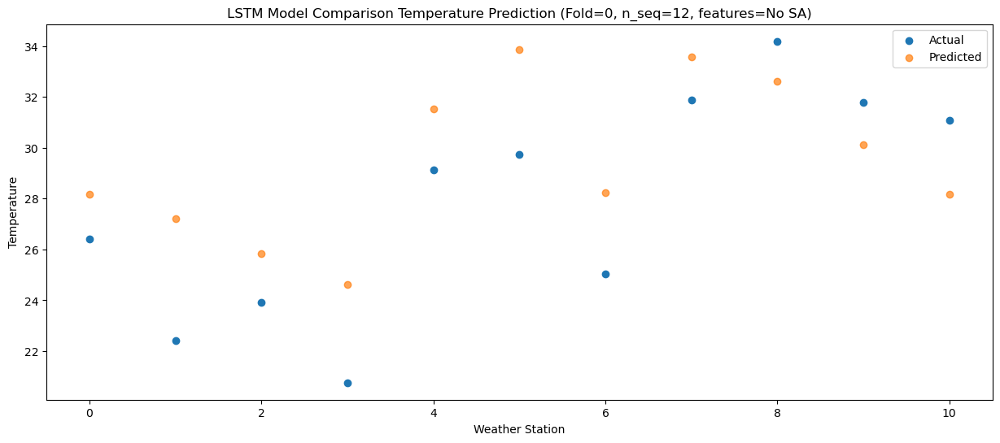

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   28.00  29.236057
1                 1   23.62  28.256057
2                 2   25.67  26.876057
3                 3   21.39  25.676057
4                 4   29.56  32.596057
5                 5   31.73  34.906057
6                 6   26.64  29.296057
7                 7   33.99  34.616057
8                 8   34.76  33.686057
9                 9   32.80  31.176057
10               10   31.68  29.236057


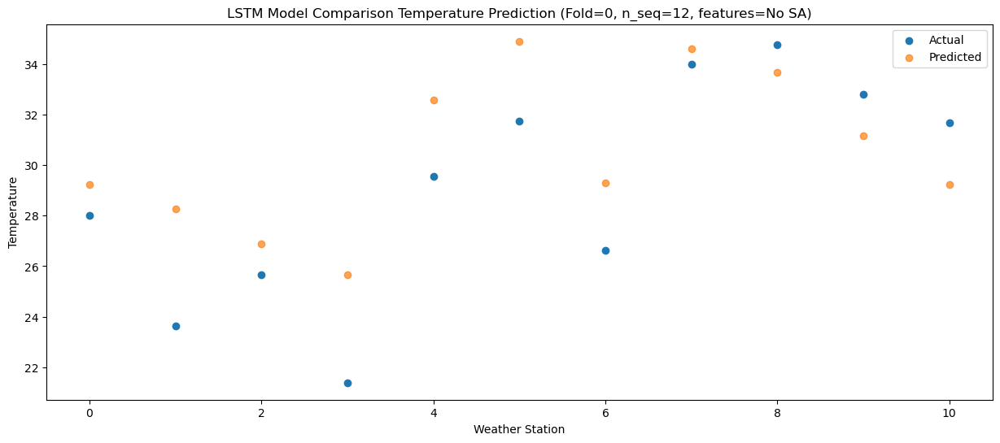

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   28.11  29.686989
1                 1   23.96  28.706989
2                 2   25.95  27.326989
3                 3   21.44  26.126989
4                 4   30.32  33.046989
5                 5   32.21  35.356989
6                 6   26.58  29.746989
7                 7   33.94  35.066989
8                 8   34.70  34.136989
9                 9   33.40  31.626989
10               10   32.39  29.686989


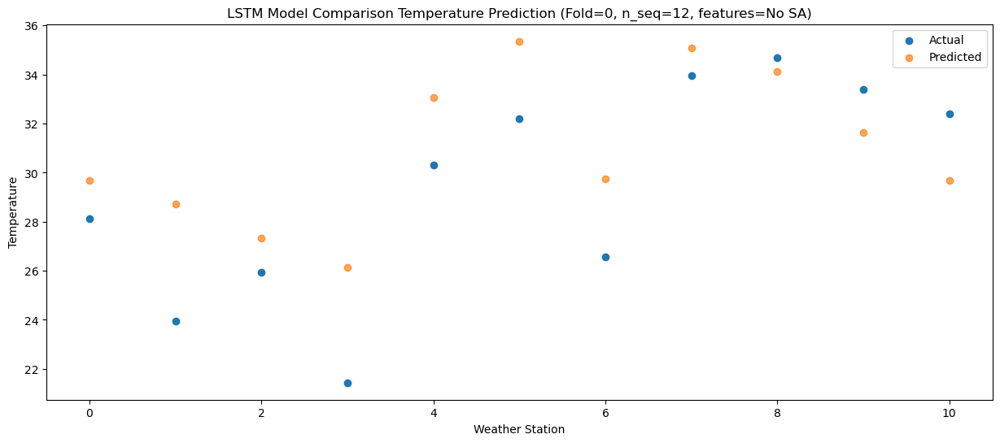

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   24.53  25.828225
1                 1   21.83  24.848225
2                 2   22.38  23.468225
3                 3   18.93  22.268225
4                 4   28.31  29.188225
5                 5   29.20  31.498225
6                 6   22.53  25.888225
7                 7   29.43  31.208225
8                 8   30.96  30.278225
9                 9   29.54  27.768225
10               10   28.34  25.828225


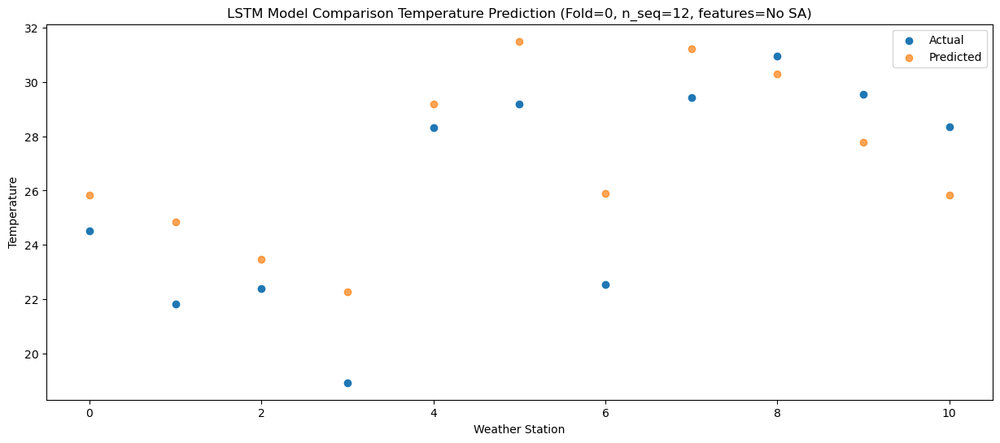

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   20.51  22.203543
1                 1   19.20  21.223543
2                 2   18.50  19.843543
3                 3   16.62  18.643543
4                 4   23.96  25.563543
5                 5   25.60  27.873543
6                 6   19.30  22.263543
7                 7   25.58  27.583543
8                 8   27.00  26.653543
9                 9   25.07  24.143543
10               10   23.99  22.203543


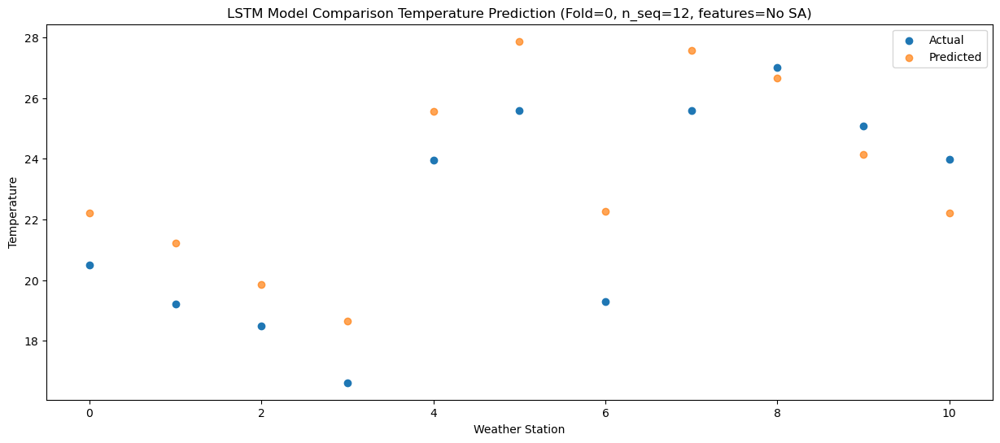

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0   11.75   13.26128
1                 1   13.69   12.28128
2                 2   10.14   10.90128
3                 3    8.53    9.70128
4                 4   16.39   16.62128
5                 5   17.43   18.93128
6                 6   10.65   13.32128
7                 7   16.08   18.64128
8                 8   16.96   17.71128
9                 9   14.41   15.20128
10               10   13.13   13.26128


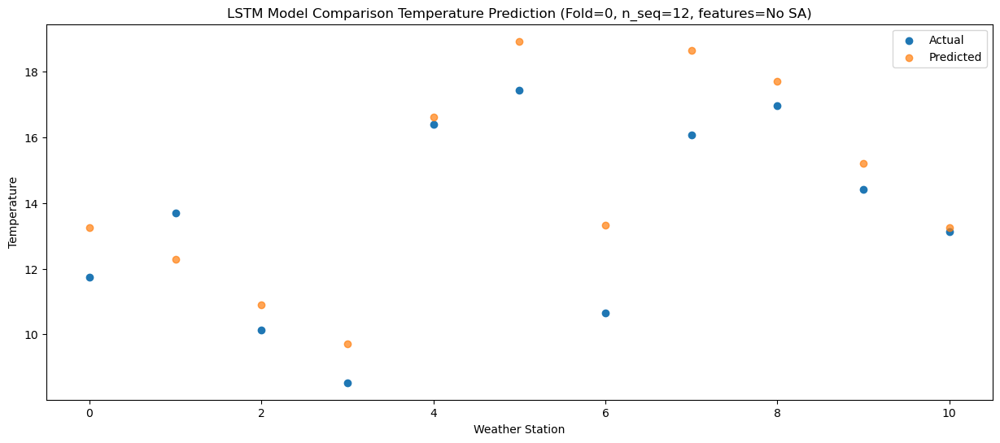

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   15.13  12.793306
1                 1   13.45  11.813306
2                 2   12.32  10.433306
3                 3   11.30   9.233306
4                 4   18.72  16.153306
5                 5   18.48  18.463306
6                 6   12.59  12.853306
7                 7   18.14  18.173306
8                 8   18.76  17.243306
9                 9   15.64  14.733306
10               10   12.23  12.793306


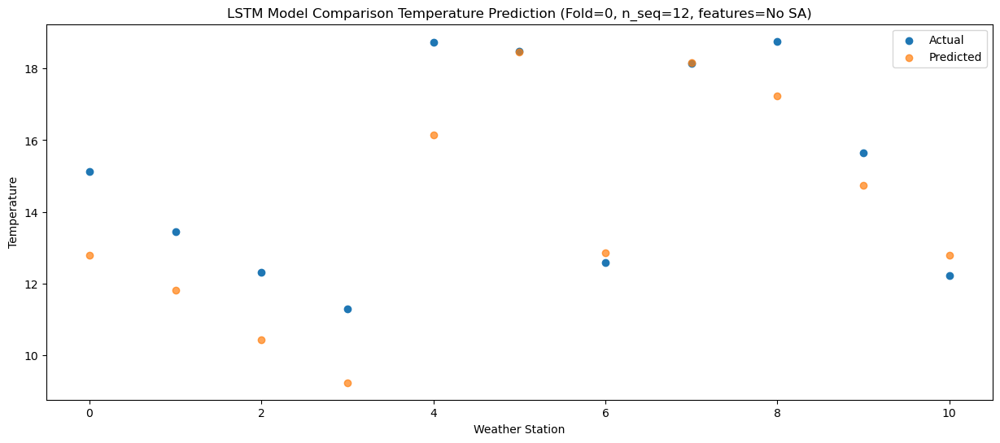

Model: "sequential_501"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1002 (LSTM)            (1, 1, 1024)              12263424  
                                                                 
 dropout_1002 (Dropout)      (1, 1, 1024)              0         
                                                                 
 lstm_1003 (LSTM)            (1, 1024)                 8392704   
                                                                 
 dropout_1003 (Dropout)      (1, 1024)                 0         
                                                                 
 dense_1503 (Dense)          (1, 256)                  262400    
                                                                 
 dense_1504 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1505 (Dense)          (1, 12)                

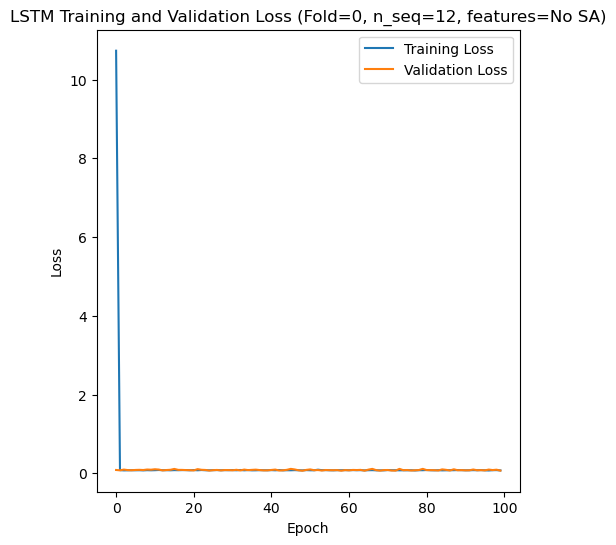

Epoch 1/100
84/84 [==============================] - 28s 149ms/step - loss: 9.1626 - accuracy: 0.4881 - mae: 8.9742 - rmse: 9.1626 - mape: 1927.0288 - pearson: 0.6077 - val_loss: 0.0803 - val_accuracy: 0.1000 - val_mae: 0.0640 - val_rmse: 0.0803 - val_mape: 14.4862 - val_pearson: 0.7737
Epoch 2/100
84/84 [==============================] - 9s 108ms/step - loss: 0.0807 - accuracy: 0.6071 - mae: 0.0628 - rmse: 0.0807 - mape: 14.0467 - pearson: 0.7684 - val_loss: 0.0758 - val_accuracy: 0.8000 - val_mae: 0.0583 - val_rmse: 0.0758 - val_mape: 13.1113 - val_pearson: 0.7923
Epoch 3/100
84/84 [==============================] - 9s 104ms/step - loss: 0.0829 - accuracy: 0.6429 - mae: 0.0663 - rmse: 0.0829 - mape: 14.8919 - pearson: 0.7698 - val_loss: 0.0842 - val_accuracy: 0.8000 - val_mae: 0.0614 - val_rmse: 0.0842 - val_mape: 13.7164 - val_pearson: 0.7735
Epoch 4/100
84/84 [==============================] - 9s 104ms/step - loss: 0.0799 - accuracy: 0.6071 - mae: 0.0643 - rmse: 0.0799 - mape: 14.5

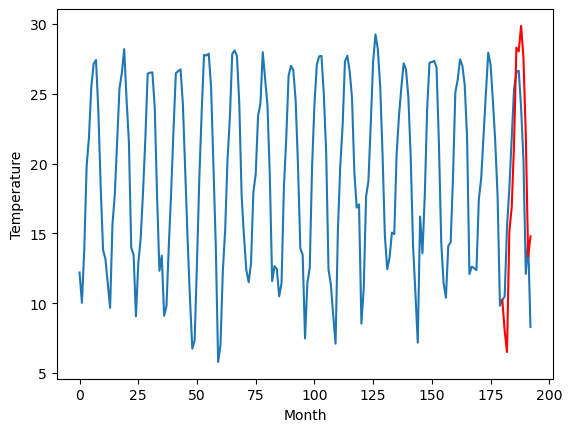

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.67		7.07		-0.60
8.33		5.52		-2.81
15.10		14.15		-0.95
17.24		15.89		-1.35
20.97		20.41		-0.56
25.11		27.34		2.23
26.49		27.07		0.58
26.76		28.89		2.13
23.02		26.64		3.62
19.24		21.05		1.81
11.58		12.36		0.78
13.21		13.81		0.60
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.41, 7.070445830821991, 5.520120317935944, 14.15228145837784, 15.885266835689546, 20.40745883703232, 27.339536244869233, 27.067466522455216, 28.89040496468544, 26.643171573877336, 21.052291179895402, 12.35501029610634, 13.807820106744767]


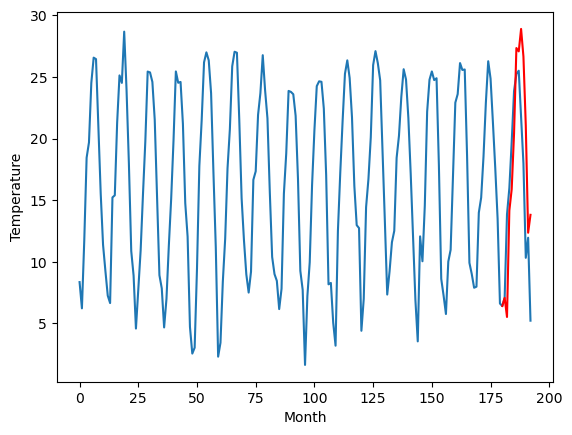

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.91		5.69		-1.22
7.40		4.14		-3.26
14.46		12.77		-1.69
15.86		14.51		-1.35
19.98		19.03		-0.95
23.86		25.96		2.10
24.63		25.69		1.06
25.29		27.51		2.22
22.27		25.26		2.99
18.49		19.67		1.18
10.75		10.98		0.23
13.35		12.43		-0.92
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.6, 5.690445830821991, 4.140120317935944, 12.772281458377838, 14.505266835689545, 19.02745883703232, 25.959536244869234, 25.687466522455217, 27.510404964685442, 25.263171573877337, 19.672291179895403, 10.97501029610634, 12.427820106744768]


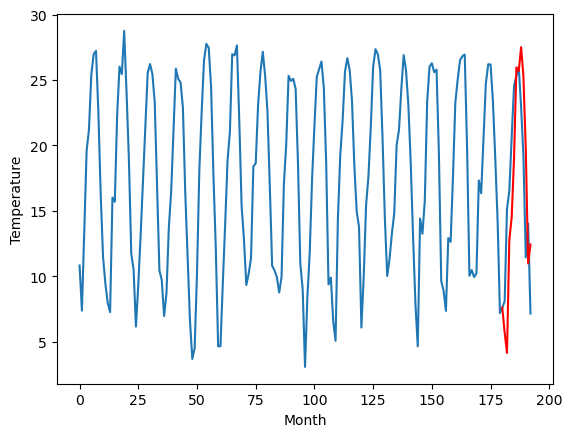

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.19		4.49		-0.70
3.60		2.94		-0.66
10.97		11.57		0.60
13.31		13.31		-0.00
17.20		17.83		0.63
21.09		24.76		3.67
20.97		24.49		3.52
21.94		26.31		4.37
18.93		24.06		5.13
16.24		18.47		2.23
9.08		9.78		0.70
12.45		11.23		-1.22
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.89, 4.490445830821991, 2.9401203179359436, 11.572281458377837, 13.305266835689544, 17.827458837032317, 24.75953624486923, 24.487466522455215, 26.31040496468544, 24.063171573877334, 18.4722911798954, 9.775010296106338, 11.227820106744765]


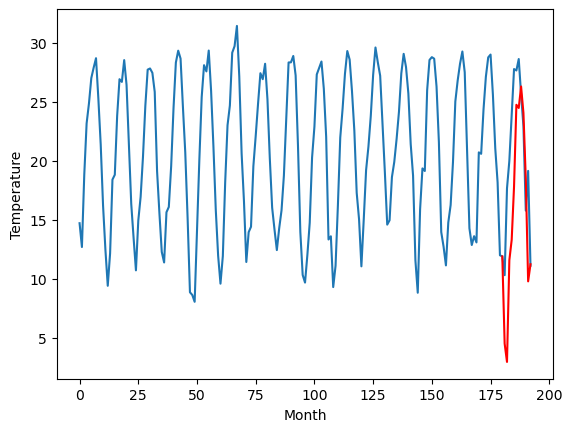

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.20		11.41		-0.79
10.50		9.86		-0.64
18.11		18.49		0.38
20.41		20.23		-0.18
24.53		24.75		0.22
28.00		31.68		3.68
28.09		31.41		3.32
29.06		33.23		4.17
25.48		30.98		5.50
22.44		25.39		2.95
14.89		16.70		1.81
18.77		18.15		-0.62
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[10.96, 11.410445830821992, 9.860120317935944, 18.49228145837784, 20.225266835689546, 24.74745883703232, 31.679536244869233, 31.407466522455216, 33.23040496468544, 30.983171573877335, 25.392291179895402, 16.69501029610634, 18.147820106744767]


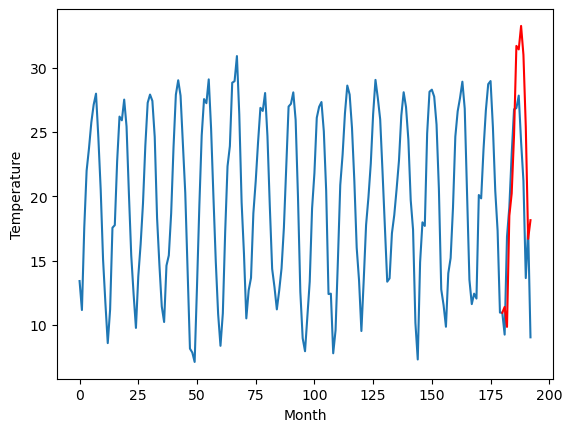

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.01		13.72		0.71
13.39		12.17		-1.22
20.73		20.80		0.07
23.00		22.54		-0.46
28.59		27.06		-1.53
32.86		33.99		1.13
32.20		33.72		1.52
31.61		35.54		3.93
31.25		33.29		2.04
26.93		27.70		0.77
20.46		19.01		-1.45
20.72		20.46		-0.26
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.75, 13.72044583082199, 12.170120317935943, 20.802281458377838, 22.535266835689544, 27.057458837032318, 33.98953624486923, 33.71746652245521, 35.540404964685436, 33.29317157387733, 27.702291179895397, 19.005010296106335, 20.457820106744762]


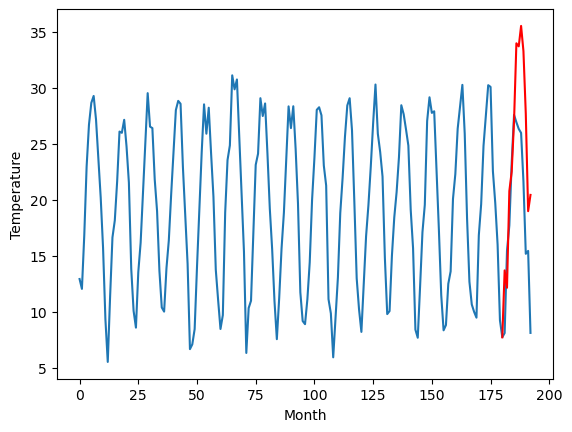

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.71		8.11		-0.60
9.49		6.56		-2.93
15.77		15.19		-0.58
18.34		16.93		-1.41
22.11		21.45		-0.66
26.12		28.38		2.26
27.48		28.11		0.63
27.74		29.93		2.19
24.41		27.68		3.27
20.46		22.09		1.63
12.86		13.40		0.54
14.38		14.85		0.47
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.17, 8.110445830821991, 6.560120317935944, 15.192281458377838, 16.925266835689545, 21.44745883703232, 28.379536244869232, 28.107466522455216, 29.93040496468544, 27.683171573877335, 22.0922911798954, 13.395010296106339, 14.847820106744766]


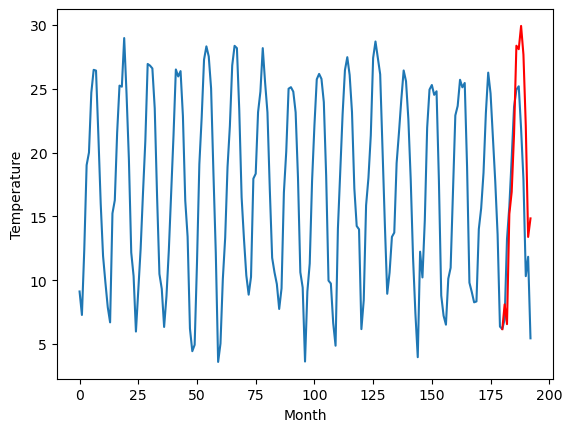

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.92		13.43		-0.49
10.92		11.88		0.96
22.24		20.51		-1.73
23.95		22.25		-1.70
28.61		26.77		-1.84
34.69		33.70		-0.99
35.68		33.43		-2.25
36.90		35.25		-1.65
33.19		33.00		-0.19
27.99		27.41		-0.58
18.69		18.72		0.03
21.10		20.17		-0.93
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.57, 13.430445830821991, 11.880120317935944, 20.51228145837784, 22.245266835689545, 26.76745883703232, 33.699536244869236, 33.42746652245522, 35.250404964685444, 33.00317157387734, 27.412291179895405, 18.715010296106342, 20.16782010674477]


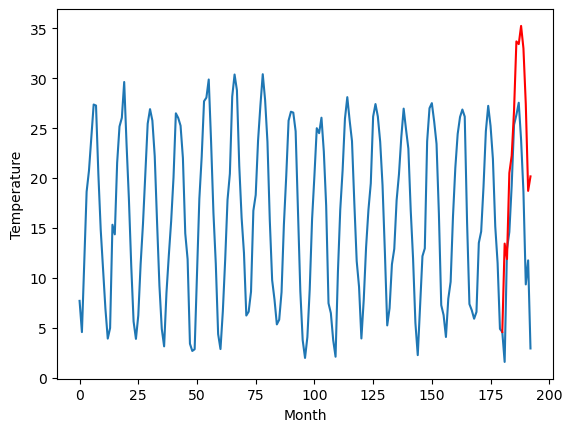

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.95		12.50		-0.45
8.17		10.95		2.78
20.73		19.58		-1.15
22.53		21.32		-1.21
27.34		25.84		-1.50
33.37		32.77		-0.60
34.88		32.50		-2.38
35.27		34.32		-0.95
32.76		32.07		-0.69
26.51		26.48		-0.03
18.76		17.79		-0.97
17.95		19.24		1.29
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.46, 12.500445830821992, 10.950120317935944, 19.58228145837784, 21.315266835689545, 25.83745883703232, 32.76953624486923, 32.49746652245521, 34.32040496468544, 32.07317157387733, 26.482291179895398, 17.785010296106336, 19.237820106744763]


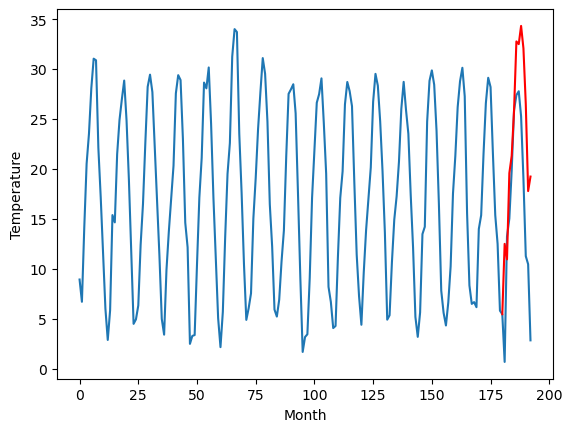

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.90		9.99		-0.91
6.53		8.44		1.91
17.24		17.07		-0.17
21.00		18.81		-2.19
25.55		23.33		-2.22
32.66		30.26		-2.40
33.33		29.99		-3.34
33.18		31.81		-1.37
31.23		29.56		-1.67
23.79		23.97		0.18
17.54		15.28		-2.26
15.93		16.73		0.80
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.42, 9.99044583082199, 8.440120317935943, 17.072281458377837, 18.805266835689544, 23.327458837032317, 30.25953624486923, 29.987466522455215, 31.81040496468544, 29.563171573877334, 23.9722911798954, 15.275010296106338, 16.727820106744765]


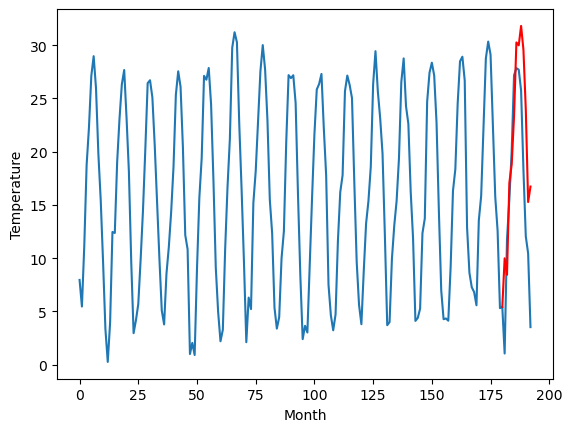

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.01		8.05		1.04
6.05		6.50		0.45
13.27		15.13		1.86
17.92		16.87		-1.05
22.46		21.39		-1.07
28.55		28.32		-0.23
30.78		28.05		-2.73
30.56		29.87		-0.69
26.86		27.62		0.76
22.44		22.03		-0.41
13.12		13.34		0.22
12.35		14.79		2.44
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.17, 8.05044583082199, 6.500120317935943, 15.132281458377838, 16.865266835689546, 21.38745883703232, 28.319536244869234, 28.047466522455217, 29.87040496468544, 27.623171573877336, 22.032291179895402, 13.33501029610634, 14.787820106744768]


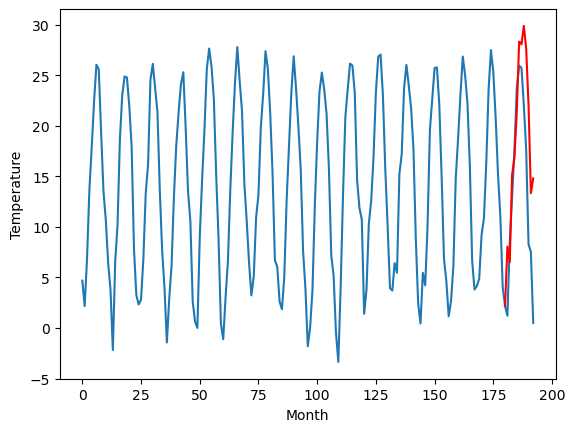

RangeIndex(start=1, stop=12, step=1)
[9.27, 7.669999999999999, 6.91, 5.1899999999999995, 12.2, 13.01, 8.709999999999999, 13.92, 12.950000000000001, 10.9, 7.01]
[8.05044583082199, 7.070445830821991, 5.690445830821991, 4.490445830821991, 11.410445830821992, 13.72044583082199, 8.110445830821991, 13.430445830821991, 12.500445830821992, 9.99044583082199, 8.05044583082199]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    9.27   8.050446
1                 1    7.67   7.070446
2                 2    6.91   5.690446
3                 3    5.19   4.490446
4                 4   12.20  11.410446
5                 5   13.01  13.720446
6                 6    8.71   8.110446
7                 7   13.92  13.430446
8                 8   12.95  12.500446
9                 9   10.90   9.990446
10               10    7.01   8.050446


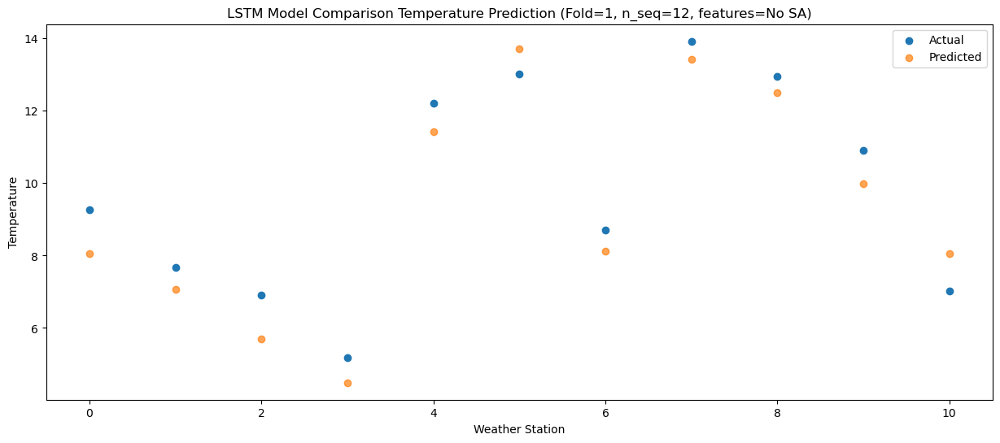

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    9.49    6.50012
1                 1    8.33    5.52012
2                 2    7.40    4.14012
3                 3    3.60    2.94012
4                 4   10.50    9.86012
5                 5   13.39   12.17012
6                 6    9.49    6.56012
7                 7   10.92   11.88012
8                 8    8.17   10.95012
9                 9    6.53    8.44012
10               10    6.05    6.50012


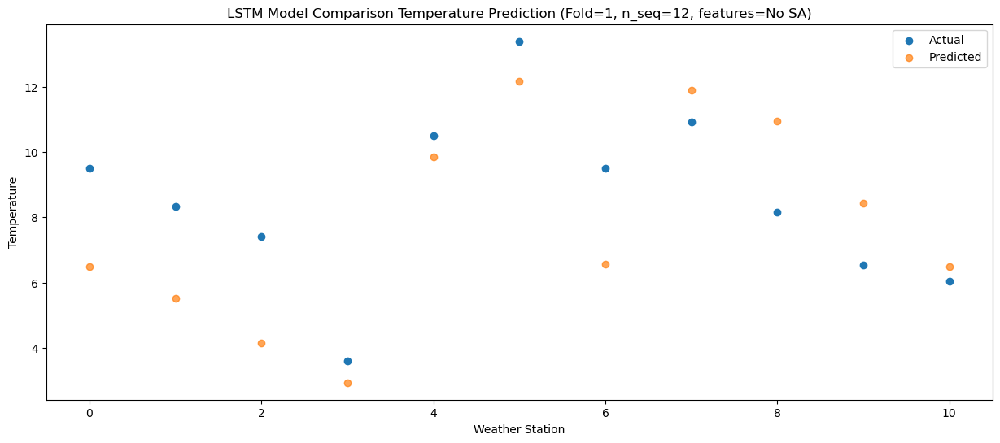

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   14.47  15.132281
1                 1   15.10  14.152281
2                 2   14.46  12.772281
3                 3   10.97  11.572281
4                 4   18.11  18.492281
5                 5   20.73  20.802281
6                 6   15.77  15.192281
7                 7   22.24  20.512281
8                 8   20.73  19.582281
9                 9   17.24  17.072281
10               10   13.27  15.132281


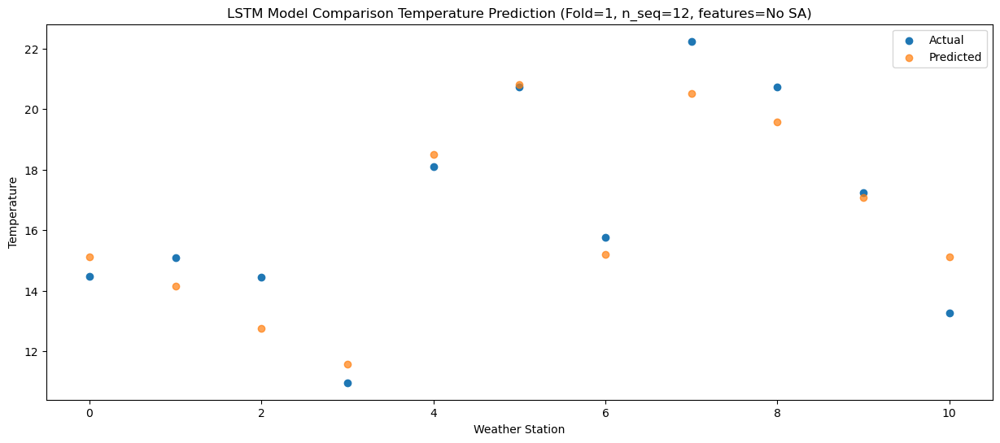

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   17.28  16.865267
1                 1   17.24  15.885267
2                 2   15.86  14.505267
3                 3   13.31  13.305267
4                 4   20.41  20.225267
5                 5   23.00  22.535267
6                 6   18.34  16.925267
7                 7   23.95  22.245267
8                 8   22.53  21.315267
9                 9   21.00  18.805267
10               10   17.92  16.865267


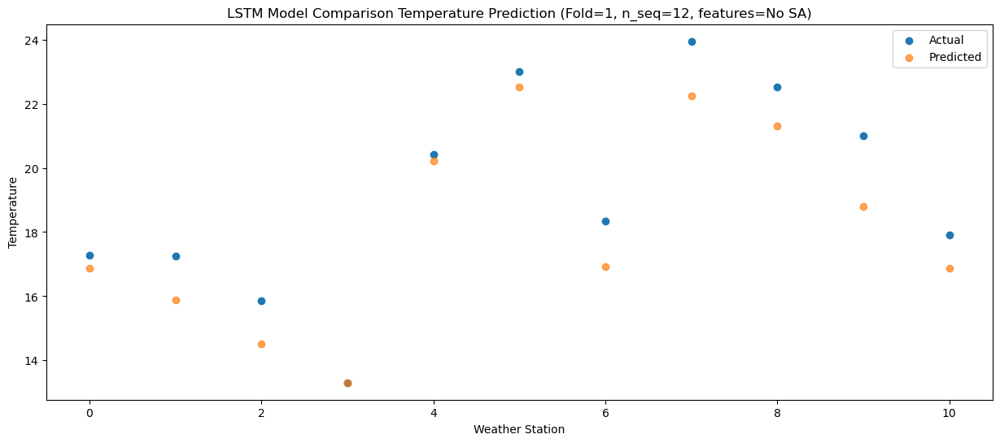

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   20.89  21.387459
1                 1   20.97  20.407459
2                 2   19.98  19.027459
3                 3   17.20  17.827459
4                 4   24.53  24.747459
5                 5   28.59  27.057459
6                 6   22.11  21.447459
7                 7   28.61  26.767459
8                 8   27.34  25.837459
9                 9   25.55  23.327459
10               10   22.46  21.387459


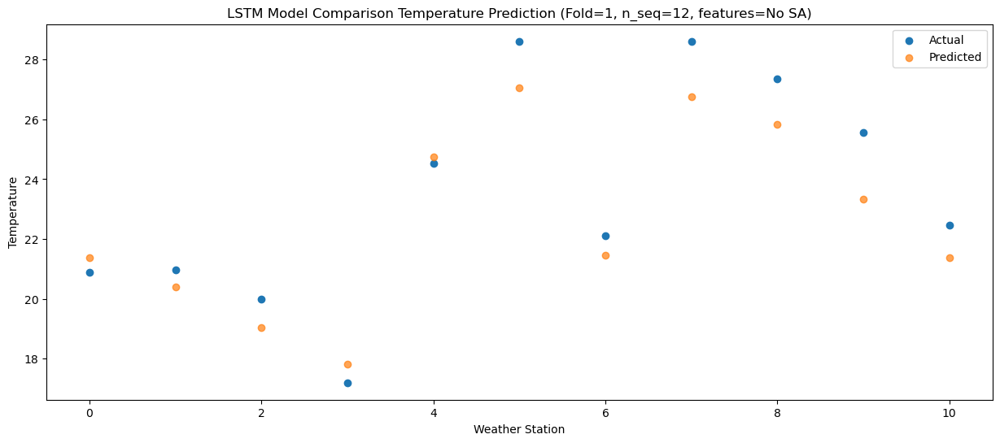

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   24.38  28.319536
1                 1   25.11  27.339536
2                 2   23.86  25.959536
3                 3   21.09  24.759536
4                 4   28.00  31.679536
5                 5   32.86  33.989536
6                 6   26.12  28.379536
7                 7   34.69  33.699536
8                 8   33.37  32.769536
9                 9   32.66  30.259536
10               10   28.55  28.319536


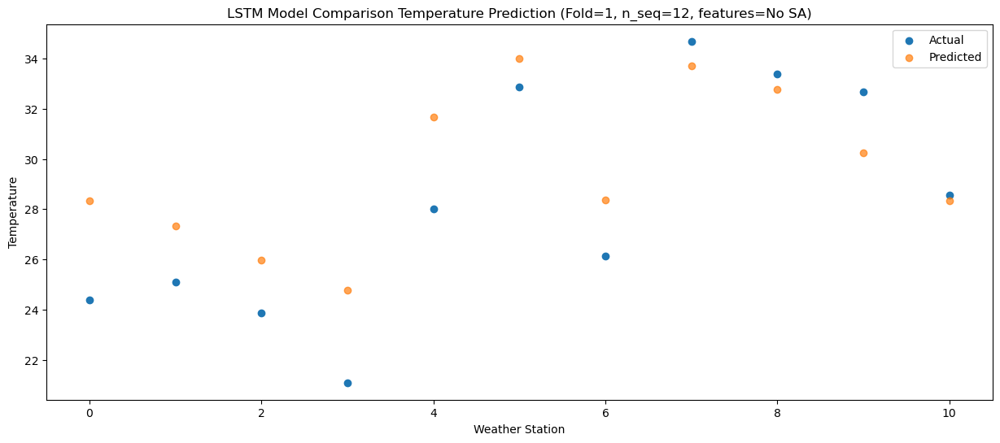

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   25.58  28.047467
1                 1   26.49  27.067467
2                 2   24.63  25.687467
3                 3   20.97  24.487467
4                 4   28.09  31.407467
5                 5   32.20  33.717467
6                 6   27.48  28.107467
7                 7   35.68  33.427467
8                 8   34.88  32.497467
9                 9   33.33  29.987467
10               10   30.78  28.047467


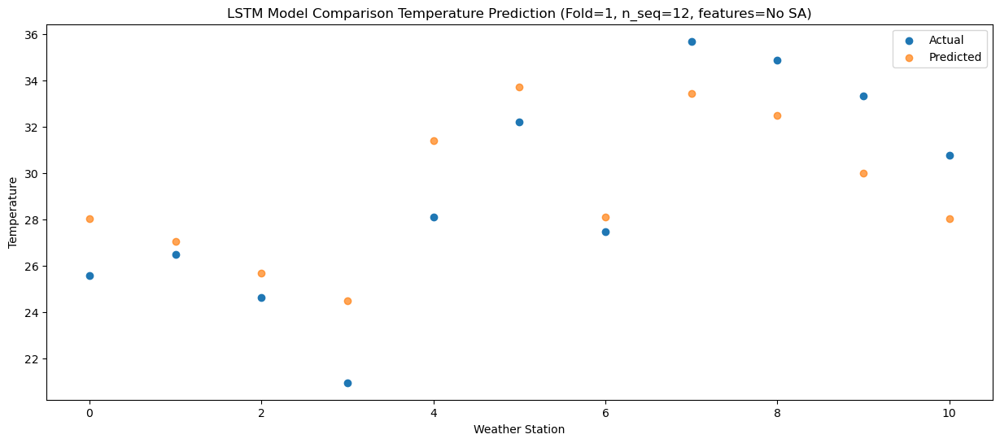

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   25.69  29.870405
1                 1   26.76  28.890405
2                 2   25.29  27.510405
3                 3   21.94  26.310405
4                 4   29.06  33.230405
5                 5   31.61  35.540405
6                 6   27.74  29.930405
7                 7   36.90  35.250405
8                 8   35.27  34.320405
9                 9   33.18  31.810405
10               10   30.56  29.870405


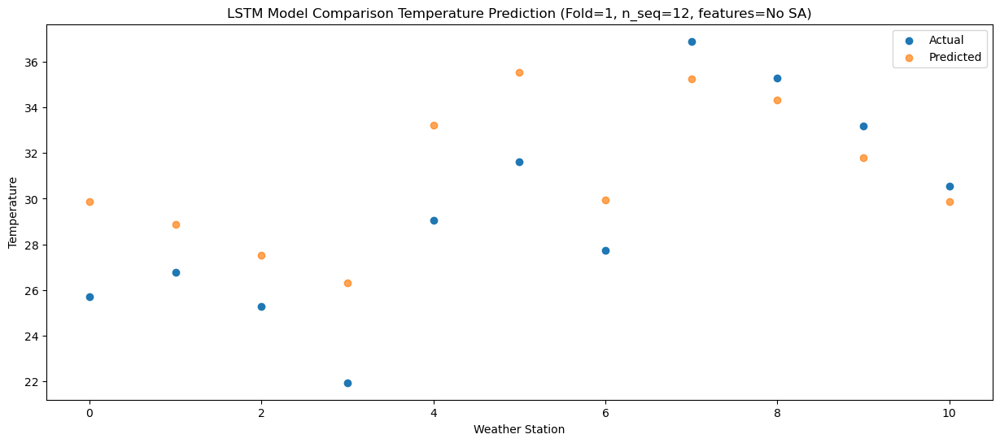

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   23.04  27.623172
1                 1   23.02  26.643172
2                 2   22.27  25.263172
3                 3   18.93  24.063172
4                 4   25.48  30.983172
5                 5   31.25  33.293172
6                 6   24.41  27.683172
7                 7   33.19  33.003172
8                 8   32.76  32.073172
9                 9   31.23  29.563172
10               10   26.86  27.623172


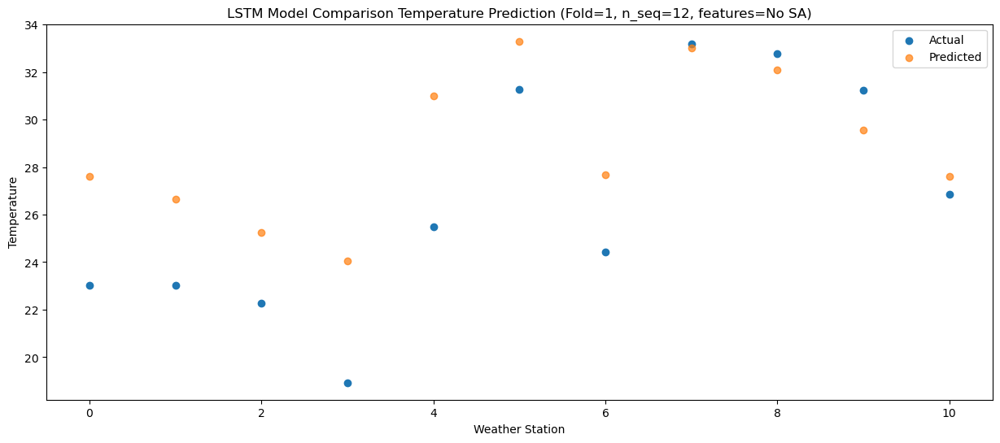

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   19.34  22.032291
1                 1   19.24  21.052291
2                 2   18.49  19.672291
3                 3   16.24  18.472291
4                 4   22.44  25.392291
5                 5   26.93  27.702291
6                 6   20.46  22.092291
7                 7   27.99  27.412291
8                 8   26.51  26.482291
9                 9   23.79  23.972291
10               10   22.44  22.032291


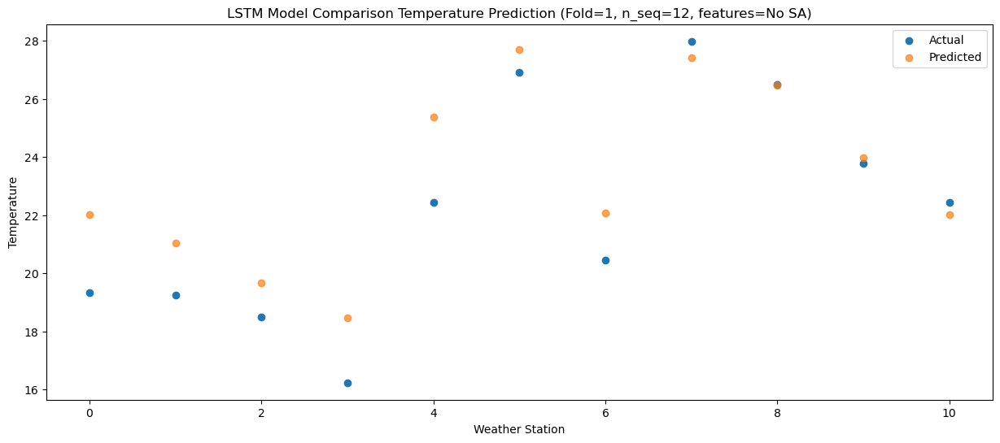

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0   11.13   13.33501
1                 1   11.58   12.35501
2                 2   10.75   10.97501
3                 3    9.08    9.77501
4                 4   14.89   16.69501
5                 5   20.46   19.00501
6                 6   12.86   13.39501
7                 7   18.69   18.71501
8                 8   18.76   17.78501
9                 9   17.54   15.27501
10               10   13.12   13.33501


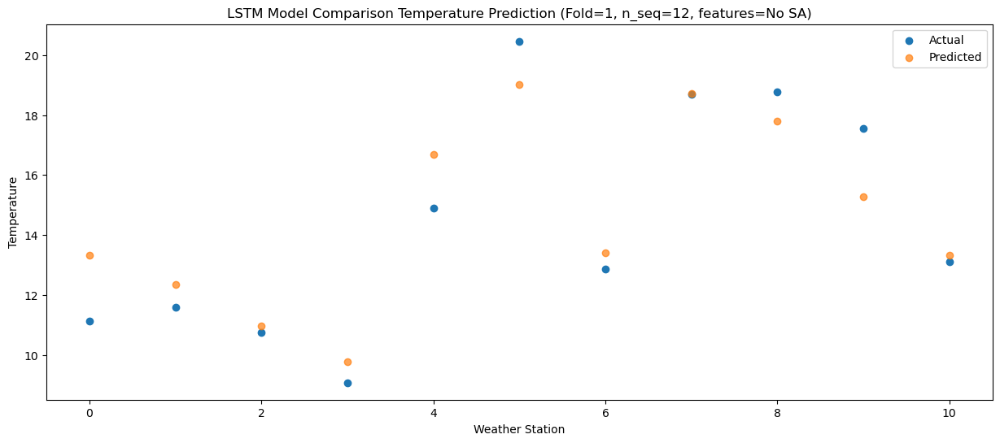

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   13.48   14.78782
1                 1   13.21   13.80782
2                 2   13.35   12.42782
3                 3   12.45   11.22782
4                 4   18.77   18.14782
5                 5   20.72   20.45782
6                 6   14.38   14.84782
7                 7   21.10   20.16782
8                 8   17.95   19.23782
9                 9   15.93   16.72782
10               10   12.35   14.78782


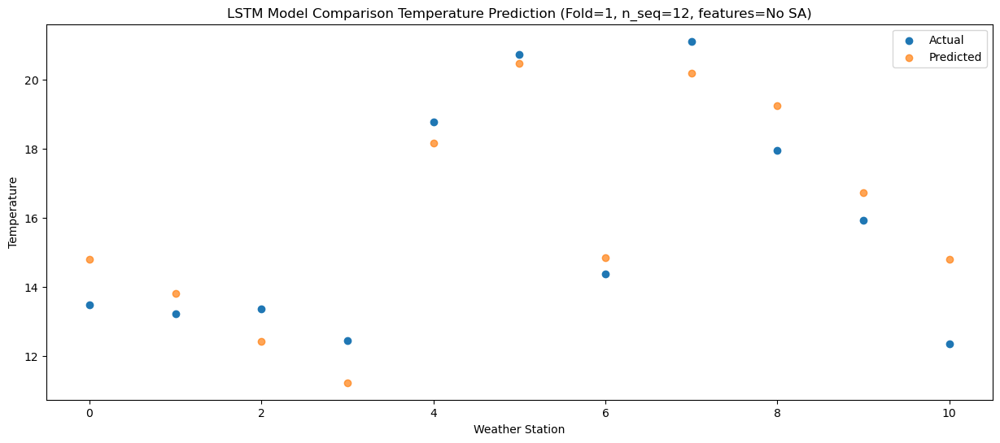

Model: "sequential_502"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1004 (LSTM)            (1, 1, 1024)              12263424  
                                                                 
 dropout_1004 (Dropout)      (1, 1, 1024)              0         
                                                                 
 lstm_1005 (LSTM)            (1, 1024)                 8392704   
                                                                 
 dropout_1005 (Dropout)      (1, 1024)                 0         
                                                                 
 dense_1506 (Dense)          (1, 256)                  262400    
                                                                 
 dense_1507 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1508 (Dense)          (1, 12)                

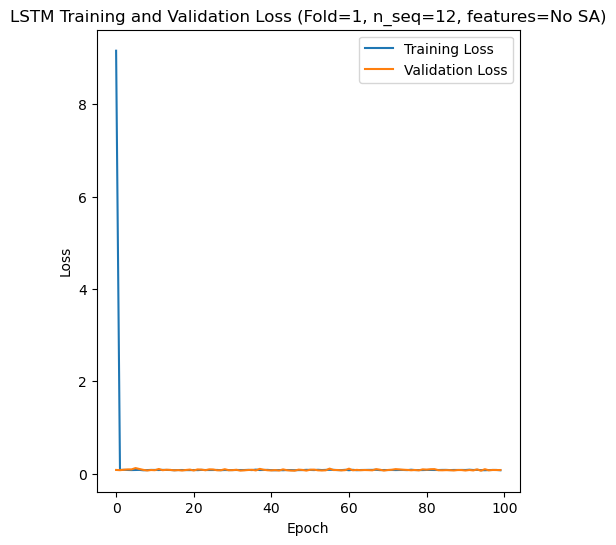

Epoch 1/100
84/84 [==============================] - 32s 164ms/step - loss: 11.3209 - accuracy: 0.4881 - mae: 11.0611 - rmse: 11.3209 - mape: 2356.4885 - pearson: 0.4872 - val_loss: 0.1006 - val_accuracy: 0.9000 - val_mae: 0.0783 - val_rmse: 0.1006 - val_mape: 20.8202 - val_pearson: 0.7130
Epoch 2/100
84/84 [==============================] - 9s 109ms/step - loss: 0.2827 - accuracy: 0.6310 - mae: 0.2592 - rmse: 0.2827 - mape: 58.2802 - pearson: 0.7515 - val_loss: 0.0793 - val_accuracy: 0.9000 - val_mae: 0.0618 - val_rmse: 0.0793 - val_mape: 15.5675 - val_pearson: 0.8408
Epoch 3/100
84/84 [==============================] - 9s 107ms/step - loss: 0.0817 - accuracy: 0.6429 - mae: 0.0642 - rmse: 0.0817 - mape: 14.7158 - pearson: 0.7646 - val_loss: 0.0453 - val_accuracy: 0.9000 - val_mae: 0.0345 - val_rmse: 0.0453 - val_mape: 7.5154 - val_pearson: 0.9229
Epoch 4/100
84/84 [==============================] - 9s 109ms/step - loss: 0.0805 - accuracy: 0.6429 - mae: 0.0635 - rmse: 0.0805 - mape: 14

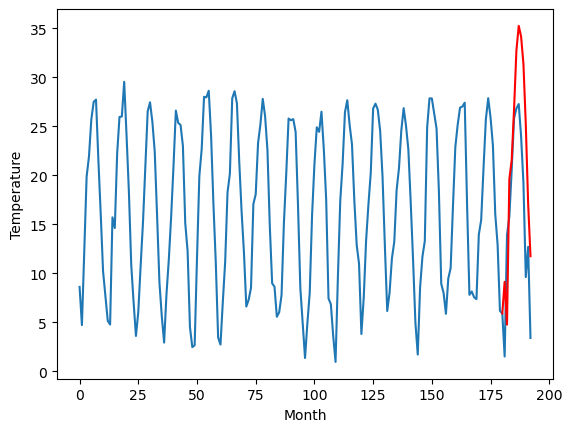

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.79		8.15		0.36
3.75		3.78		0.03
13.94		18.64		4.70
17.70		20.58		2.88
22.88		25.75		2.87
30.13		31.74		1.61
30.82		34.28		3.46
31.58		33.20		1.62
29.34		30.40		1.06
21.08		24.23		3.15
14.37		16.17		1.80
11.98		10.76		-1.22
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.63, 8.152154440879823, 3.7794098806381236, 18.641085143089295, 20.580326313972474, 25.747491116523744, 31.743802781105042, 34.276233906745915, 33.200141425132756, 30.40141343593598, 24.22685813426972, 16.167971606254582, 10.761645789146428]


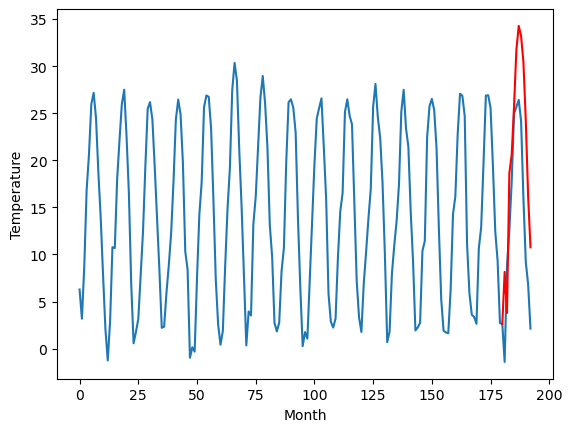

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.15		6.77		-0.38
9.88		2.40		-7.48
11.69		17.26		5.57
13.50		19.20		5.70
17.08		24.37		7.29
18.30		30.36		12.06
19.09		32.90		13.81
19.14		31.82		12.68
17.86		29.02		11.16
16.72		22.85		6.13
9.87		14.79		4.92
10.77		9.38		-1.39
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[16.55, 6.772154440879822, 2.3994098806381228, 17.261085143089296, 19.200326313972475, 24.367491116523745, 30.363802781105043, 32.89623390674591, 31.820141425132753, 29.021413435935976, 22.846858134269716, 14.78797160625458, 9.381645789146425]


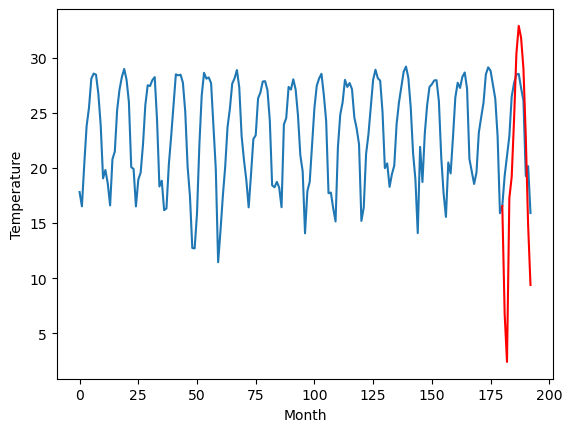

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.21		5.57		3.36
2.23		1.20		-1.03
6.34		16.06		9.72
10.84		18.00		7.16
16.10		23.17		7.07
21.67		29.16		7.49
23.67		31.70		8.03
24.73		30.62		5.89
21.56		27.82		6.26
17.73		21.65		3.92
9.65		13.59		3.94
7.73		8.18		0.45
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.83, 5.572154440879822, 1.1994098806381226, 16.061085143089294, 18.000326313972472, 23.167491116523742, 29.16380278110504, 31.69623390674591, 30.62014142513275, 27.821413435935973, 21.646858134269714, 13.587971606254577, 8.181645789146422]


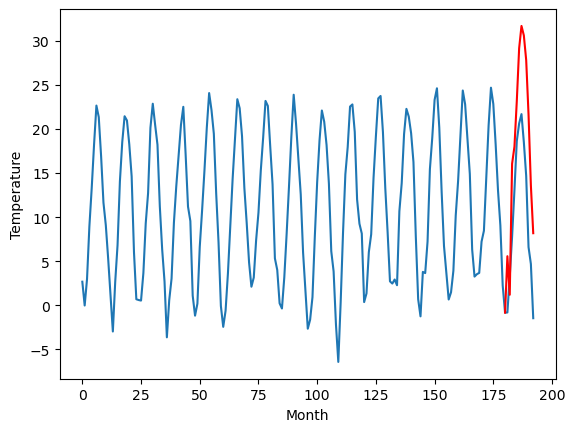

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.56		12.49		-0.07
11.82		8.12		-3.70
19.15		22.98		3.83
20.02		24.92		4.90
24.49		30.09		5.60
27.97		36.08		8.11
28.56		38.62		10.06
28.73		37.54		8.81
26.19		34.74		8.55
23.45		28.57		5.12
15.18		20.51		5.33
18.59		15.10		-3.49
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.52, 12.492154440879823, 8.119409880638123, 22.981085143089295, 24.920326313972474, 30.087491116523744, 36.08380278110504, 38.61623390674591, 37.54014142513275, 34.741413435935975, 28.566858134269715, 20.50797160625458, 15.101645789146424]


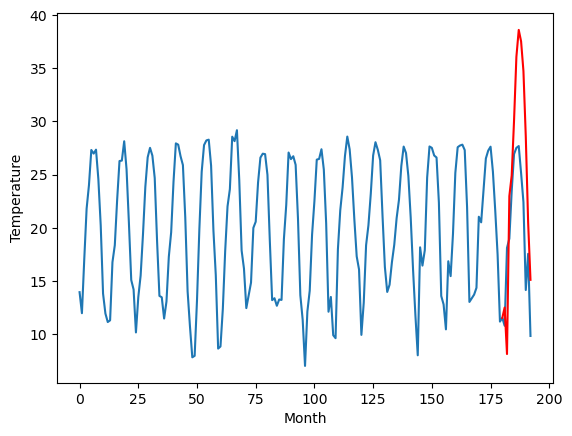

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.93		14.80		0.87
11.58		10.43		-1.15
19.96		25.29		5.33
22.08		27.23		5.15
26.12		32.40		6.28
30.67		38.39		7.72
30.75		40.93		10.18
31.86		39.85		7.99
29.12		37.05		7.93
25.82		30.88		5.06
18.18		22.82		4.64
21.42		17.41		-4.01
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.47, 14.802154440879821, 10.429409880638122, 25.291085143089294, 27.230326313972473, 32.39749111652374, 38.39380278110504, 40.92623390674591, 39.85014142513275, 37.05141343593597, 30.87685813426971, 22.817971606254574, 17.41164578914642]


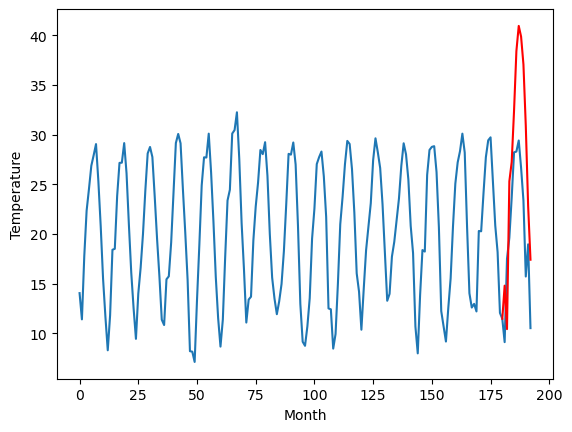

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.21		9.19		0.98
5.10		4.82		-0.28
15.47		19.68		4.21
17.17		21.62		4.45
21.25		26.79		5.54
26.81		32.78		5.97
27.70		35.32		7.62
28.26		34.24		5.98
25.99		31.44		5.45
21.48		25.27		3.79
13.51		17.21		3.70
15.80		11.80		-4.00
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.75, 9.192154440879822, 4.819409880638123, 19.681085143089295, 21.620326313972473, 26.787491116523743, 32.78380278110504, 35.31623390674591, 34.24014142513275, 31.44141343593597, 25.26685813426971, 17.207971606254574, 11.80164578914642]


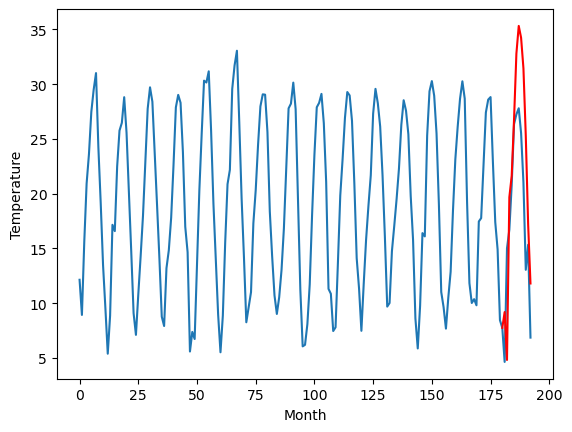

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.77		14.51		-0.26
17.69		10.14		-7.55
20.79		25.00		4.21
27.45		26.94		-0.51
32.46		32.11		-0.35
37.45		38.10		0.65
36.25		40.64		4.39
35.73		39.56		3.83
33.55		36.76		3.21
26.99		30.59		3.60
21.59		22.53		0.94
18.24		17.12		-1.12
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.9, 14.512154440879822, 10.139409880638123, 25.001085143089295, 26.940326313972474, 32.10749111652375, 38.103802781105045, 40.636233906745915, 39.560141425132755, 36.76141343593598, 30.58685813426972, 22.52797160625458, 17.121645789146427]


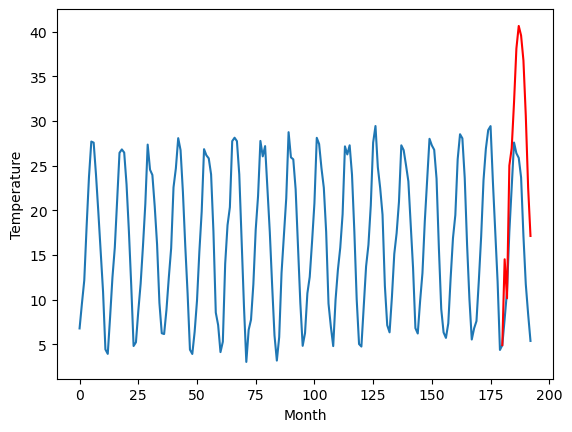

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.24		13.58		0.34
12.32		9.21		-3.11
11.92		24.07		12.15
15.78		26.01		10.23
18.00		31.18		13.18
22.24		37.17		14.93
25.22		39.71		14.49
24.82		38.63		13.81
23.04		35.83		12.79
18.06		29.66		11.60
16.80		21.60		4.80
10.29		16.19		5.90
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[14.14, 13.582154440879822, 9.209409880638123, 24.071085143089295, 26.010326313972474, 31.177491116523743, 37.17380278110504, 39.70623390674591, 38.63014142513275, 35.83141343593597, 29.65685813426971, 21.597971606254575, 16.19164578914642]


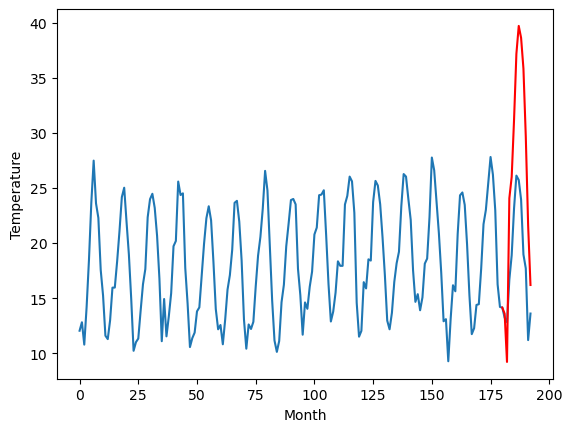

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.38		11.07		0.69
10.88		6.70		-4.18
17.76		21.56		3.80
20.55		23.50		2.95
24.57		28.67		4.10
28.86		34.66		5.80
30.43		37.20		6.77
30.52		36.12		5.60
26.41		33.32		6.91
23.13		27.15		4.02
14.22		19.09		4.87
16.14		13.68		-2.46
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.55, 11.072154440879821, 6.699409880638122, 21.561085143089294, 23.500326313972472, 28.667491116523742, 34.66380278110504, 37.19623390674591, 36.12014142513275, 33.32141343593597, 27.146858134269714, 19.087971606254577, 13.681645789146422]


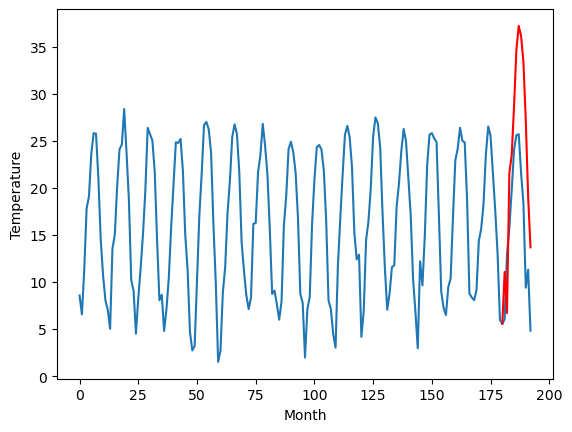

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.18		9.13		-0.05
10.53		4.76		-5.77
16.74		19.62		2.88
18.71		21.56		2.85
23.62		26.73		3.11
29.03		32.72		3.69
30.34		35.26		4.92
30.42		34.18		3.76
25.93		31.38		5.45
22.17		25.21		3.04
11.95		17.15		5.20
14.05		11.74		-2.31
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.19, 9.132154440879821, 4.759409880638122, 19.621085143089296, 21.560326313972475, 26.727491116523744, 32.72380278110504, 35.25623390674591, 34.18014142513275, 31.381413435935976, 25.206858134269716, 17.14797160625458, 11.741645789146425]


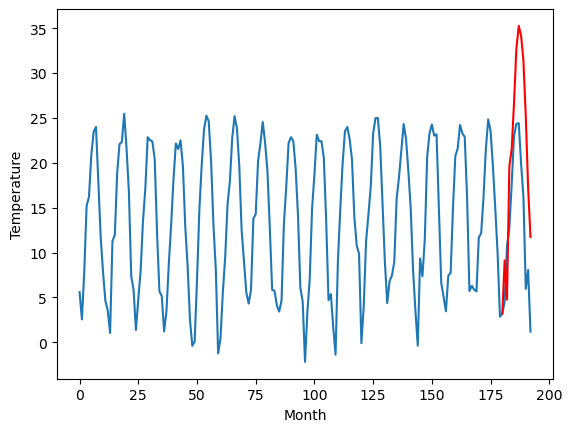

RangeIndex(start=1, stop=12, step=1)
[8.59, 7.790000000000001, 7.1499999999999995, 2.210000000000001, 12.560000000000002, 13.93, 8.21, 14.770000000000001, 13.240000000000004, 10.379999999999999, 9.18]
[9.132154440879821, 8.152154440879823, 6.772154440879822, 5.572154440879822, 12.492154440879823, 14.802154440879821, 9.192154440879822, 14.512154440879822, 13.582154440879822, 11.072154440879821, 9.132154440879821]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.59   9.132154
1                 1    7.79   8.152154
2                 2    7.15   6.772154
3                 3    2.21   5.572154
4                 4   12.56  12.492154
5                 5   13.93  14.802154
6                 6    8.21   9.192154
7                 7   14.77  14.512154
8                 8   13.24  13.582154
9                 9   10.38  11.072154
10               10    9.18   9.132154


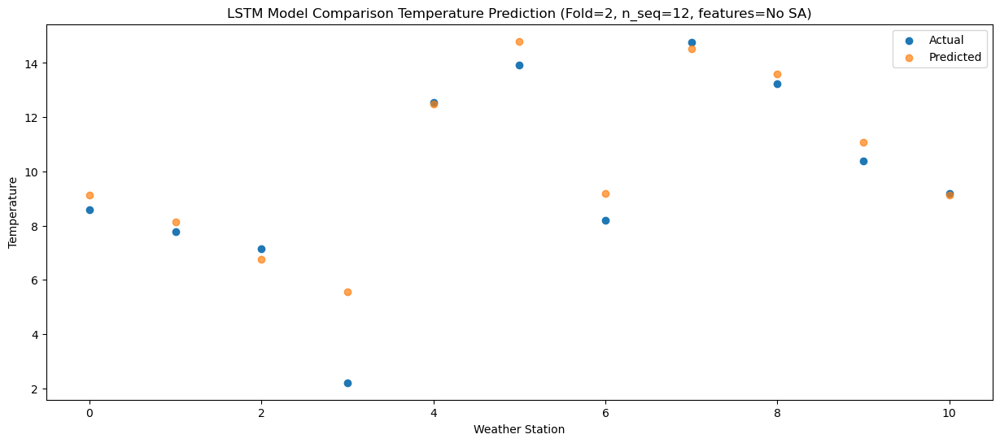

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.19    4.75941
1                 1    3.75    3.77941
2                 2    9.88    2.39941
3                 3    2.23    1.19941
4                 4   11.82    8.11941
5                 5   11.58   10.42941
6                 6    5.10    4.81941
7                 7   17.69   10.13941
8                 8   12.32    9.20941
9                 9   10.88    6.69941
10               10   10.53    4.75941


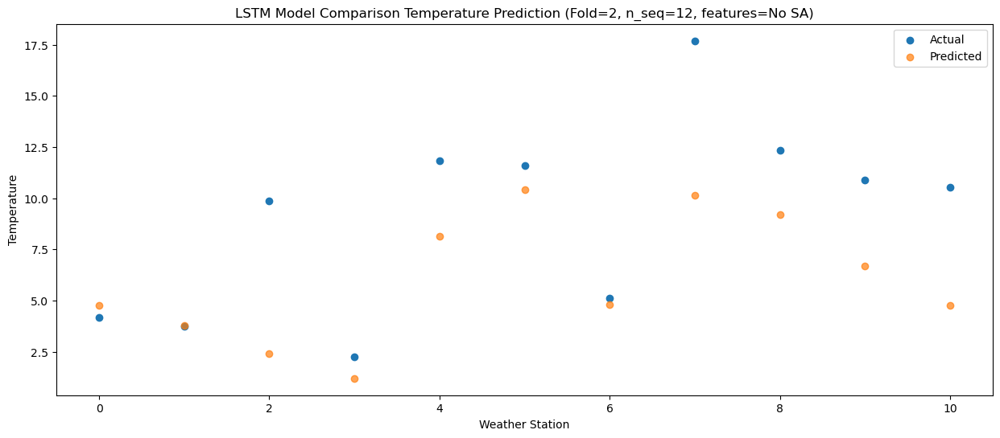

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   16.61  19.621085
1                 1   13.94  18.641085
2                 2   11.69  17.261085
3                 3    6.34  16.061085
4                 4   19.15  22.981085
5                 5   19.96  25.291085
6                 6   15.47  19.681085
7                 7   20.79  25.001085
8                 8   11.92  24.071085
9                 9   17.76  21.561085
10               10   16.74  19.621085


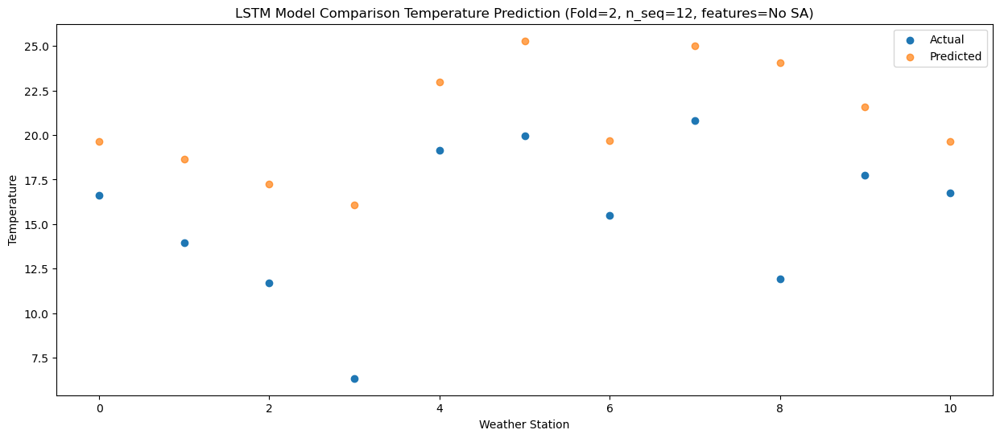

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   18.48  21.560326
1                 1   17.70  20.580326
2                 2   13.50  19.200326
3                 3   10.84  18.000326
4                 4   20.02  24.920326
5                 5   22.08  27.230326
6                 6   17.17  21.620326
7                 7   27.45  26.940326
8                 8   15.78  26.010326
9                 9   20.55  23.500326
10               10   18.71  21.560326


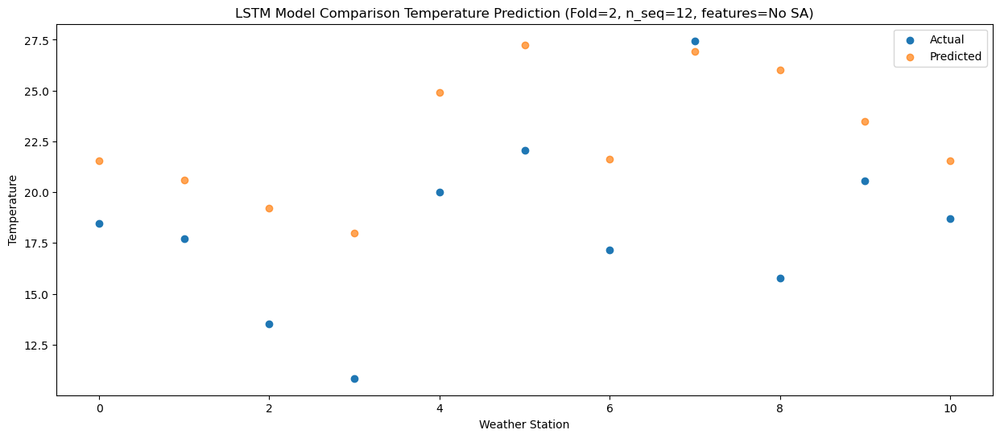

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   23.26  26.727491
1                 1   22.88  25.747491
2                 2   17.08  24.367491
3                 3   16.10  23.167491
4                 4   24.49  30.087491
5                 5   26.12  32.397491
6                 6   21.25  26.787491
7                 7   32.46  32.107491
8                 8   18.00  31.177491
9                 9   24.57  28.667491
10               10   23.62  26.727491


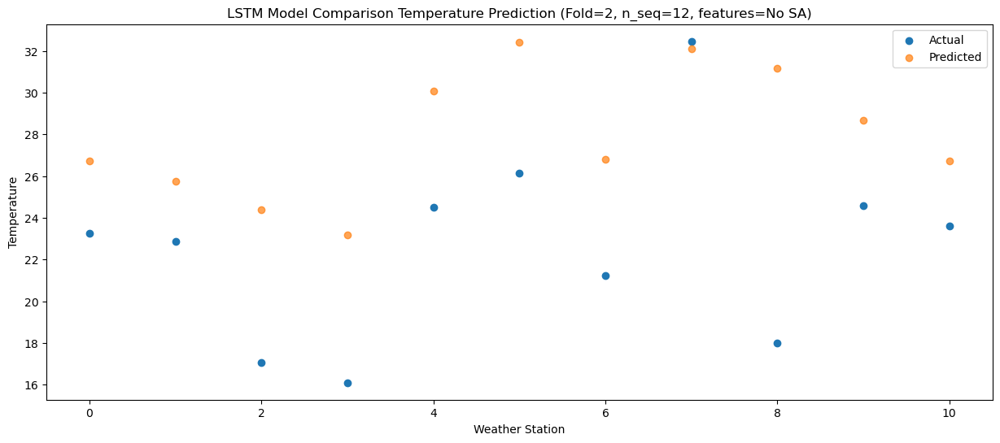

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   28.51  32.723803
1                 1   30.13  31.743803
2                 2   18.30  30.363803
3                 3   21.67  29.163803
4                 4   27.97  36.083803
5                 5   30.67  38.393803
6                 6   26.81  32.783803
7                 7   37.45  38.103803
8                 8   22.24  37.173803
9                 9   28.86  34.663803
10               10   29.03  32.723803


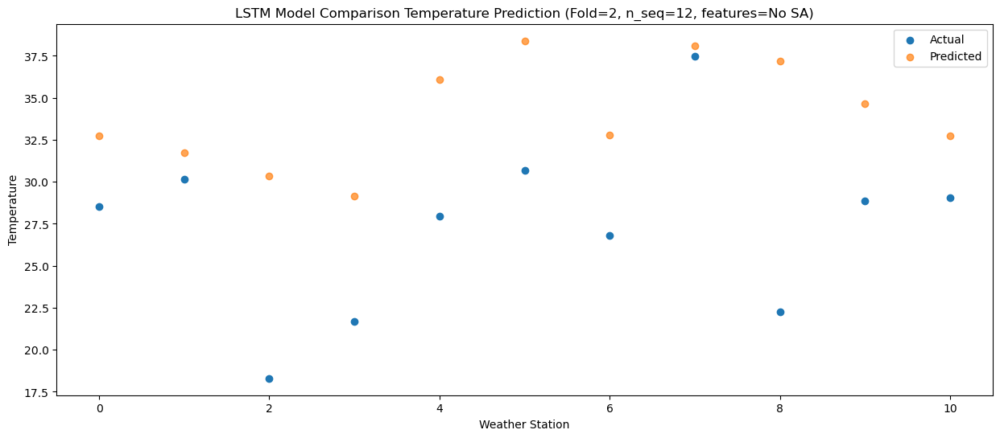

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   29.52  35.256234
1                 1   30.82  34.276234
2                 2   19.09  32.896234
3                 3   23.67  31.696234
4                 4   28.56  38.616234
5                 5   30.75  40.926234
6                 6   27.70  35.316234
7                 7   36.25  40.636234
8                 8   25.22  39.706234
9                 9   30.43  37.196234
10               10   30.34  35.256234


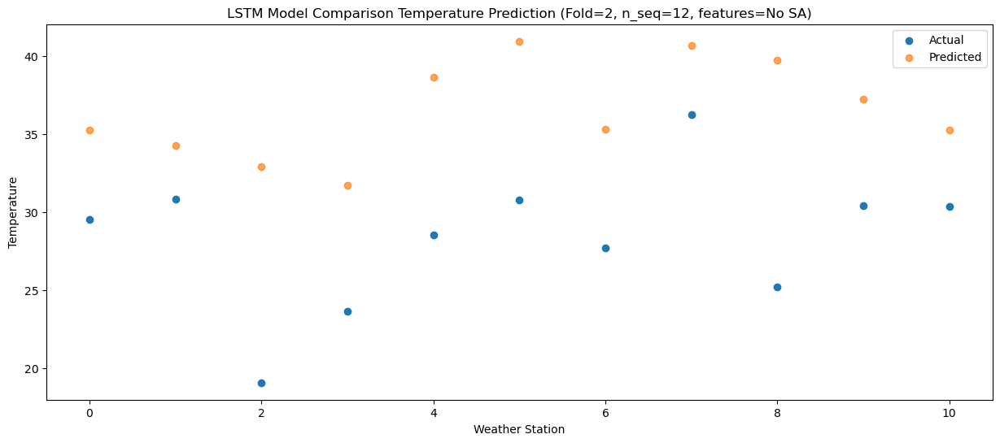

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   29.97  34.180141
1                 1   31.58  33.200141
2                 2   19.14  31.820141
3                 3   24.73  30.620141
4                 4   28.73  37.540141
5                 5   31.86  39.850141
6                 6   28.26  34.240141
7                 7   35.73  39.560141
8                 8   24.82  38.630141
9                 9   30.52  36.120141
10               10   30.42  34.180141


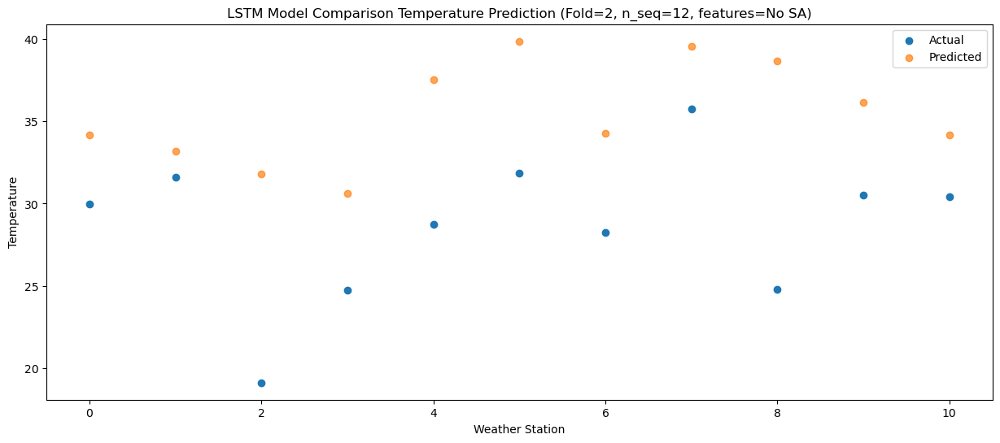

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   26.67  31.381413
1                 1   29.34  30.401413
2                 2   17.86  29.021413
3                 3   21.56  27.821413
4                 4   26.19  34.741413
5                 5   29.12  37.051413
6                 6   25.99  31.441413
7                 7   33.55  36.761413
8                 8   23.04  35.831413
9                 9   26.41  33.321413
10               10   25.93  31.381413


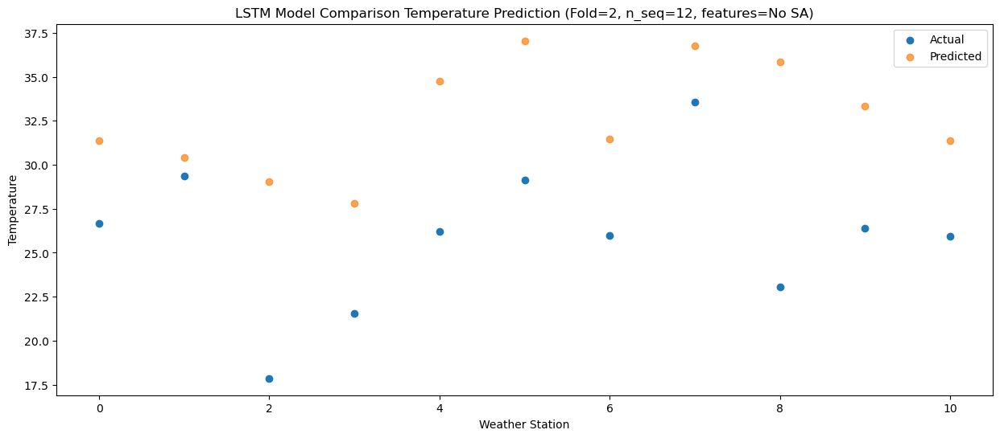

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   21.92  25.206858
1                 1   21.08  24.226858
2                 2   16.72  22.846858
3                 3   17.73  21.646858
4                 4   23.45  28.566858
5                 5   25.82  30.876858
6                 6   21.48  25.266858
7                 7   26.99  30.586858
8                 8   18.06  29.656858
9                 9   23.13  27.146858
10               10   22.17  25.206858


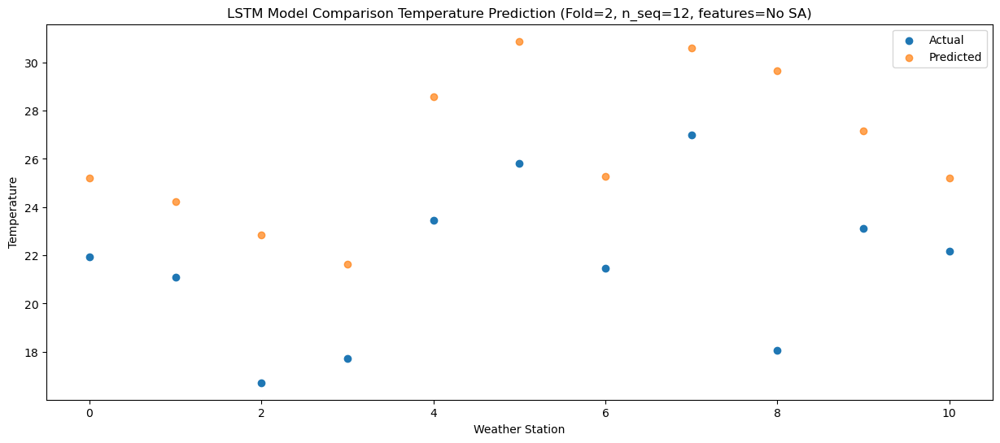

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0   12.30  17.147972
1                 1   14.37  16.167972
2                 2    9.87  14.787972
3                 3    9.65  13.587972
4                 4   15.18  20.507972
5                 5   18.18  22.817972
6                 6   13.51  17.207972
7                 7   21.59  22.527972
8                 8   16.80  21.597972
9                 9   14.22  19.087972
10               10   11.95  17.147972


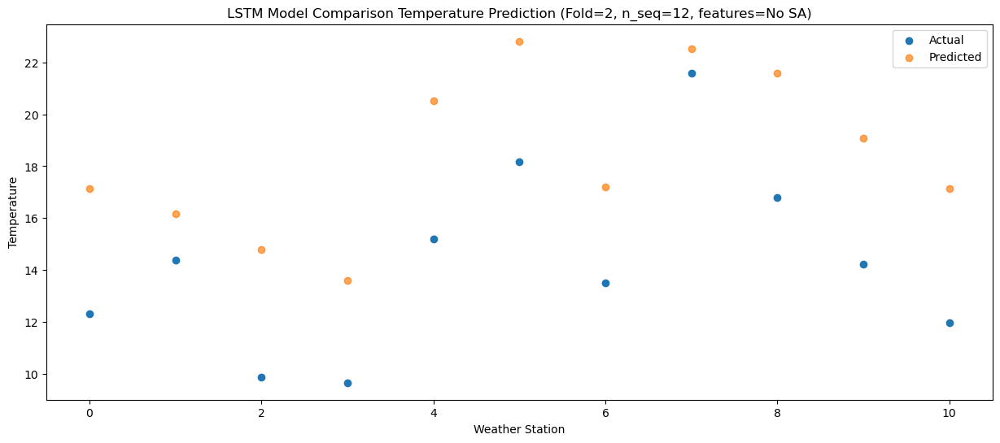

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   15.39  11.741646
1                 1   11.98  10.761646
2                 2   10.77   9.381646
3                 3    7.73   8.181646
4                 4   18.59  15.101646
5                 5   21.42  17.411646
6                 6   15.80  11.801646
7                 7   18.24  17.121646
8                 8   10.29  16.191646
9                 9   16.14  13.681646
10               10   14.05  11.741646


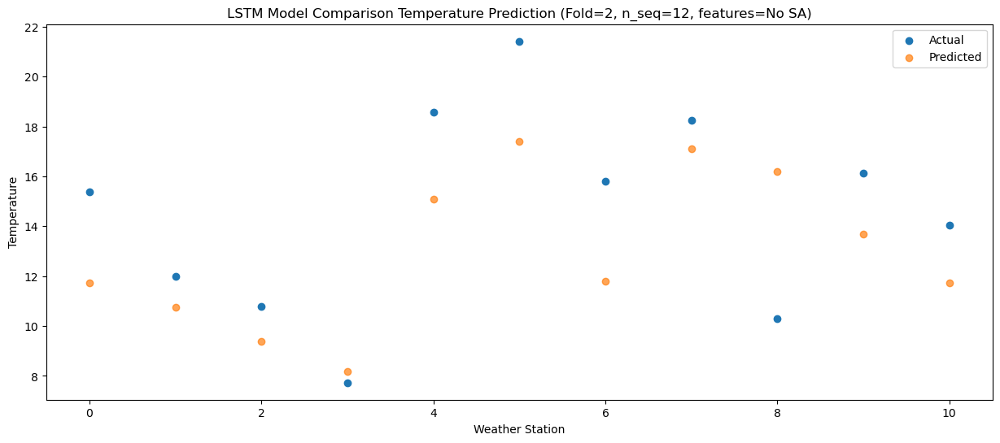

Model: "sequential_503"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1006 (LSTM)            (1, 1, 1024)              12263424  
                                                                 
 dropout_1006 (Dropout)      (1, 1, 1024)              0         
                                                                 
 lstm_1007 (LSTM)            (1, 1024)                 8392704   
                                                                 
 dropout_1007 (Dropout)      (1, 1024)                 0         
                                                                 
 dense_1509 (Dense)          (1, 256)                  262400    
                                                                 
 dense_1510 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1511 (Dense)          (1, 12)                

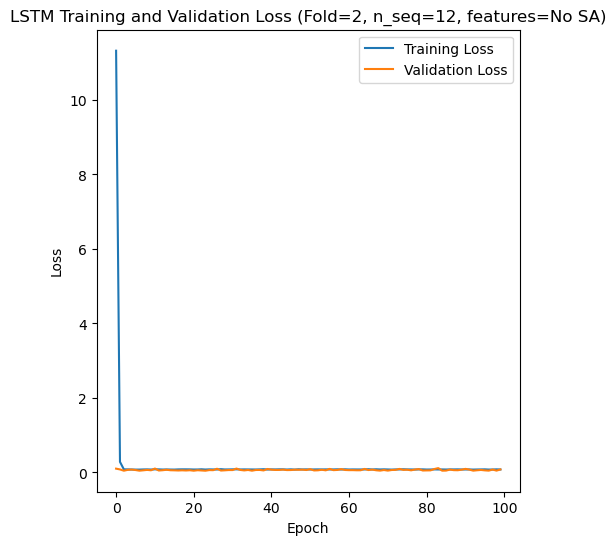

Epoch 1/100
84/84 [==============================] - 33s 159ms/step - loss: 7.3128 - accuracy: 0.5238 - mae: 7.1444 - rmse: 7.3128 - mape: 1638.9044 - pearson: 0.5960 - val_loss: 0.0933 - val_accuracy: 0.7000 - val_mae: 0.0772 - val_rmse: 0.0933 - val_mape: 20.6972 - val_pearson: 0.7069
Epoch 2/100
84/84 [==============================] - 9s 106ms/step - loss: 0.0773 - accuracy: 0.6429 - mae: 0.0603 - rmse: 0.0773 - mape: 14.1903 - pearson: 0.7944 - val_loss: 0.0881 - val_accuracy: 0.7000 - val_mae: 0.0700 - val_rmse: 0.0881 - val_mape: 18.7296 - val_pearson: 0.7671
Epoch 3/100
84/84 [==============================] - 9s 107ms/step - loss: 0.0764 - accuracy: 0.7976 - mae: 0.0615 - rmse: 0.0764 - mape: 14.6573 - pearson: 0.7998 - val_loss: 0.0848 - val_accuracy: 0.7000 - val_mae: 0.0668 - val_rmse: 0.0848 - val_mape: 19.2094 - val_pearson: 0.7888
Epoch 4/100
84/84 [==============================] - 9s 111ms/step - loss: 0.0804 - accuracy: 0.6786 - mae: 0.0634 - rmse: 0.0804 - mape: 14.7

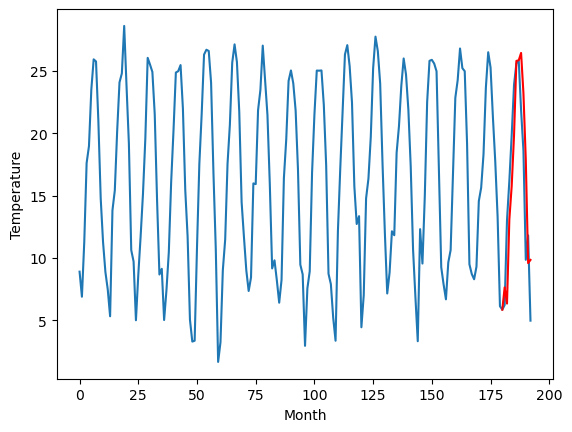

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.72		6.66		-0.06
3.00		5.36		2.36
14.97		12.11		-2.86
16.83		14.79		-2.04
21.05		18.87		-2.18
27.76		24.82		-2.94
29.07		24.87		-4.20
29.64		25.47		-4.17
26.91		22.23		-4.68
20.31		16.89		-3.42
12.60		8.61		-3.99
13.91		8.86		-5.05
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.2, 6.65897500038147, 5.359739179611206, 12.106644983291627, 14.794565553665162, 18.870901937484742, 24.824684019088746, 24.87279625505209, 25.465054529607297, 22.225866096913816, 16.892652290761472, 8.60634209483862, 8.861836272180081]


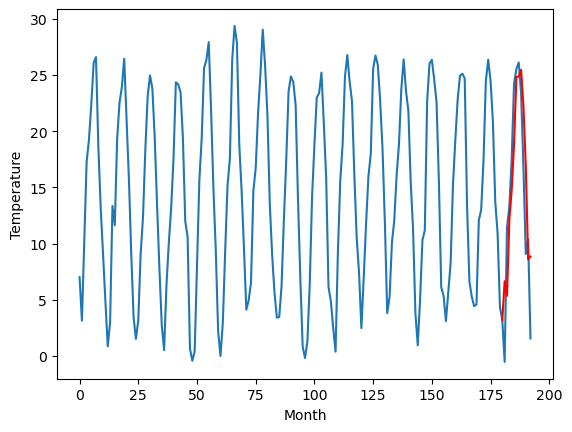

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.75		5.28		-2.47
10.05		3.98		-6.07
11.20		10.73		-0.47
16.93		13.41		-3.52
21.73		17.49		-4.24
26.58		23.44		-3.14
29.71		23.49		-6.22
27.51		24.09		-3.42
24.20		20.85		-3.35
15.54		15.51		-0.03
11.20		7.23		-3.97
7.28		7.48		0.20
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[8.48, 5.27897500038147, 3.9797391796112063, 10.726644983291626, 13.414565553665161, 17.490901937484743, 23.444684019088747, 23.49279625505209, 24.085054529607298, 20.845866096913817, 15.512652290761473, 7.226342094838621, 7.481836272180082]


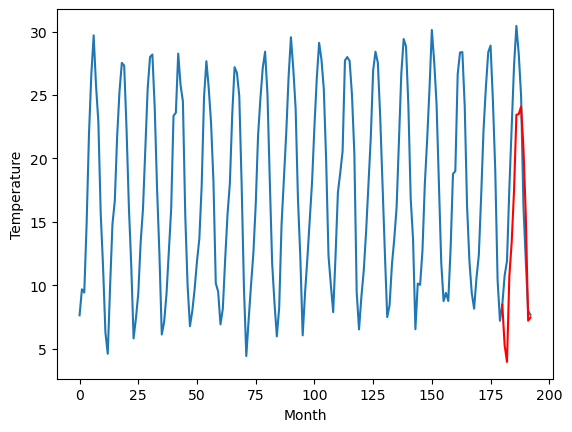

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.83		4.08		0.25
2.51		2.78		0.27
12.72		9.53		-3.19
15.07		12.21		-2.86
19.14		16.29		-2.85
25.06		22.24		-2.82
26.05		22.29		-3.76
26.57		22.89		-3.68
22.44		19.65		-2.79
18.86		14.31		-4.55
9.20		6.03		-3.17
10.69		6.28		-4.41
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[1.55, 4.07897500038147, 2.779739179611206, 9.526644983291625, 12.21456555366516, 16.29090193748474, 22.244684019088744, 22.29279625505209, 22.885054529607295, 19.645866096913814, 14.31265229076147, 6.026342094838618, 6.28183627218008]


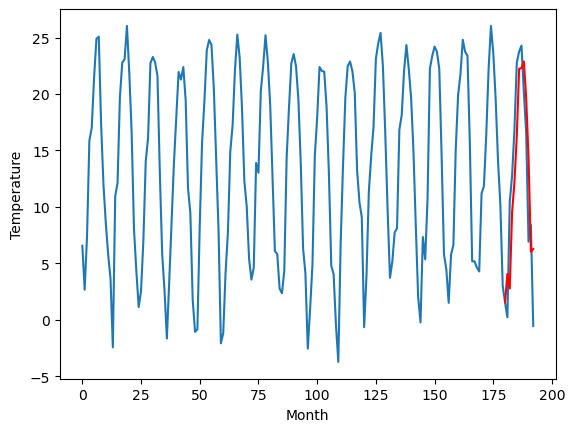

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.74		11.00		0.26
6.87		9.70		2.83
19.95		16.45		-3.50
23.24		19.13		-4.11
27.81		23.21		-4.60
35.29		29.16		-6.13
35.29		29.21		-6.08
35.41		29.81		-5.60
32.05		26.57		-5.48
26.63		21.23		-5.40
16.89		12.95		-3.94
16.53		13.20		-3.33
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[1.08, 10.99897500038147, 9.699739179611207, 16.446644983291627, 19.134565553665162, 23.210901937484742, 29.164684019088746, 29.21279625505209, 29.805054529607297, 26.565866096913815, 21.23265229076147, 12.94634209483862, 13.201836272180081]


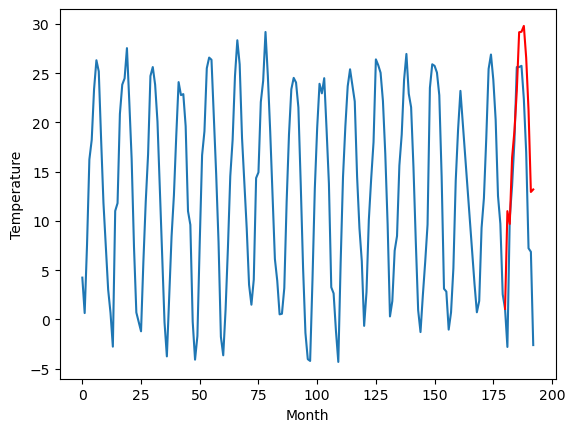

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.07		13.31		0.24
10.35		12.01		1.66
21.68		18.76		-2.92
25.13		21.44		-3.69
29.41		25.52		-3.89
36.12		31.47		-4.65
36.50		31.52		-4.98
36.82		32.12		-4.70
33.56		28.88		-4.68
28.98		23.54		-5.44
18.13		15.26		-2.87
19.18		15.51		-3.67
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[0.21, 13.30897500038147, 12.009739179611206, 18.756644983291626, 21.44456555366516, 25.52090193748474, 31.474684019088745, 31.52279625505209, 32.11505452960729, 28.87586609691381, 23.542652290761467, 15.256342094838615, 15.511836272180076]


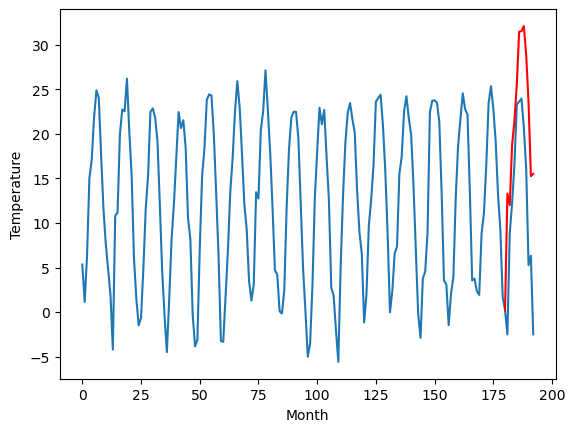

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.18		7.70		-1.48
9.28		6.40		-2.88
12.25		13.15		0.90
17.03		15.83		-1.20
22.08		19.91		-2.17
29.47		25.86		-3.61
31.31		25.91		-5.40
29.39		26.51		-2.88
27.52		23.27		-4.25
19.55		17.93		-1.62
16.81		9.65		-7.16
12.05		9.90		-2.15
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-8.22, 7.69897500038147, 6.399739179611206, 13.146644983291626, 15.834565553665161, 19.91090193748474, 25.864684019088745, 25.91279625505209, 26.505054529607296, 23.265866096913815, 17.93265229076147, 9.64634209483862, 9.90183627218008]


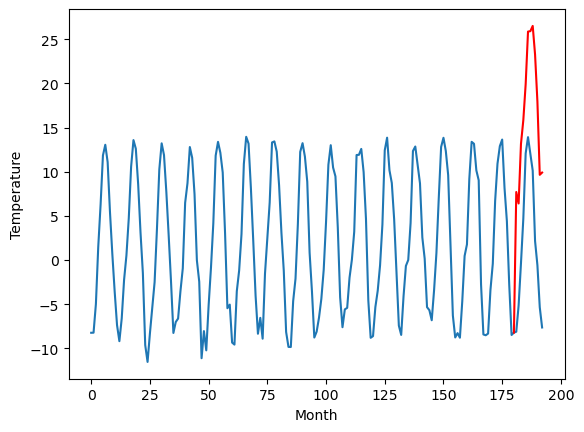

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.78		13.02		-1.76
17.63		11.72		-5.91
19.23		18.47		-0.76
27.20		21.15		-6.05
31.63		25.23		-6.40
39.27		31.18		-8.09
40.35		31.23		-9.12
39.12		31.83		-7.29
35.15		28.59		-6.56
24.80		23.25		-1.55
22.28		14.97		-7.31
15.01		15.22		0.21
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[10.04, 13.01897500038147, 11.719739179611206, 18.466644983291626, 21.15456555366516, 25.23090193748474, 31.184684019088746, 31.23279625505209, 31.825054529607296, 28.585866096913815, 23.25265229076147, 14.96634209483862, 15.22183627218008]


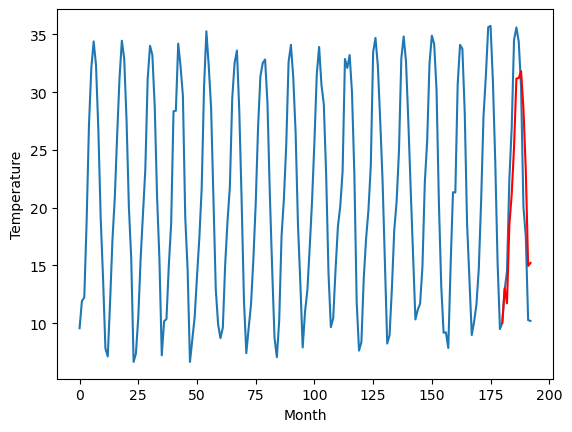

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.52		12.09		-2.43
15.45		10.79		-4.66
15.23		17.54		2.31
17.42		20.22		2.80
21.71		24.30		2.59
23.41		30.25		6.84
22.59		30.30		7.71
23.14		30.90		7.76
22.59		27.66		5.07
19.83		22.32		2.49
17.01		14.04		-2.97
13.31		14.29		0.98
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.17, 12.08897500038147, 10.789739179611207, 17.536644983291627, 20.224565553665162, 24.300901937484742, 30.254684019088746, 30.30279625505209, 30.895054529607297, 27.655866096913815, 22.32265229076147, 14.03634209483862, 14.291836272180081]


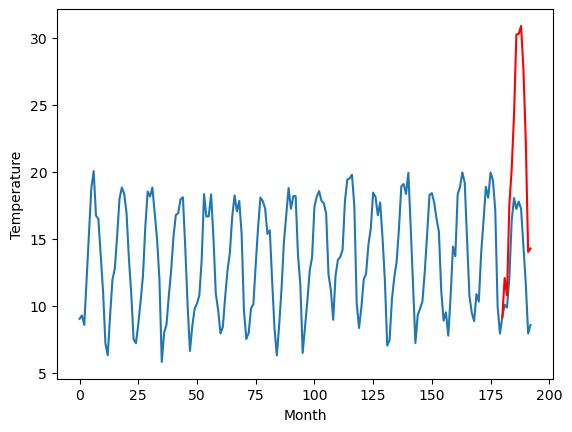

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.77		9.58		1.81
7.65		8.28		0.63
12.65		15.03		2.38
17.27		17.71		0.44
22.10		21.79		-0.31
27.97		27.74		-0.23
30.11		27.79		-2.32
30.73		28.39		-2.34
27.41		25.15		-2.26
22.97		19.81		-3.16
14.05		11.53		-2.52
12.45		11.78		-0.67
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[0.94, 9.578975000381469, 8.279739179611205, 15.026644983291625, 17.71456555366516, 21.79090193748474, 27.744684019088744, 27.79279625505209, 28.385054529607295, 25.145866096913814, 19.81265229076147, 11.526342094838618, 11.78183627218008]


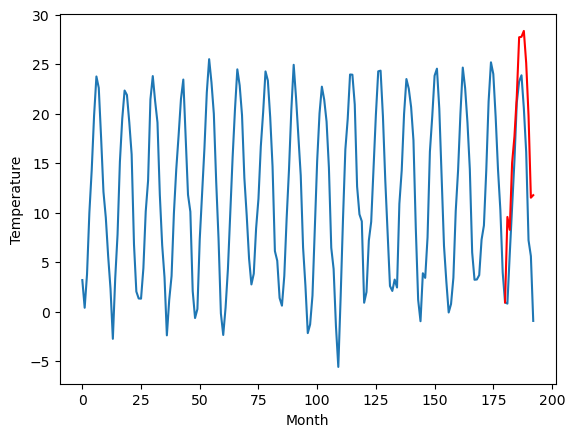

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.29		7.64		0.35
6.49		6.34		-0.15
13.68		13.09		-0.59
18.55		15.77		-2.78
22.81		19.85		-2.96
28.98		25.80		-3.18
30.62		25.85		-4.77
30.35		26.45		-3.90
26.09		23.21		-2.88
21.97		17.87		-4.10
11.75		9.59		-2.16
11.34		9.84		-1.50
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.13, 7.638975000381469, 6.339739179611206, 13.086644983291626, 15.77456555366516, 19.850901937484743, 25.804684019088747, 25.85279625505209, 26.445054529607297, 23.205866096913816, 17.872652290761472, 9.58634209483862, 9.841836272180082]


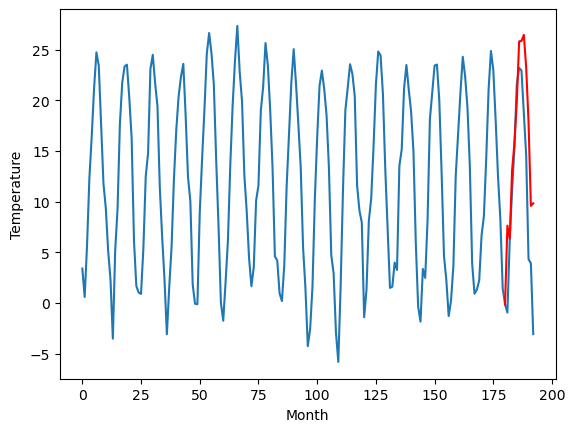

RangeIndex(start=1, stop=12, step=1)
[8.569999999999999, 6.720000000000001, 7.75, 3.8299999999999996, 10.74, 13.069999999999999, 9.18, 14.78, 14.520000000000001, 7.769999999999999, 7.29]
[7.638975000381469, 6.65897500038147, 5.27897500038147, 4.07897500038147, 10.99897500038147, 13.30897500038147, 7.69897500038147, 13.01897500038147, 12.08897500038147, 9.578975000381469, 7.638975000381469]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.57   7.638975
1                 1    6.72   6.658975
2                 2    7.75   5.278975
3                 3    3.83   4.078975
4                 4   10.74  10.998975
5                 5   13.07  13.308975
6                 6    9.18   7.698975
7                 7   14.78  13.018975
8                 8   14.52  12.088975
9                 9    7.77   9.578975
10               10    7.29   7.638975


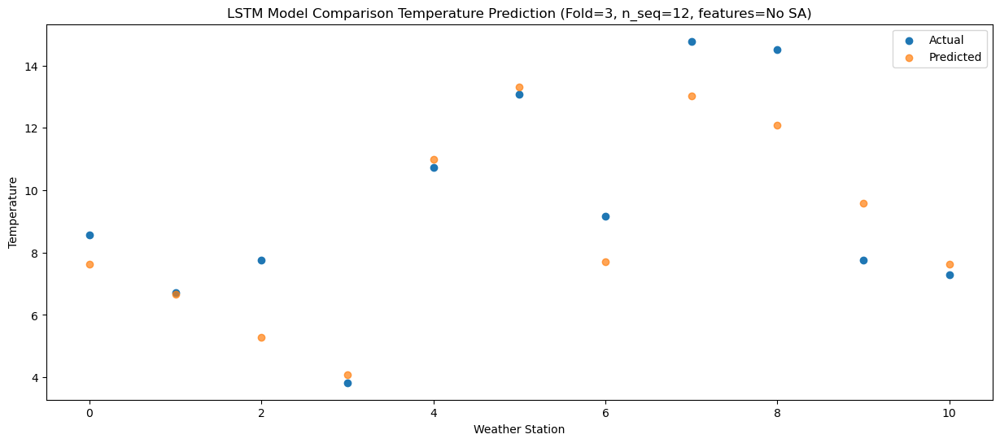

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    8.94   6.339739
1                 1    3.00   5.359739
2                 2   10.05   3.979739
3                 3    2.51   2.779739
4                 4    6.87   9.699739
5                 5   10.35  12.009739
6                 6    9.28   6.399739
7                 7   17.63  11.719739
8                 8   15.45  10.789739
9                 9    7.65   8.279739
10               10    6.49   6.339739


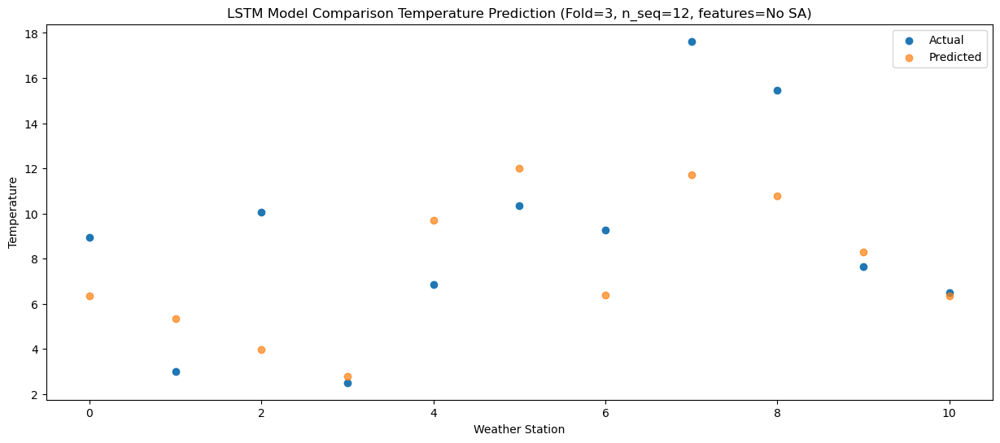

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   15.74  13.086645
1                 1   14.97  12.106645
2                 2   11.20  10.726645
3                 3   12.72   9.526645
4                 4   19.95  16.446645
5                 5   21.68  18.756645
6                 6   12.25  13.146645
7                 7   19.23  18.466645
8                 8   15.23  17.536645
9                 9   12.65  15.026645
10               10   13.68  13.086645


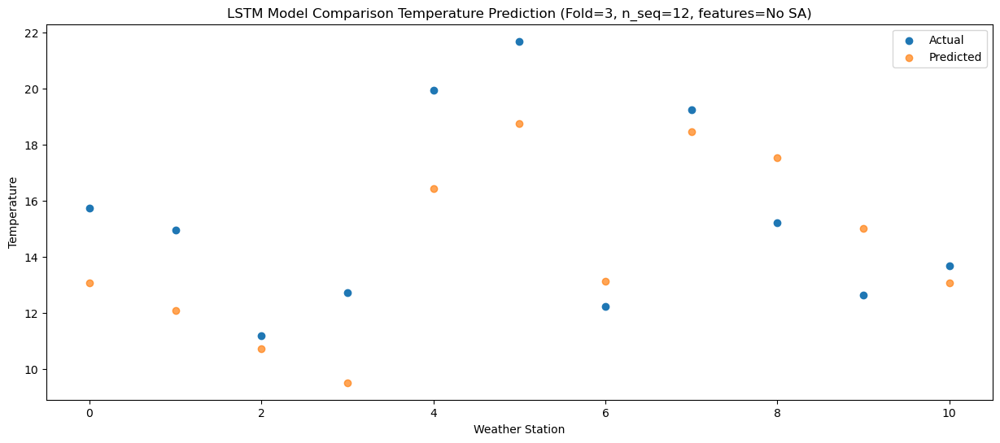

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   18.90  15.774566
1                 1   16.83  14.794566
2                 2   16.93  13.414566
3                 3   15.07  12.214566
4                 4   23.24  19.134566
5                 5   25.13  21.444566
6                 6   17.03  15.834566
7                 7   27.20  21.154566
8                 8   17.42  20.224566
9                 9   17.27  17.714566
10               10   18.55  15.774566


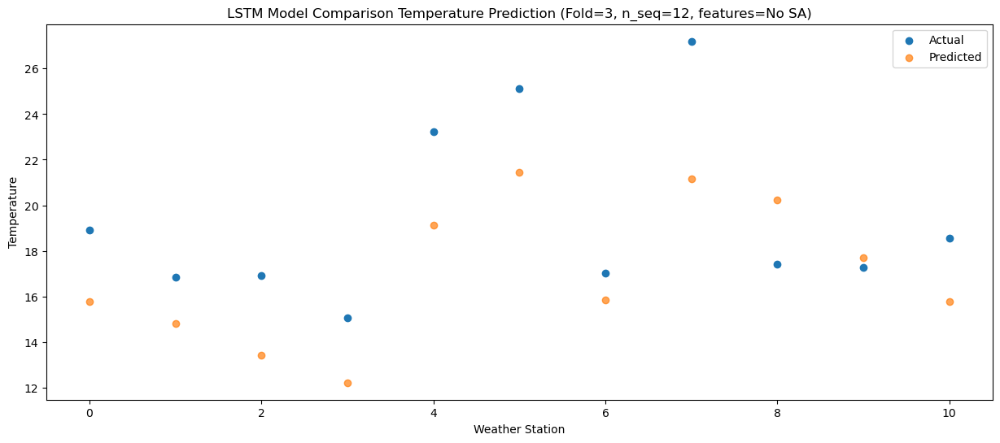

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   22.56  19.850902
1                 1   21.05  18.870902
2                 2   21.73  17.490902
3                 3   19.14  16.290902
4                 4   27.81  23.210902
5                 5   29.41  25.520902
6                 6   22.08  19.910902
7                 7   31.63  25.230902
8                 8   21.71  24.300902
9                 9   22.10  21.790902
10               10   22.81  19.850902


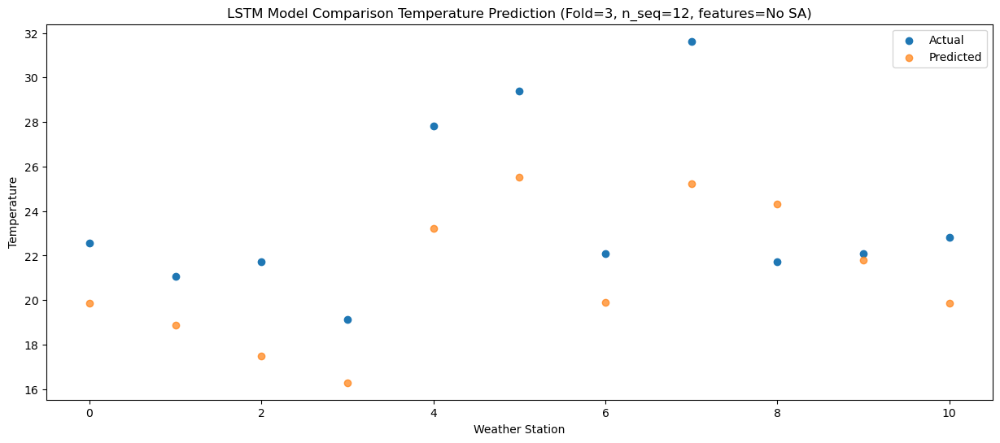

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   26.62  25.804684
1                 1   27.76  24.824684
2                 2   26.58  23.444684
3                 3   25.06  22.244684
4                 4   35.29  29.164684
5                 5   36.12  31.474684
6                 6   29.47  25.864684
7                 7   39.27  31.184684
8                 8   23.41  30.254684
9                 9   27.97  27.744684
10               10   28.98  25.804684


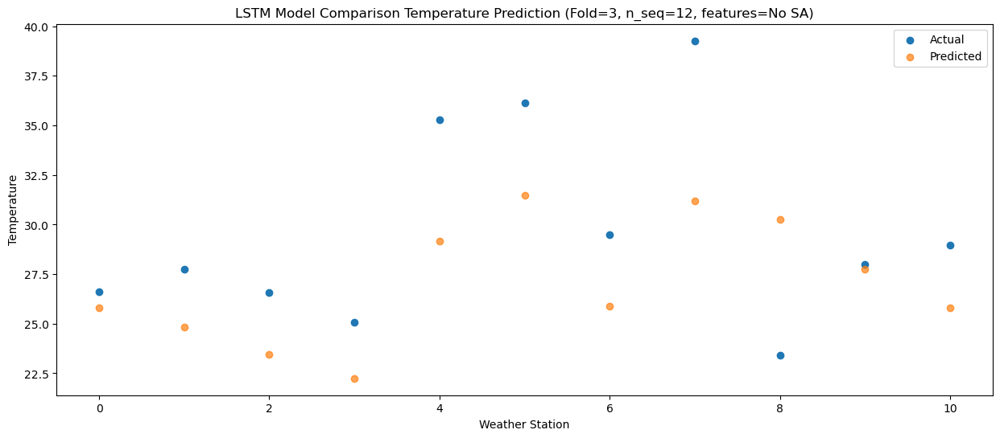

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   28.33  25.852796
1                 1   29.07  24.872796
2                 2   29.71  23.492796
3                 3   26.05  22.292796
4                 4   35.29  29.212796
5                 5   36.50  31.522796
6                 6   31.31  25.912796
7                 7   40.35  31.232796
8                 8   22.59  30.302796
9                 9   30.11  27.792796
10               10   30.62  25.852796


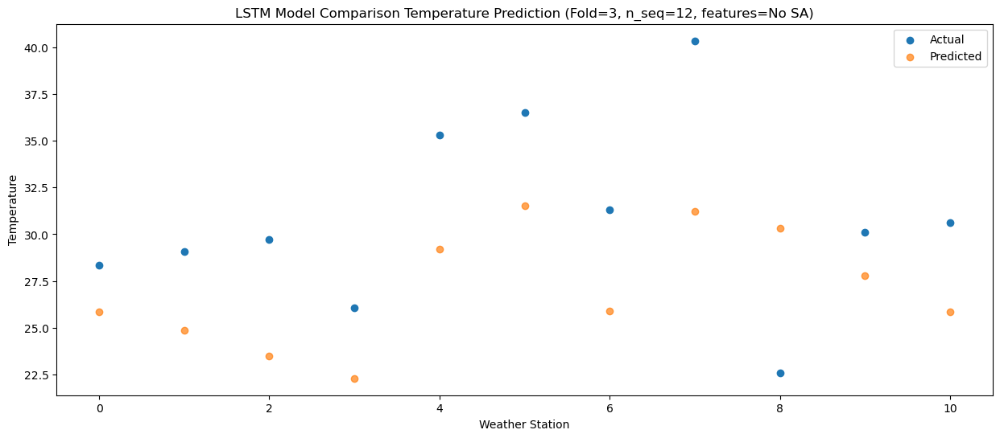

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   28.55  26.445055
1                 1   29.64  25.465055
2                 2   27.51  24.085055
3                 3   26.57  22.885055
4                 4   35.41  29.805055
5                 5   36.82  32.115055
6                 6   29.39  26.505055
7                 7   39.12  31.825055
8                 8   23.14  30.895055
9                 9   30.73  28.385055
10               10   30.35  26.445055


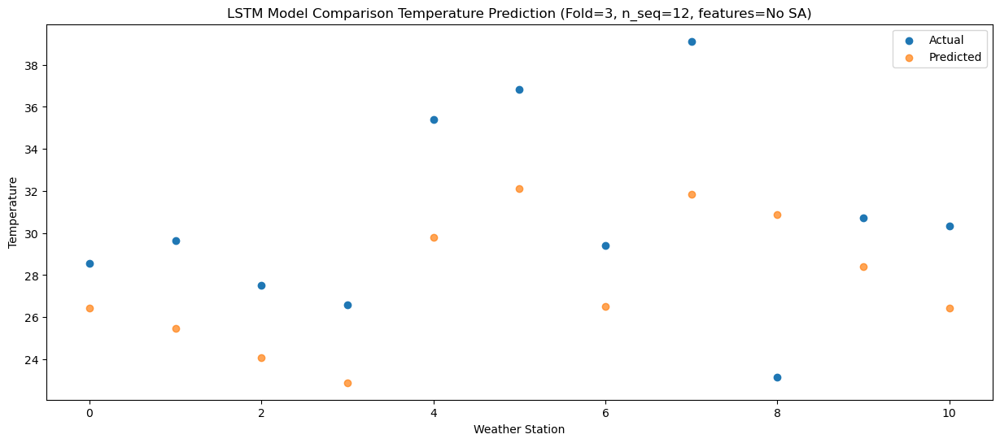

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   24.56  23.205866
1                 1   26.91  22.225866
2                 2   24.20  20.845866
3                 3   22.44  19.645866
4                 4   32.05  26.565866
5                 5   33.56  28.875866
6                 6   27.52  23.265866
7                 7   35.15  28.585866
8                 8   22.59  27.655866
9                 9   27.41  25.145866
10               10   26.09  23.205866


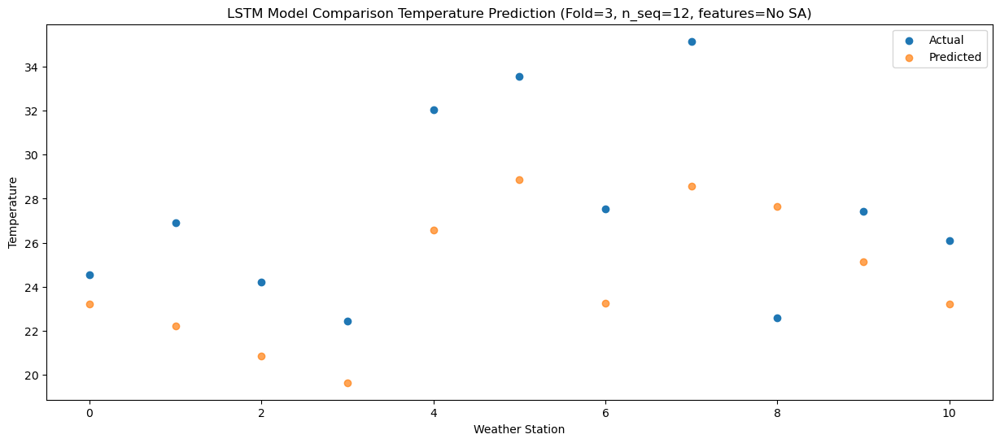

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   21.33  17.872652
1                 1   20.31  16.892652
2                 2   15.54  15.512652
3                 3   18.86  14.312652
4                 4   26.63  21.232652
5                 5   28.98  23.542652
6                 6   19.55  17.932652
7                 7   24.80  23.252652
8                 8   19.83  22.322652
9                 9   22.97  19.812652
10               10   21.97  17.872652


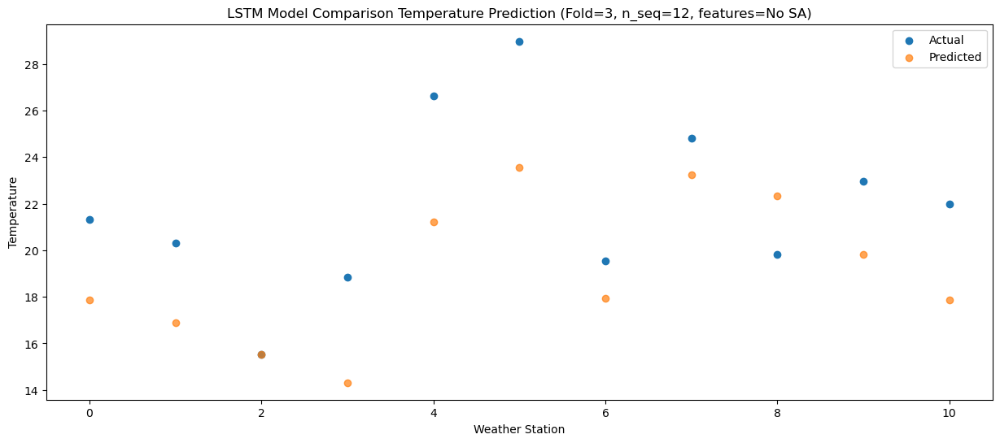

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0   12.57   9.586342
1                 1   12.60   8.606342
2                 2   11.20   7.226342
3                 3    9.20   6.026342
4                 4   16.89  12.946342
5                 5   18.13  15.256342
6                 6   16.81   9.646342
7                 7   22.28  14.966342
8                 8   17.01  14.036342
9                 9   14.05  11.526342
10               10   11.75   9.586342


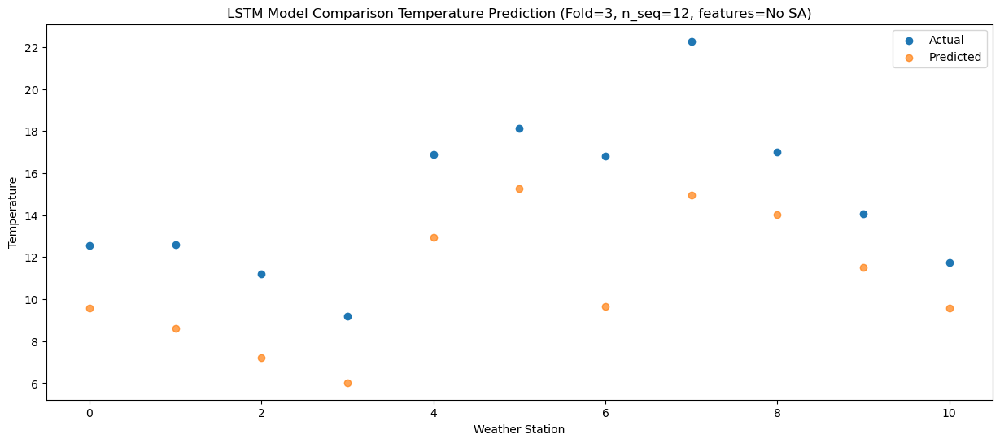

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   14.53   9.841836
1                 1   13.91   8.861836
2                 2    7.28   7.481836
3                 3   10.69   6.281836
4                 4   16.53  13.201836
5                 5   19.18  15.511836
6                 6   12.05   9.901836
7                 7   15.01  15.221836
8                 8   13.31  14.291836
9                 9   12.45  11.781836
10               10   11.34   9.841836


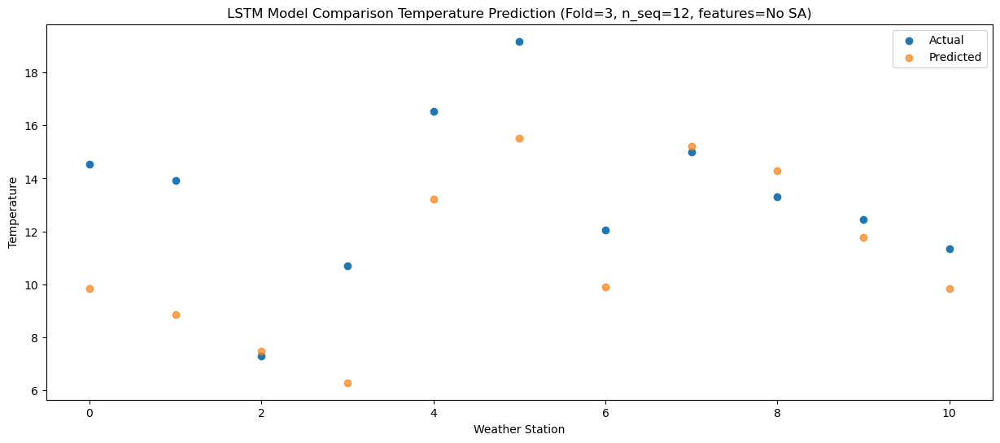

Model: "sequential_504"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1008 (LSTM)            (1, 1, 1024)              12263424  
                                                                 
 dropout_1008 (Dropout)      (1, 1, 1024)              0         
                                                                 
 lstm_1009 (LSTM)            (1, 1024)                 8392704   
                                                                 
 dropout_1009 (Dropout)      (1, 1024)                 0         
                                                                 
 dense_1512 (Dense)          (1, 256)                  262400    
                                                                 
 dense_1513 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1514 (Dense)          (1, 12)                

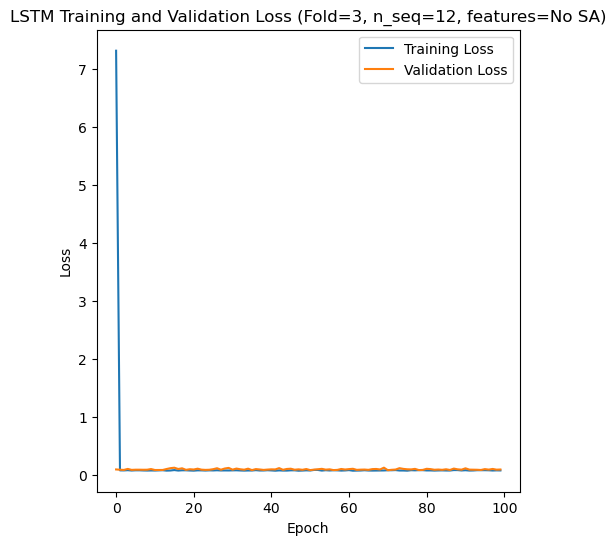

Epoch 1/100
84/84 [==============================] - 23s 117ms/step - loss: 10.3238 - accuracy: 0.4048 - mae: 10.1349 - rmse: 10.3238 - mape: 2045.5303 - pearson: 0.4711 - val_loss: 0.0791 - val_accuracy: 0.7000 - val_mae: 0.0643 - val_rmse: 0.0791 - val_mape: 15.0100 - val_pearson: 0.8242
Epoch 2/100
84/84 [==============================] - 7s 78ms/step - loss: 0.6266 - accuracy: 0.5595 - mae: 0.6000 - rmse: 0.6266 - mape: 126.9665 - pearson: 0.7574 - val_loss: 0.0896 - val_accuracy: 0.7000 - val_mae: 0.0764 - val_rmse: 0.0896 - val_mape: 17.7672 - val_pearson: 0.7493
Epoch 3/100
84/84 [==============================] - 6s 77ms/step - loss: 0.0734 - accuracy: 0.7143 - mae: 0.0573 - rmse: 0.0734 - mape: 12.7694 - pearson: 0.7856 - val_loss: 0.0844 - val_accuracy: 0.7000 - val_mae: 0.0694 - val_rmse: 0.0844 - val_mape: 16.2850 - val_pearson: 0.7876
Epoch 4/100
84/84 [==============================] - 7s 78ms/step - loss: 0.0775 - accuracy: 0.5833 - mae: 0.0604 - rmse: 0.0775 - mape: 13.

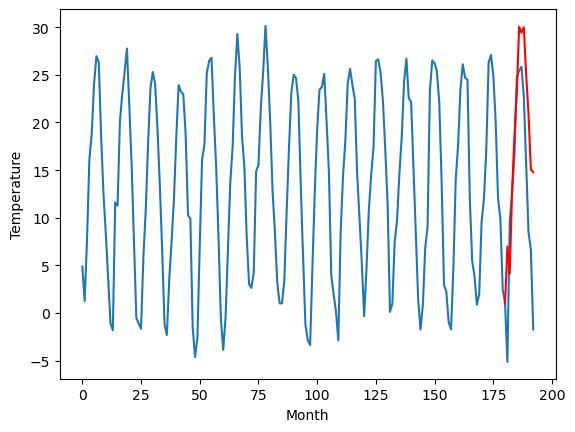

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.57		6.00		-2.57
12.00		3.17		-8.83
13.60		11.91		-1.69
15.04		17.54		2.50
19.08		22.23		3.15
20.71		29.07		8.36
21.08		28.43		7.35
21.36		29.00		7.64
20.07		24.02		3.95
18.23		19.87		1.64
11.07		14.08		3.01
12.87		13.81		0.94
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[14.25, 6.003138179779053, 3.167435760498047, 11.905765647888185, 17.541496391296388, 22.23050033569336, 29.06736099243164, 28.43423169374466, 29.004966611862184, 24.01661955833435, 19.867865915298463, 14.080798978805543, 13.809131617546083]


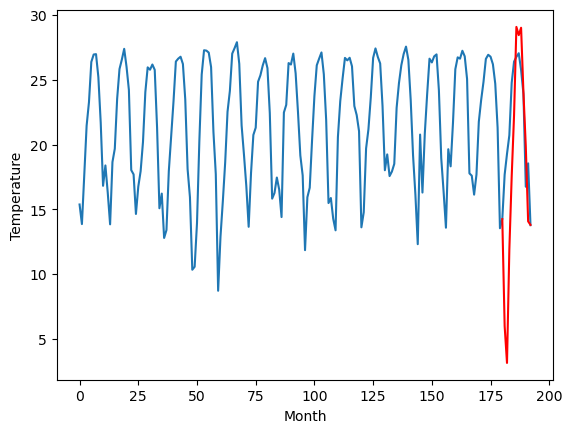

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.52		4.62		-1.90
4.60		1.79		-2.81
13.93		10.53		-3.40
15.00		16.16		1.16
19.47		20.85		1.38
23.73		27.69		3.96
24.39		27.05		2.66
25.04		27.62		2.58
21.92		22.64		0.72
18.53		18.49		-0.04
9.86		12.70		2.84
13.37		12.43		-0.94
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.06, 4.623138179779053, 1.787435760498047, 10.525765647888184, 16.16149639129639, 20.85050033569336, 27.687360992431643, 27.05423169374466, 27.624966611862185, 22.636619558334353, 18.487865915298464, 12.700798978805544, 12.429131617546084]


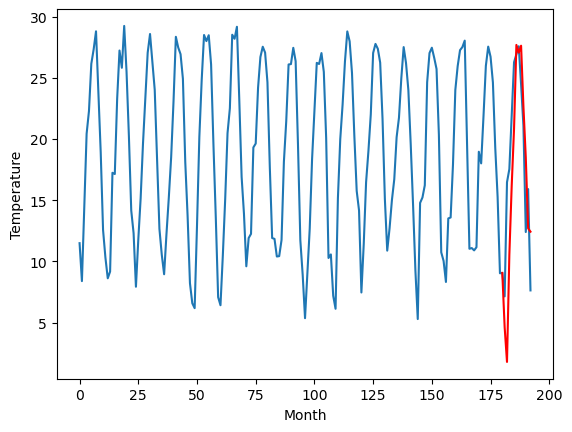

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
4.37		3.42		-0.95
0.91		0.59		-0.32
11.87		9.33		-2.54
13.56		14.96		1.40
17.72		19.65		1.93
23.40		26.49		3.09
24.99		25.85		0.86
25.36		26.42		1.06
22.57		21.44		-1.13
17.92		17.29		-0.63
9.92		11.50		1.58
11.92		11.23		-0.69
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.48, 3.4231381797790528, 0.5874357604980469, 9.325765647888183, 14.961496391296386, 19.65050033569336, 26.48736099243164, 25.85423169374466, 26.42496661186218, 21.43661955833435, 17.28786591529846, 11.500798978805541, 11.22913161754608]


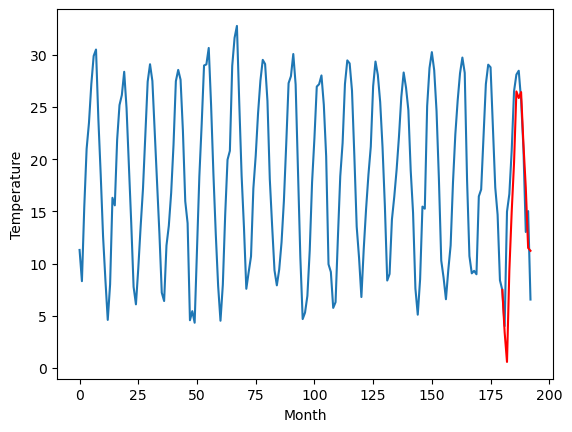

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.61		10.34		-1.27
7.72		7.51		-0.21
18.64		16.25		-2.39
20.82		21.88		1.06
24.35		26.57		2.22
31.20		33.41		2.21
32.69		32.77		0.08
33.06		33.34		0.28
29.63		28.36		-1.27
24.76		24.21		-0.55
16.92		18.42		1.50
18.66		18.15		-0.51
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.33, 10.343138179779054, 7.507435760498048, 16.245765647888184, 21.881496391296388, 26.57050033569336, 33.40736099243164, 32.77423169374466, 33.34496661186218, 28.35661955833435, 24.207865915298463, 18.420798978805543, 18.149131617546082]


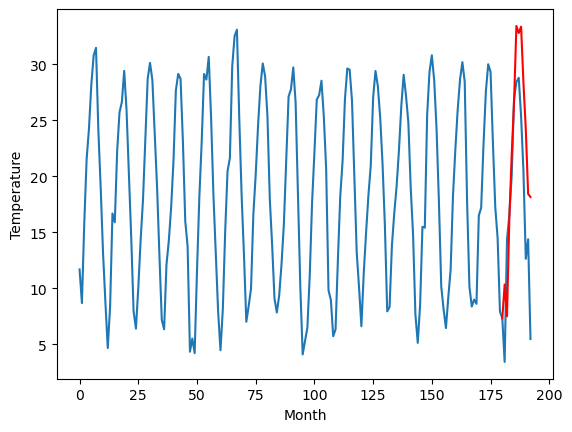

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.42		12.65		-0.77
11.85		9.82		-2.03
21.10		18.56		-2.54
23.33		24.19		0.86
28.82		28.88		0.06
33.78		35.72		1.94
33.52		35.08		1.56
33.84		35.65		1.81
33.15		30.67		-2.48
27.45		26.52		-0.93
20.51		20.73		0.22
20.92		20.46		-0.46
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.59, 12.653138179779052, 9.817435760498046, 18.555765647888183, 24.191496391296386, 28.88050033569336, 35.71736099243164, 35.084231693744655, 35.65496661186218, 30.666619558334347, 26.517865915298458, 20.730798978805538, 20.459131617546078]


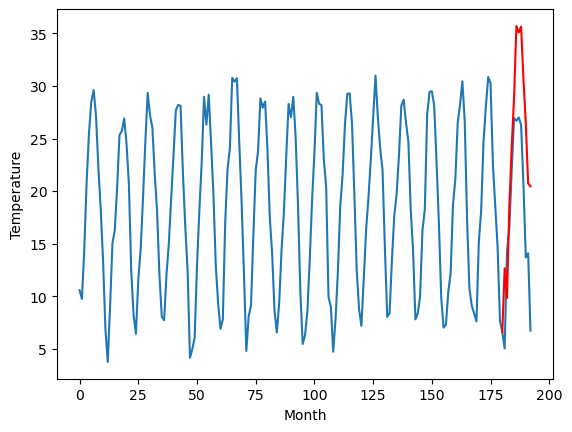

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.14		7.04		-2.10
9.81		4.21		-5.60
16.21		12.95		-3.26
18.94		18.58		-0.36
22.39		23.27		0.88
26.41		30.11		3.70
28.15		29.47		1.32
28.28		30.04		1.76
24.31		25.06		0.75
20.51		20.91		0.40
12.35		15.12		2.77
14.26		14.85		0.59
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.04, 7.043138179779053, 4.207435760498047, 12.945765647888184, 18.581496391296387, 23.27050033569336, 30.10736099243164, 29.47423169374466, 30.044966611862183, 25.05661955833435, 20.907865915298462, 15.120798978805542, 14.849131617546082]


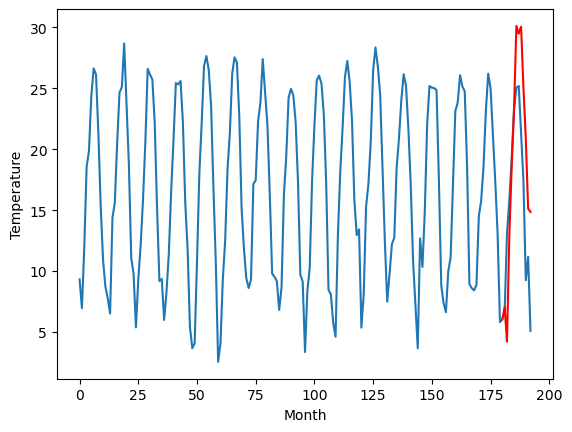

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.56		12.36		-0.20
8.95		9.53		0.58
21.22		18.27		-2.95
23.12		23.90		0.78
27.16		28.59		1.43
33.46		35.43		1.97
34.75		34.79		0.04
35.27		35.36		0.09
32.23		30.38		-1.85
26.46		26.23		-0.23
18.52		20.44		1.92
19.98		20.17		0.19
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.13, 12.363138179779053, 9.527435760498047, 18.265765647888184, 23.901496391296387, 28.59050033569336, 35.427360992431645, 34.79423169374466, 35.36496661186219, 30.376619558334355, 26.227865915298466, 20.440798978805546, 20.169131617546086]


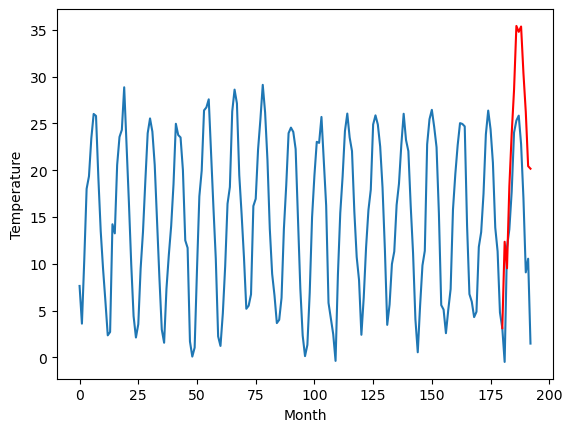

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.72		11.43		-0.29
8.36		8.60		0.24
20.33		17.34		-2.99
23.98		22.97		-1.01
28.39		27.66		-0.73
35.63		34.50		-1.13
36.20		33.86		-2.34
37.06		34.43		-2.63
33.57		29.45		-4.12
28.22		25.30		-2.92
17.36		19.51		2.15
17.68		19.24		1.56
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.29, 11.433138179779053, 8.597435760498048, 17.335765647888184, 22.971496391296387, 27.66050033569336, 34.49736099243164, 33.86423169374466, 34.43496661186218, 29.446619558334348, 25.29786591529846, 19.51079897880554, 19.23913161754608]


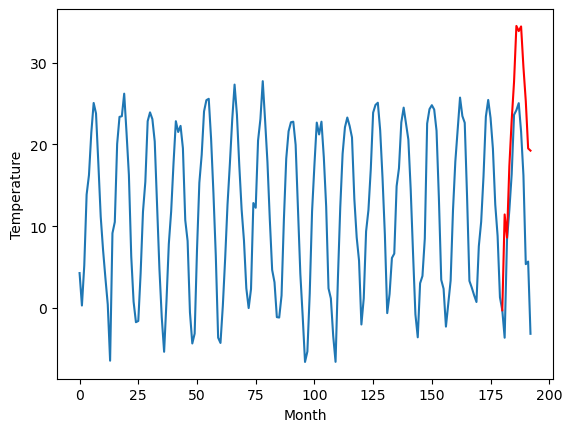

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.76		8.92		0.16
4.32		6.09		1.77
18.18		14.83		-3.35
21.89		20.46		-1.43
26.67		25.15		-1.52
34.06		31.99		-2.07
33.77		31.35		-2.42
34.05		31.92		-2.13
30.94		26.94		-4.00
25.48		22.79		-2.69
15.17		17.00		1.83
14.92		16.73		1.81
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-1.03, 8.923138179779052, 6.087435760498046, 14.825765647888183, 20.461496391296386, 25.15050033569336, 31.98736099243164, 31.35423169374466, 31.92496661186218, 26.93661955833435, 22.78786591529846, 17.00079897880554, 16.72913161754608]


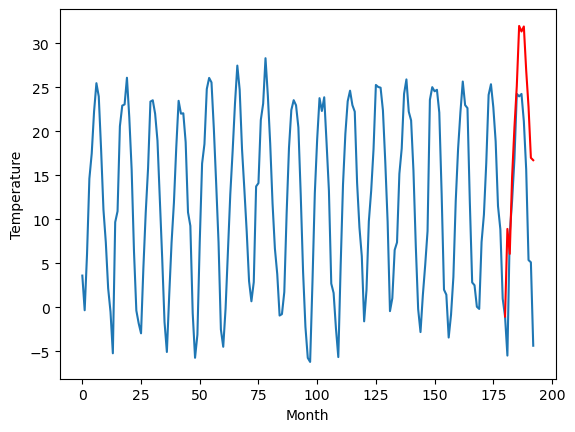

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.93		6.98		0.05
4.69		4.15		-0.54
14.58		12.89		-1.69
18.38		18.52		0.14
22.91		23.21		0.30
29.80		30.05		0.25
29.96		29.41		-0.55
31.16		29.98		-1.18
26.87		25.00		-1.87
23.34		20.85		-2.49
12.94		15.06		2.12
12.08		14.79		2.71
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-2.29, 6.983138179779052, 4.1474357604980465, 12.885765647888183, 18.521496391296388, 23.21050033569336, 30.047360992431642, 29.41423169374466, 29.984966611862184, 24.996619558334352, 20.847865915298463, 15.060798978805543, 14.789131617546083]


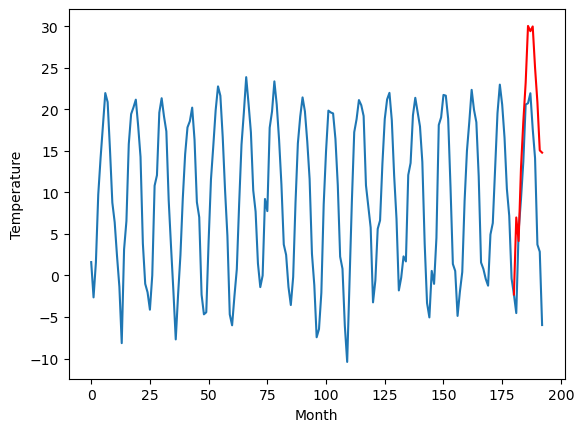

RangeIndex(start=1, stop=12, step=1)
[7.340000000000001, 8.569999999999999, 6.520000000000002, 4.370000000000001, 11.610000000000001, 13.419999999999998, 9.139999999999999, 12.56, 11.72, 8.759999999999998, 6.93]
[6.983138179779052, 6.003138179779053, 4.623138179779053, 3.4231381797790528, 10.343138179779054, 12.653138179779052, 7.043138179779053, 12.363138179779053, 11.433138179779053, 8.923138179779052, 6.983138179779052]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    7.34   6.983138
1                 1    8.57   6.003138
2                 2    6.52   4.623138
3                 3    4.37   3.423138
4                 4   11.61  10.343138
5                 5   13.42  12.653138
6                 6    9.14   7.043138
7                 7   12.56  12.363138
8                 8   11.72  11.433138
9                 9    8.76   8.923138
10               10    6.93   6.983138


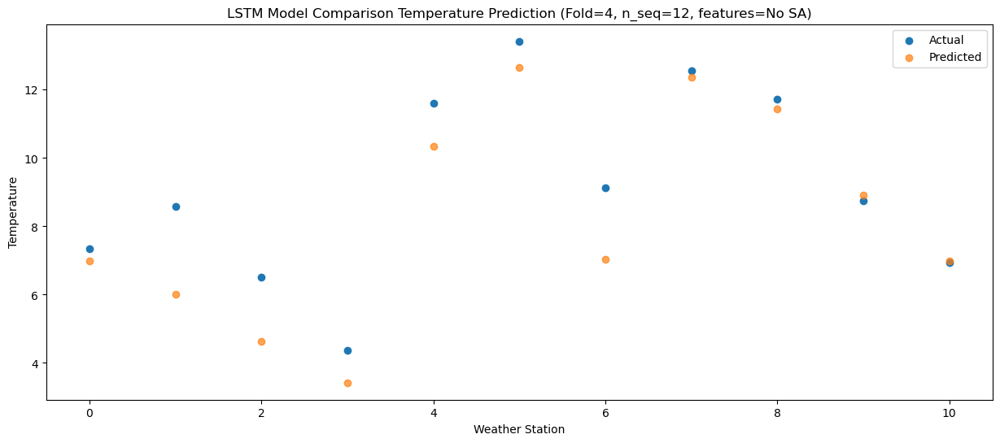

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.21   4.147436
1                 1   12.00   3.167436
2                 2    4.60   1.787436
3                 3    0.91   0.587436
4                 4    7.72   7.507436
5                 5   11.85   9.817436
6                 6    9.81   4.207436
7                 7    8.95   9.527436
8                 8    8.36   8.597436
9                 9    4.32   6.087436
10               10    4.69   4.147436


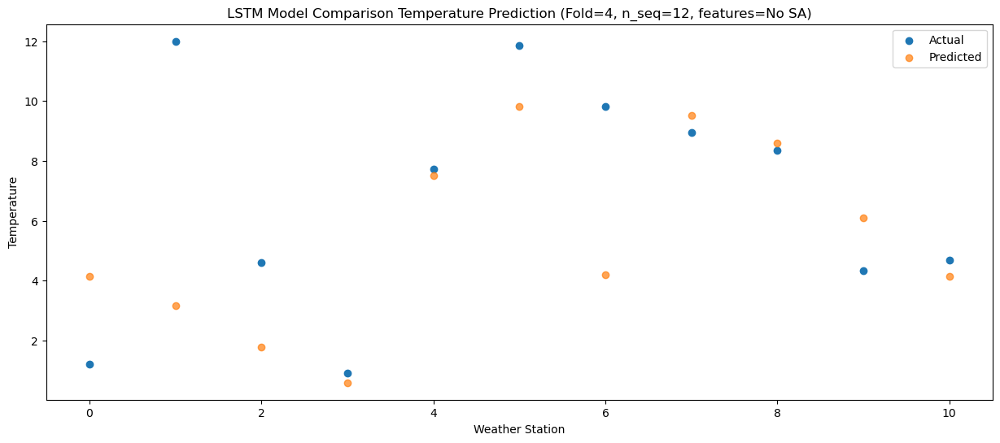

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   15.94  12.885766
1                 1   13.60  11.905766
2                 2   13.93  10.525766
3                 3   11.87   9.325766
4                 4   18.64  16.245766
5                 5   21.10  18.555766
6                 6   16.21  12.945766
7                 7   21.22  18.265766
8                 8   20.33  17.335766
9                 9   18.18  14.825766
10               10   14.58  12.885766


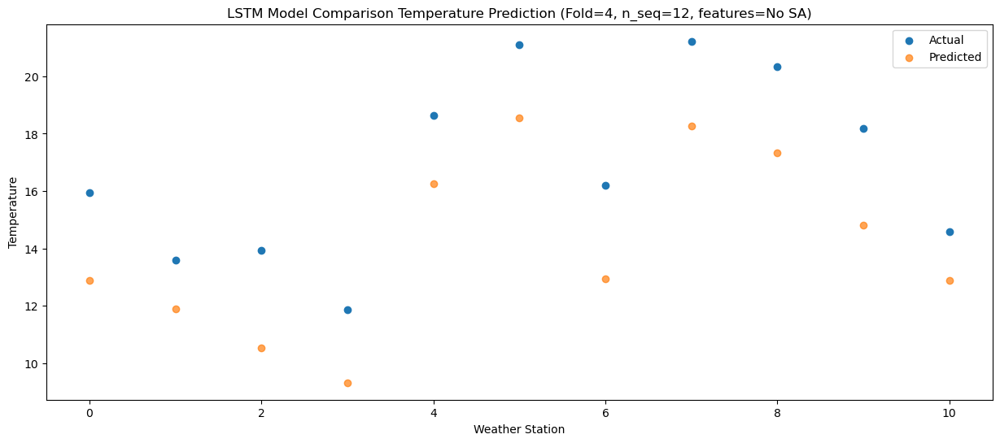

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   18.85  18.521496
1                 1   15.04  17.541496
2                 2   15.00  16.161496
3                 3   13.56  14.961496
4                 4   20.82  21.881496
5                 5   23.33  24.191496
6                 6   18.94  18.581496
7                 7   23.12  23.901496
8                 8   23.98  22.971496
9                 9   21.89  20.461496
10               10   18.38  18.521496


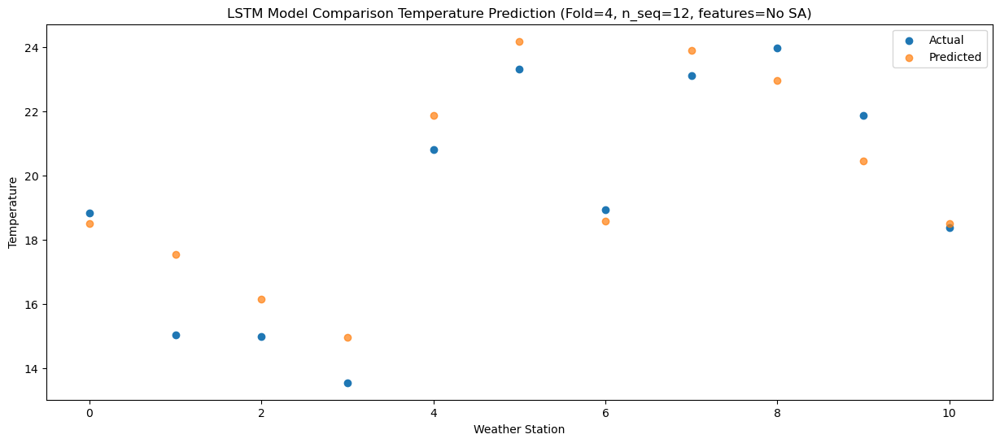

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   23.06    23.2105
1                 1   19.08    22.2305
2                 2   19.47    20.8505
3                 3   17.72    19.6505
4                 4   24.35    26.5705
5                 5   28.82    28.8805
6                 6   22.39    23.2705
7                 7   27.16    28.5905
8                 8   28.39    27.6605
9                 9   26.67    25.1505
10               10   22.91    23.2105


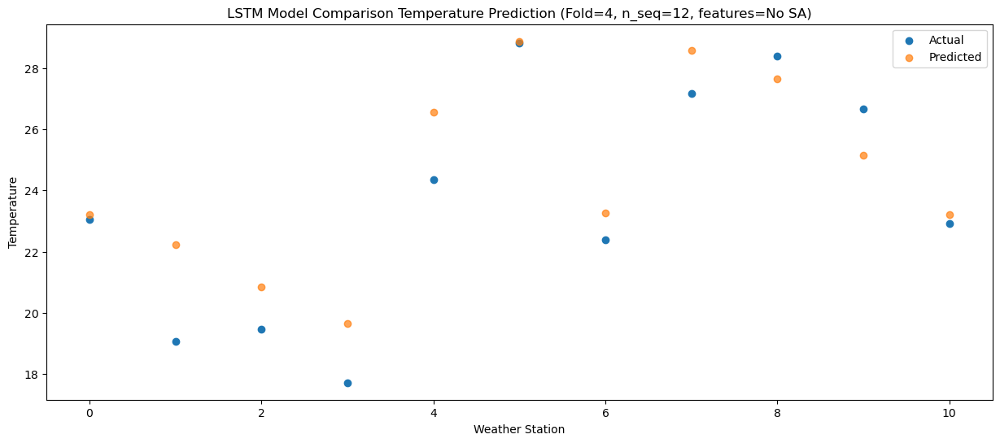

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   30.97  30.047361
1                 1   20.71  29.067361
2                 2   23.73  27.687361
3                 3   23.40  26.487361
4                 4   31.20  33.407361
5                 5   33.78  35.717361
6                 6   26.41  30.107361
7                 7   33.46  35.427361
8                 8   35.63  34.497361
9                 9   34.06  31.987361
10               10   29.80  30.047361


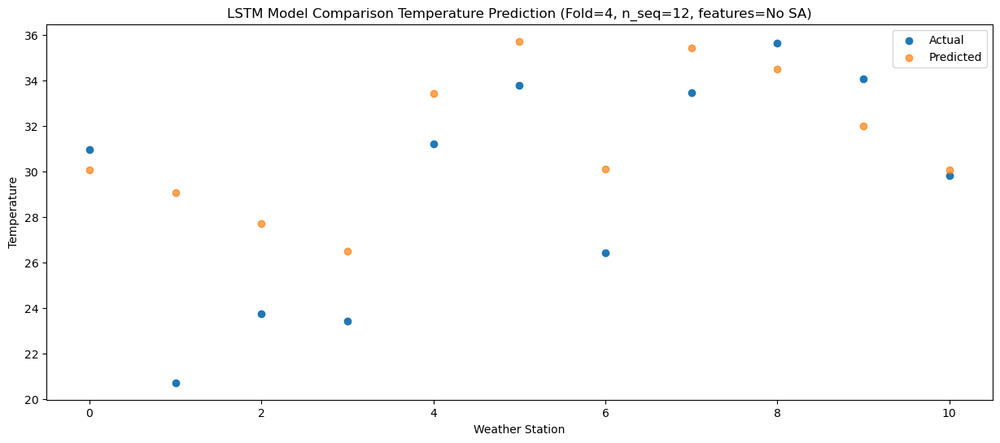

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   31.77  29.414232
1                 1   21.08  28.434232
2                 2   24.39  27.054232
3                 3   24.99  25.854232
4                 4   32.69  32.774232
5                 5   33.52  35.084232
6                 6   28.15  29.474232
7                 7   34.75  34.794232
8                 8   36.20  33.864232
9                 9   33.77  31.354232
10               10   29.96  29.414232


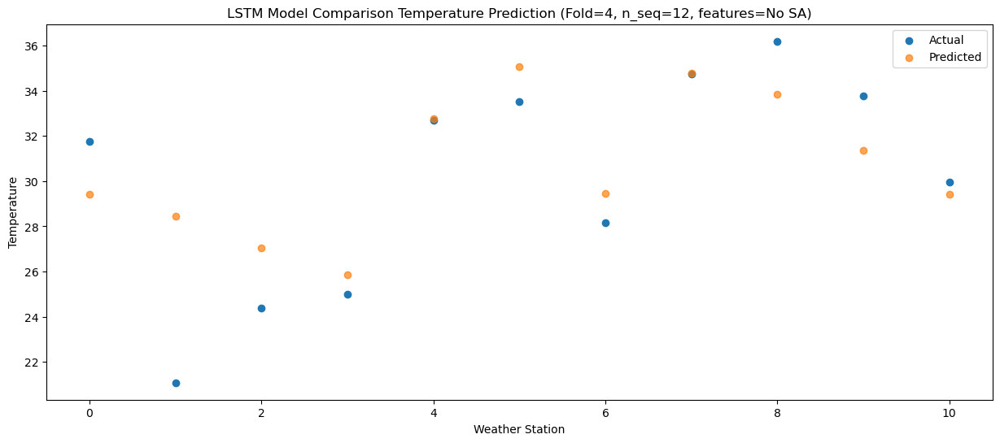

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   32.17  29.984967
1                 1   21.36  29.004967
2                 2   25.04  27.624967
3                 3   25.36  26.424967
4                 4   33.06  33.344967
5                 5   33.84  35.654967
6                 6   28.28  30.044967
7                 7   35.27  35.364967
8                 8   37.06  34.434967
9                 9   34.05  31.924967
10               10   31.16  29.984967


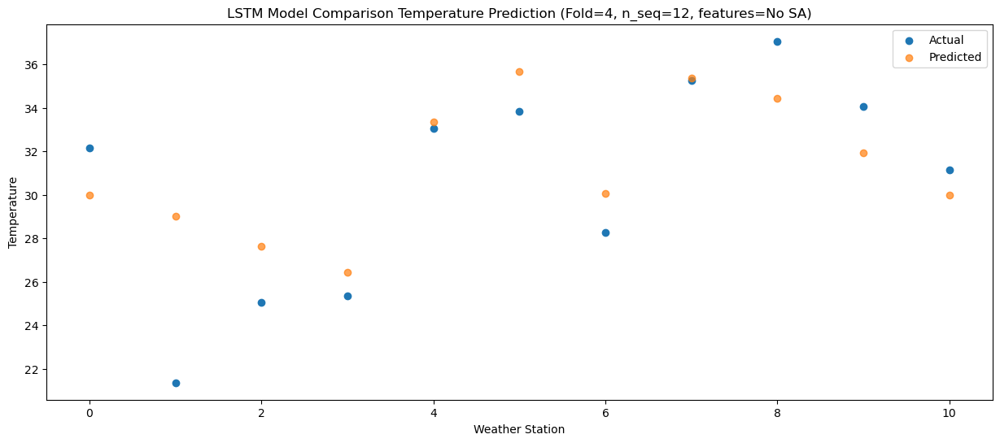

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   28.98   24.99662
1                 1   20.07   24.01662
2                 2   21.92   22.63662
3                 3   22.57   21.43662
4                 4   29.63   28.35662
5                 5   33.15   30.66662
6                 6   24.31   25.05662
7                 7   32.23   30.37662
8                 8   33.57   29.44662
9                 9   30.94   26.93662
10               10   26.87   24.99662


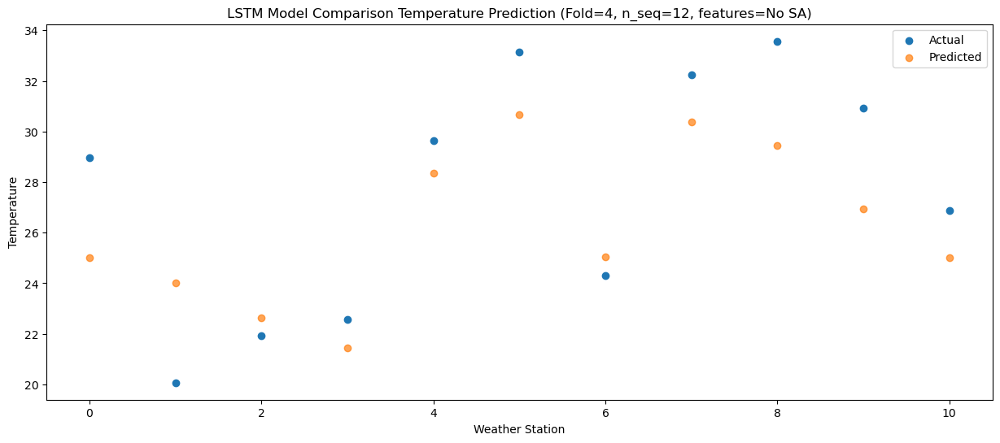

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   21.85  20.847866
1                 1   18.23  19.867866
2                 2   18.53  18.487866
3                 3   17.92  17.287866
4                 4   24.76  24.207866
5                 5   27.45  26.517866
6                 6   20.51  20.907866
7                 7   26.46  26.227866
8                 8   28.22  25.297866
9                 9   25.48  22.787866
10               10   23.34  20.847866


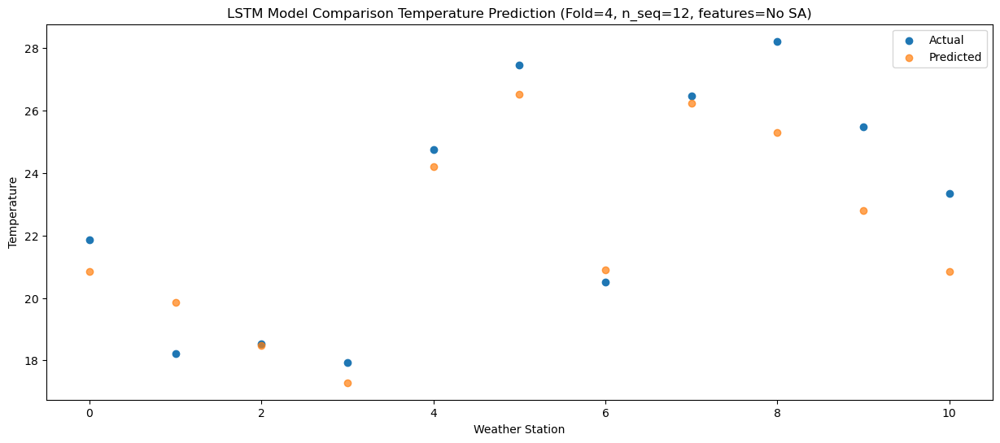

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0   14.79  15.060799
1                 1   11.07  14.080799
2                 2    9.86  12.700799
3                 3    9.92  11.500799
4                 4   16.92  18.420799
5                 5   20.51  20.730799
6                 6   12.35  15.120799
7                 7   18.52  20.440799
8                 8   17.36  19.510799
9                 9   15.17  17.000799
10               10   12.94  15.060799


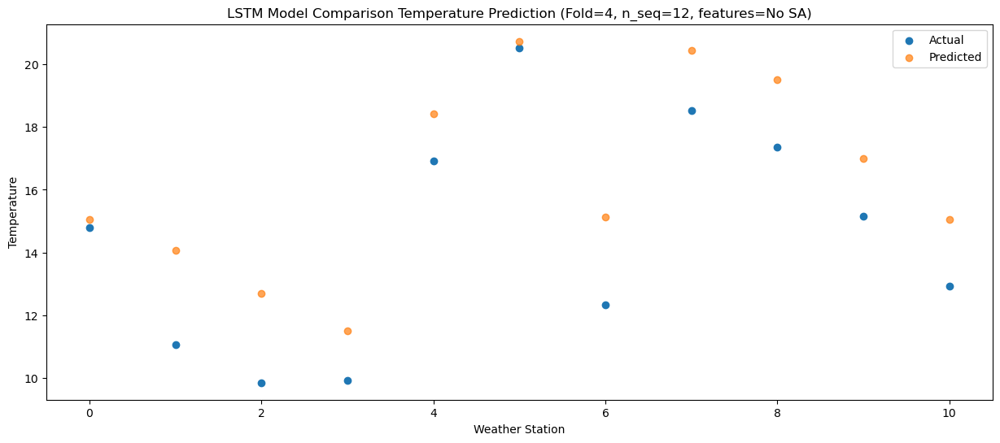

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   13.00  14.789132
1                 1   12.87  13.809132
2                 2   13.37  12.429132
3                 3   11.92  11.229132
4                 4   18.66  18.149132
5                 5   20.92  20.459132
6                 6   14.26  14.849132
7                 7   19.98  20.169132
8                 8   17.68  19.239132
9                 9   14.92  16.729132
10               10   12.08  14.789132


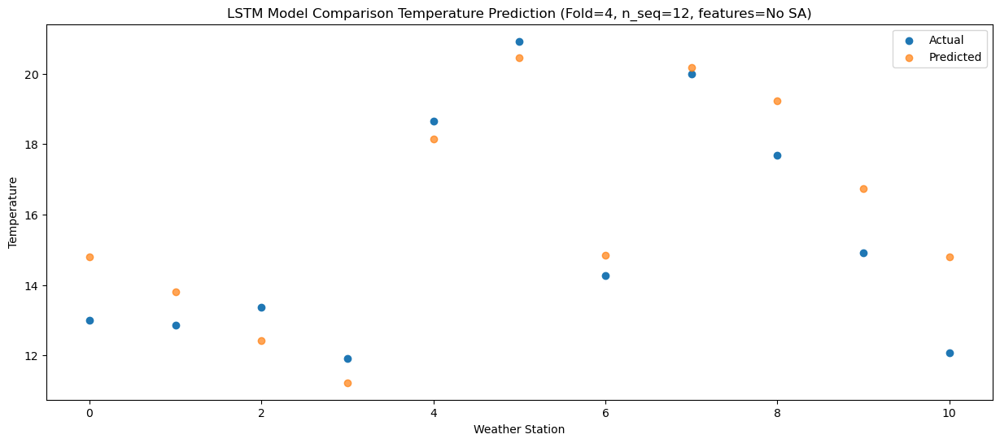

Model: "sequential_505"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1010 (LSTM)            (1, 1, 1024)              12263424  
                                                                 
 dropout_1010 (Dropout)      (1, 1, 1024)              0         
                                                                 
 lstm_1011 (LSTM)            (1, 1024)                 8392704   
                                                                 
 dropout_1011 (Dropout)      (1, 1024)                 0         
                                                                 
 dense_1515 (Dense)          (1, 256)                  262400    
                                                                 
 dense_1516 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1517 (Dense)          (1, 12)                

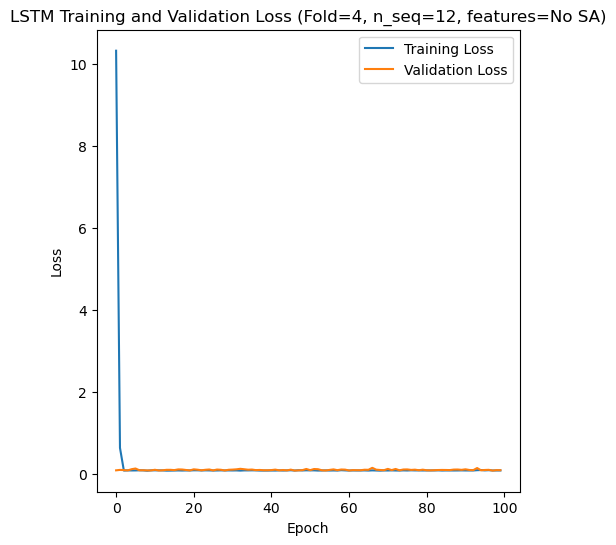

[[1.8210816417547078, 2.565819926016294, 1.5095409335496472, 1.247684571918542, 1.4113023552153017, 2.9282792574136365, 2.6860023968065816, 2.8331080949270318, 2.2059617943544794, 1.8480840826809553, 1.4594801047189814, 1.5394259888203432], [0.834627777461759, 2.1507055166229843, 1.0800478684819026, 1.2212218400211388, 1.2226093674633731, 2.439105359254587, 2.3932539642499324, 2.8549400534257794, 3.2819318868865905, 1.6355307910489207, 1.271552800114374, 1.135923625121851], [1.138848769727054, 4.155036580778736, 6.072780175465244, 5.1666876633797, 6.215245449066066, 7.710703215699835, 8.850343348712808, 7.651162609533194, 7.411767918905983, 5.329700914872509, 4.312972297077946, 3.142102444518999], [1.4065225510301806, 3.3760786151498126, 2.3196391313538456, 3.283605863590545, 3.511925110305152, 4.487246806045455, 5.543746072983579, 4.7015407942564735, 4.211910188799964, 3.580087185782634, 4.2557385819755025, 3.0118252125830143], [1.2774651556323597, 3.490643664304157, 2.778745433860253

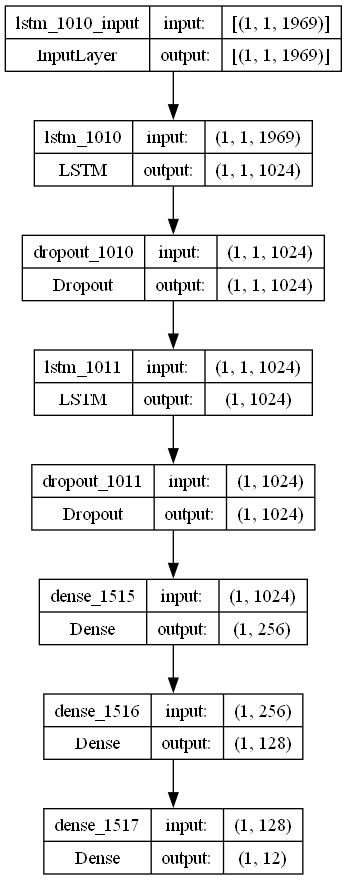

In [9]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

# fit best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from best model
    lr =  0.10726989880675146
    optimizer = Adam(learning_rate = lr)
    activation_function = 'relu'
    lstm_units = 1024
    dropout_rate = 0.2894263795320246

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# make one forecast with an LSTM,
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Temperature")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='LSTM Model Comparison Temperature Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No SA)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Temperature')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No SA)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "lstm_model_optimized_CV_S12_No_SA.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)